## This notebook aims to visualize the different asset distributions produced by CGAN

In [1]:
import os
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from scipy.spatial.distance import pdist
import sys
from tqdm import tqdm

parent_dir = os.path.abspath(os.path.join(os.getcwd(), "../../../"))
sys.path.insert(0, parent_dir)

from utilities.gan_plotting import extensive_plotting
from utilities.backtesting_plots import backtest_var_single_asset
from utilities.gan_plotting import load_generated_returns
from backtesting.perform_var_tests import perform_var_backtesting_tests
from backtesting.perform_distribution_tests import perform_distribution_tests
from utilities.gan_plotting import create_rolling_empirical
from sklearn.preprocessing import StandardScaler

from dotenv.main import load_dotenv
load_dotenv(override=True)
import os


In [2]:
import os
print(os.getcwd())

c:\Users\nicka\master-thesis\internal_models\GANs\tuned_GANS


### Parameters

In [3]:
assets_0 = int(os.getenv("INIT_ASSETS"))
liabilities_0 = int(os.getenv("INIT_ASSETS")) * float(os.getenv("FRAC_LIABILITIES"))
num_simulations = int(os.getenv("N_SIMULATIONS"))
bof_0 = assets_0 - liabilities_0

## Note to self -- We only test assets MSCIWORLD, HY and EONIA

In [4]:
def fetch_data_df():
    # Load the data
    df = pd.read_csv('../../../data/final_daily_returns_asset_classes.csv', index_col=0, parse_dates=True)
    df.index = pd.to_datetime(df.index)
    start_test_date = os.getenv("START_TEST_DATE")
    
    if start_test_date is None:
        raise ValueError("Environment variable 'START_TEST_DATE' is not set.")

    start_test_date = pd.to_datetime(start_test_date)

    columns = [0,1,2,3,4,5,6]#[0,1,2,4]
    selected_columns = df.iloc[:, columns]  # Remember: Python uses 0-based indexing

    pre_test_df = selected_columns[selected_columns.index < start_test_date]
    test_df = selected_columns[selected_columns.index >= start_test_date].iloc[:]
    
    return pre_test_df, test_df

returns_df, test_returns_df = fetch_data_df()

In [5]:
asset_names = returns_df.columns

num_assets = returns_df.shape[1]
weights = np.full(num_assets, 1 / num_assets)  

## TRAINING CGAN

In [ ]:
from OliviaGAN import OliviaGAN
from MarketGAN import MarketGAN
from FashionGAN import FashionGAN

gan_dict = {}
def train_new_gans():
    for asset_name in tqdm(returns_df.columns, desc="Training GANs", unit="asset"):
        print(f"Training GAN for {asset_name}...")
        asset_returns = returns_df[asset_name]
        
        gan = FashionGAN(asset_returns, asset_name)
        gan.train()
        print(f"Finished training GAN for {asset_name}.\n")
        
        gan_dict[asset_name] = gan

def train_gans():
    for asset_name in tqdm(returns_df.columns, desc="Training GANs", unit="asset"):
        print(f"Training GAN for {asset_name}...")
        gan_dict[asset_name].train()
        print(f"Finished training GAN for {asset_name}.\n")
        
train_new_gans()

Training GANs:   0%|          | 0/7 [00:00<?, ?asset/s]

Training GAN for REEL...


In [ ]:
from scipy.stats import gaussian_kde
def process_bof_var(bof_change, scr):
    bof_change_millions = np.array(bof_change) / 1e6
    scr_millions = scr / 1e6
    
    kde = gaussian_kde(bof_change_millions, bw_method=0.1)
    
    return {
        'kde': kde,  # Store only the KDE function
        'scr_millions': scr_millions,
    }

def plot_3d_density(data_collection, x_range=np.linspace(-1, 1, 200)):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Create a blue color gradient from light to dark
    num_curves = len(data_collection)
    blues = plt.cm.Blues(np.linspace(0.3, 0.9, num_curves))
    
    # Collect SCR points for the line
    scr_x_values = []
    scr_y_values = []
    
    # Plot density curves and collect SCR points
    for i, data in enumerate(data_collection):
        density = data['kde'](x_range)
        
        # Plot density curve with gradient blue colors
        ax.plot(x_range, np.ones_like(x_range) * i, density, 
                linewidth=2, color=blues[i])
        
        # Collect SCR point
        scr_val = data['scr_millions']
        if scr_val >= -1 and scr_val <= 1:
            scr_x_values.append(scr_val)
            scr_y_values.append(i)
    
    # Plot a black line through all the SCR points
    if scr_x_values:
        ax.plot(scr_x_values, scr_y_values, np.zeros_like(scr_y_values), 
                color='black', linewidth=2)
    
    # Set labels for axes
    ax.set_xlabel('Change in Millions')
    ax.set_zlabel('Density')
    
    # Keep only specific y-ticks (every 10th position)
    y_ticks = list(range(0, num_curves, 100))
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([str(y) for y in y_ticks])
    
    # Turn off the grid
    ax.grid(False)
    
    # Remove background panes
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')
    
    # Make tick marks visible
    ax.tick_params(axis='y', which='major', length=6, width=1)
    
    # Set view angle for better visualization
    ax.view_init(30, 45)
    
    return fig

Processing Dates:   0%|          | 0/1232 [00:00<?, ?dates/s]

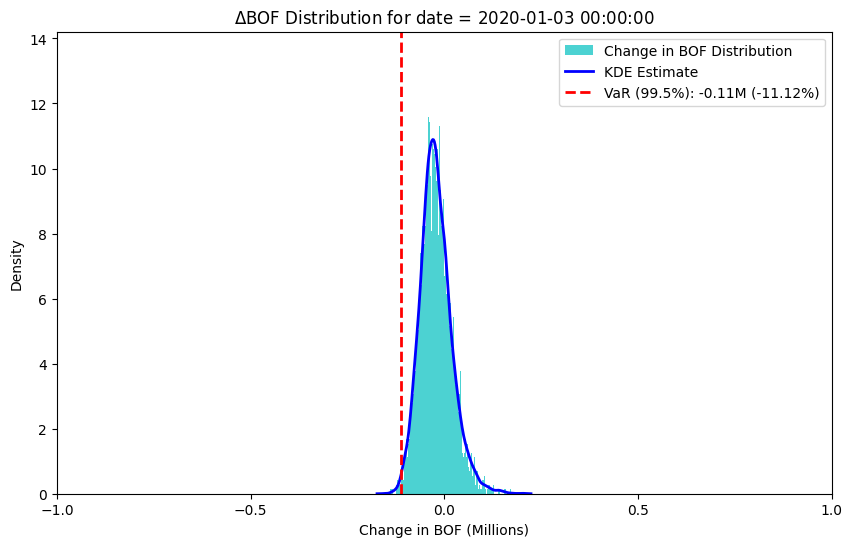

Processing Dates:   0%|          | 1/1232 [00:07<2:39:50,  7.79s/dates]

scr = -111188.30577632629


Processing Dates:   0%|          | 2/1232 [00:14<2:32:04,  7.42s/dates]

scr = -112479.31709800991


Processing Dates:   0%|          | 3/1232 [00:22<2:29:49,  7.31s/dates]

scr = -112619.63493958063


Processing Dates:   0%|          | 4/1232 [00:29<2:28:41,  7.26s/dates]

scr = -113183.16624211168


Processing Dates:   0%|          | 5/1232 [00:36<2:28:16,  7.25s/dates]

scr = -114724.02075622564


Processing Dates:   0%|          | 6/1232 [00:43<2:27:02,  7.20s/dates]

scr = -110172.93772632595


Processing Dates:   1%|          | 7/1232 [00:50<2:26:06,  7.16s/dates]

scr = -111372.86919572546


Processing Dates:   1%|          | 8/1232 [00:57<2:25:52,  7.15s/dates]

scr = -110595.08254859377


Processing Dates:   1%|          | 9/1232 [01:04<2:25:16,  7.13s/dates]

scr = -112441.86258627212


Processing Dates:   1%|          | 10/1232 [01:12<2:24:56,  7.12s/dates]

scr = -112696.23375937041


Processing Dates:   1%|          | 11/1232 [01:19<2:24:46,  7.11s/dates]

scr = -114177.77570772164


Processing Dates:   1%|          | 12/1232 [01:26<2:24:03,  7.09s/dates]

scr = -113275.9151902227


Processing Dates:   1%|          | 13/1232 [01:33<2:23:36,  7.07s/dates]

scr = -113040.63747709812


Processing Dates:   1%|          | 14/1232 [01:40<2:23:14,  7.06s/dates]

scr = -113716.3686890738


Processing Dates:   1%|          | 15/1232 [01:47<2:23:40,  7.08s/dates]

scr = -112479.7599614225


Processing Dates:   1%|▏         | 16/1232 [01:54<2:23:28,  7.08s/dates]

scr = -110519.13386063717


Processing Dates:   1%|▏         | 17/1232 [02:01<2:23:57,  7.11s/dates]

scr = -113147.55659199848


Processing Dates:   1%|▏         | 18/1232 [02:08<2:23:31,  7.09s/dates]

scr = -112703.72392013011


Processing Dates:   2%|▏         | 19/1232 [02:15<2:23:47,  7.11s/dates]

scr = -112967.0928360284


Processing Dates:   2%|▏         | 20/1232 [02:23<2:24:07,  7.13s/dates]

scr = -113336.40552414762


Processing Dates:   2%|▏         | 21/1232 [02:30<2:23:39,  7.12s/dates]

scr = -112394.67438123692


Processing Dates:   2%|▏         | 22/1232 [02:37<2:23:22,  7.11s/dates]

scr = -115628.08417939866


Processing Dates:   2%|▏         | 23/1232 [02:44<2:23:26,  7.12s/dates]

scr = -112550.09326800477


Processing Dates:   2%|▏         | 24/1232 [02:51<2:24:03,  7.16s/dates]

scr = -112692.50519157402


Processing Dates:   2%|▏         | 25/1232 [02:58<2:23:26,  7.13s/dates]

scr = -109893.14347921913


Processing Dates:   2%|▏         | 26/1232 [03:05<2:22:53,  7.11s/dates]

scr = -111430.54369706007


Processing Dates:   2%|▏         | 27/1232 [03:12<2:22:33,  7.10s/dates]

scr = -111026.81836299614


Processing Dates:   2%|▏         | 28/1232 [03:19<2:22:49,  7.12s/dates]

scr = -113374.56206587388


Processing Dates:   2%|▏         | 29/1232 [03:27<2:22:54,  7.13s/dates]

scr = -112647.6033940234


Processing Dates:   2%|▏         | 30/1232 [03:34<2:22:46,  7.13s/dates]

scr = -114648.95938526961


Processing Dates:   3%|▎         | 31/1232 [03:41<2:22:14,  7.11s/dates]

scr = -110677.09607285366


Processing Dates:   3%|▎         | 32/1232 [03:48<2:22:07,  7.11s/dates]

scr = -110328.53946591789


Processing Dates:   3%|▎         | 33/1232 [03:55<2:23:12,  7.17s/dates]

scr = -111789.18550801407


Processing Dates:   3%|▎         | 34/1232 [04:02<2:22:56,  7.16s/dates]

scr = -113869.39428171163


Processing Dates:   3%|▎         | 35/1232 [04:10<2:23:01,  7.17s/dates]

scr = -109420.22253910887


Processing Dates:   3%|▎         | 36/1232 [04:17<2:22:13,  7.13s/dates]

scr = -113192.23273287641


Processing Dates:   3%|▎         | 37/1232 [04:24<2:22:31,  7.16s/dates]

scr = -110399.13578110006


Processing Dates:   3%|▎         | 38/1232 [04:31<2:22:13,  7.15s/dates]

scr = -110934.98980574196


Processing Dates:   3%|▎         | 39/1232 [04:38<2:22:39,  7.17s/dates]

scr = -114459.36252308436


Processing Dates:   3%|▎         | 40/1232 [04:45<2:22:16,  7.16s/dates]

scr = -110653.05560544156


Processing Dates:   3%|▎         | 41/1232 [04:52<2:21:59,  7.15s/dates]

scr = -114777.54656181873


Processing Dates:   3%|▎         | 42/1232 [05:00<2:21:47,  7.15s/dates]

scr = -110887.58631908425


Processing Dates:   3%|▎         | 43/1232 [05:07<2:21:31,  7.14s/dates]

scr = -110660.95157789506


Processing Dates:   4%|▎         | 44/1232 [05:14<2:22:35,  7.20s/dates]

scr = -113468.71212531504


Processing Dates:   4%|▎         | 45/1232 [05:21<2:22:55,  7.22s/dates]

scr = -111860.35793380454


Processing Dates:   4%|▎         | 46/1232 [05:29<2:23:14,  7.25s/dates]

scr = -112615.28321522028


Processing Dates:   4%|▍         | 47/1232 [05:36<2:23:24,  7.26s/dates]

scr = -110588.82540245062


Processing Dates:   4%|▍         | 48/1232 [05:43<2:24:03,  7.30s/dates]

scr = -110702.5330889619


Processing Dates:   4%|▍         | 49/1232 [05:51<2:24:41,  7.34s/dates]

scr = -113263.2268881306


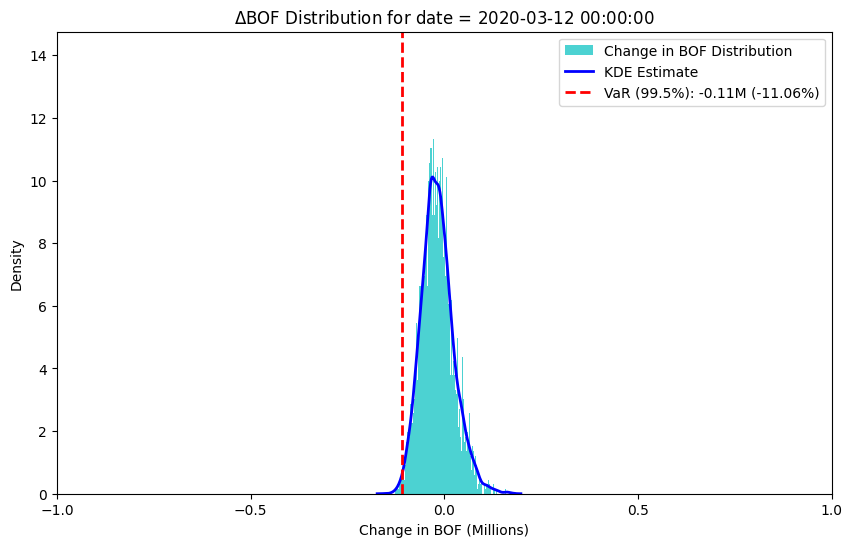

Processing Dates:   4%|▍         | 50/1232 [05:58<2:27:13,  7.47s/dates]

scr = -110644.17010660979


Processing Dates:   4%|▍         | 51/1232 [06:06<2:26:12,  7.43s/dates]

scr = -114725.89298415594


Processing Dates:   4%|▍         | 52/1232 [06:13<2:25:19,  7.39s/dates]

scr = -113185.35935131615


Processing Dates:   4%|▍         | 53/1232 [06:20<2:24:40,  7.36s/dates]

scr = -115056.39918654294


Processing Dates:   4%|▍         | 54/1232 [06:28<2:24:01,  7.34s/dates]

scr = -116869.32653852459


Processing Dates:   4%|▍         | 55/1232 [06:35<2:23:26,  7.31s/dates]

scr = -113247.59296585074


Processing Dates:   5%|▍         | 56/1232 [06:42<2:23:29,  7.32s/dates]

scr = -115370.31344284063


Processing Dates:   5%|▍         | 57/1232 [06:49<2:22:36,  7.28s/dates]

scr = -110735.07107122692


Processing Dates:   5%|▍         | 58/1232 [06:57<2:22:14,  7.27s/dates]

scr = -112396.49615914204


Processing Dates:   5%|▍         | 59/1232 [07:04<2:21:47,  7.25s/dates]

scr = -116153.60996483942


Processing Dates:   5%|▍         | 60/1232 [07:11<2:21:27,  7.24s/dates]

scr = -114797.44595179686


Processing Dates:   5%|▍         | 61/1232 [07:18<2:21:49,  7.27s/dates]

scr = -115786.55780136114


Processing Dates:   5%|▌         | 62/1232 [07:26<2:21:44,  7.27s/dates]

scr = -118381.07521408355


Processing Dates:   5%|▌         | 63/1232 [07:33<2:21:21,  7.26s/dates]

scr = -118829.38433642247


Processing Dates:   5%|▌         | 64/1232 [07:40<2:21:14,  7.26s/dates]

scr = -120613.44269310532


Processing Dates:   5%|▌         | 65/1232 [07:47<2:21:02,  7.25s/dates]

scr = -117967.1819051361


Processing Dates:   5%|▌         | 66/1232 [07:55<2:21:20,  7.27s/dates]

scr = -115942.61661663598


Processing Dates:   5%|▌         | 67/1232 [08:02<2:21:13,  7.27s/dates]

scr = -116945.00066238674


Processing Dates:   6%|▌         | 68/1232 [08:09<2:21:18,  7.28s/dates]

scr = -115633.25296792436


Processing Dates:   6%|▌         | 69/1232 [08:17<2:20:55,  7.27s/dates]

scr = -114278.09804674143


Processing Dates:   6%|▌         | 70/1232 [08:24<2:21:16,  7.29s/dates]

scr = -113801.5507403155


Processing Dates:   6%|▌         | 71/1232 [08:31<2:20:40,  7.27s/dates]

scr = -110337.95984367366


Processing Dates:   6%|▌         | 72/1232 [08:38<2:20:46,  7.28s/dates]

scr = -110114.39024012422


Processing Dates:   6%|▌         | 73/1232 [08:46<2:20:36,  7.28s/dates]

scr = -111050.02179926727


Processing Dates:   6%|▌         | 74/1232 [08:53<2:20:27,  7.28s/dates]

scr = -108396.76827024177


Processing Dates:   6%|▌         | 75/1232 [09:00<2:21:05,  7.32s/dates]

scr = -107634.05855888911


Processing Dates:   6%|▌         | 76/1232 [09:08<2:20:45,  7.31s/dates]

scr = -113681.50355503634


Processing Dates:   6%|▋         | 77/1232 [09:15<2:20:36,  7.30s/dates]

scr = -114242.38618880679


Processing Dates:   6%|▋         | 78/1232 [09:22<2:20:35,  7.31s/dates]

scr = -112705.23556009291


Processing Dates:   6%|▋         | 79/1232 [09:30<2:20:33,  7.31s/dates]

scr = -112309.8330259105


Processing Dates:   6%|▋         | 80/1232 [09:37<2:20:48,  7.33s/dates]

scr = -111022.52413624081


Processing Dates:   7%|▋         | 81/1232 [09:44<2:20:02,  7.30s/dates]

scr = -114058.89296246659


Processing Dates:   7%|▋         | 82/1232 [09:52<2:19:56,  7.30s/dates]

scr = -112805.93100760865


Processing Dates:   7%|▋         | 83/1232 [09:59<2:19:44,  7.30s/dates]

scr = -113217.7294623729


Processing Dates:   7%|▋         | 84/1232 [10:06<2:19:59,  7.32s/dates]

scr = -112645.09408704474


Processing Dates:   7%|▋         | 85/1232 [10:14<2:19:48,  7.31s/dates]

scr = -113152.0350420353


Processing Dates:   7%|▋         | 86/1232 [10:21<2:19:32,  7.31s/dates]

scr = -114543.36162403102


Processing Dates:   7%|▋         | 87/1232 [10:28<2:19:26,  7.31s/dates]

scr = -111559.90207227152


Processing Dates:   7%|▋         | 88/1232 [10:35<2:19:20,  7.31s/dates]

scr = -112381.57047383438


Processing Dates:   7%|▋         | 89/1232 [10:43<2:19:32,  7.33s/dates]

scr = -110365.86909373703


Processing Dates:   7%|▋         | 90/1232 [10:50<2:18:59,  7.30s/dates]

scr = -111524.03073080884


Processing Dates:   7%|▋         | 91/1232 [10:57<2:18:41,  7.29s/dates]

scr = -113877.82118767047


Processing Dates:   7%|▋         | 92/1232 [11:05<2:18:33,  7.29s/dates]

scr = -114498.65678378507


Processing Dates:   8%|▊         | 93/1232 [11:12<2:19:07,  7.33s/dates]

scr = -112091.92323729105


Processing Dates:   8%|▊         | 94/1232 [11:19<2:19:01,  7.33s/dates]

scr = -111989.08187385833


Processing Dates:   8%|▊         | 95/1232 [11:27<2:19:09,  7.34s/dates]

scr = -109157.05956353046


Processing Dates:   8%|▊         | 96/1232 [11:34<2:18:56,  7.34s/dates]

scr = -113873.74237936283


Processing Dates:   8%|▊         | 97/1232 [11:41<2:18:31,  7.32s/dates]

scr = -114622.06767203461


Processing Dates:   8%|▊         | 98/1232 [11:49<2:18:54,  7.35s/dates]

scr = -114118.6473701968


Processing Dates:   8%|▊         | 99/1232 [11:56<2:18:59,  7.36s/dates]

scr = -114816.51119401655


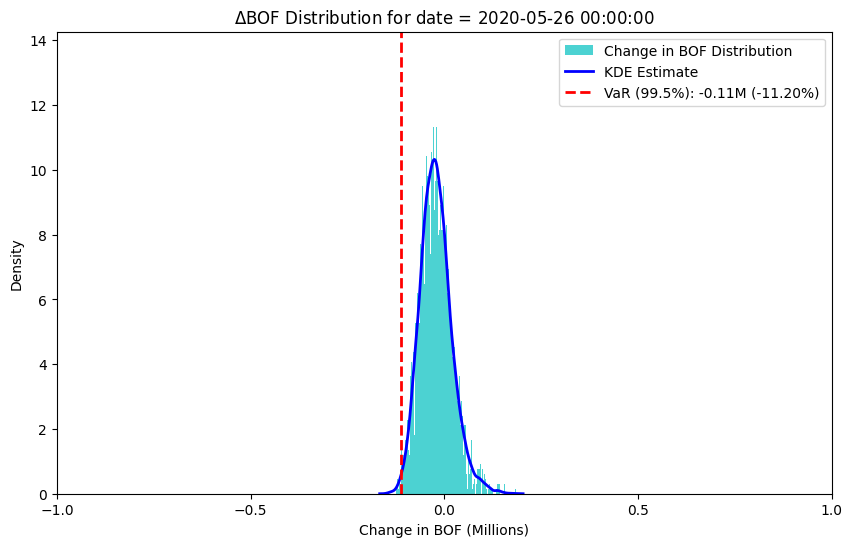

Processing Dates:   8%|▊         | 100/1232 [12:04<2:21:58,  7.52s/dates]

scr = -111979.76071126937


Processing Dates:   8%|▊         | 101/1232 [12:11<2:21:16,  7.49s/dates]

scr = -114630.00131472989


Processing Dates:   8%|▊         | 102/1232 [12:19<2:20:39,  7.47s/dates]

scr = -112763.23929837356


Processing Dates:   8%|▊         | 103/1232 [12:26<2:20:05,  7.45s/dates]

scr = -115276.56363687517


Processing Dates:   8%|▊         | 104/1232 [12:34<2:19:39,  7.43s/dates]

scr = -114704.65578734543


Processing Dates:   9%|▊         | 105/1232 [12:41<2:18:42,  7.38s/dates]

scr = -113894.1068548312


Processing Dates:   9%|▊         | 106/1232 [12:48<2:18:56,  7.40s/dates]

scr = -112888.62022765577


Processing Dates:   9%|▊         | 107/1232 [12:56<2:18:28,  7.39s/dates]

scr = -115450.5083785221


Processing Dates:   9%|▉         | 108/1232 [13:03<2:18:00,  7.37s/dates]

scr = -111215.23553034372


Processing Dates:   9%|▉         | 109/1232 [13:10<2:17:45,  7.36s/dates]

scr = -113676.61009696948


Processing Dates:   9%|▉         | 110/1232 [13:18<2:18:09,  7.39s/dates]

scr = -111912.22818232406


Processing Dates:   9%|▉         | 111/1232 [13:25<2:17:46,  7.37s/dates]

scr = -112173.64118431626


Processing Dates:   9%|▉         | 112/1232 [13:33<2:17:38,  7.37s/dates]

scr = -113311.90983011787


Processing Dates:   9%|▉         | 113/1232 [13:40<2:17:20,  7.36s/dates]

scr = -109406.16941428327


Processing Dates:   9%|▉         | 114/1232 [13:47<2:17:34,  7.38s/dates]

scr = -112312.13662603112


Processing Dates:   9%|▉         | 115/1232 [13:55<2:18:18,  7.43s/dates]

scr = -109902.31924687243


Processing Dates:   9%|▉         | 116/1232 [14:02<2:17:58,  7.42s/dates]

scr = -110263.2700822775


Processing Dates:   9%|▉         | 117/1232 [14:10<2:17:32,  7.40s/dates]

scr = -111882.51493163526


Processing Dates:  10%|▉         | 118/1232 [14:17<2:17:19,  7.40s/dates]

scr = -113214.09622858865


Processing Dates:  10%|▉         | 119/1232 [14:24<2:17:38,  7.42s/dates]

scr = -112928.7006596429


Processing Dates:  10%|▉         | 120/1232 [14:32<2:17:43,  7.43s/dates]

scr = -112465.78465808312


Processing Dates:  10%|▉         | 121/1232 [14:39<2:17:28,  7.42s/dates]

scr = -112222.41103797646


Processing Dates:  10%|▉         | 122/1232 [14:47<2:16:57,  7.40s/dates]

scr = -112169.63359557833


Processing Dates:  10%|▉         | 123/1232 [14:54<2:17:03,  7.42s/dates]

scr = -114277.74947484152


Processing Dates:  10%|█         | 124/1232 [15:02<2:17:39,  7.45s/dates]

scr = -112808.83345126014


Processing Dates:  10%|█         | 125/1232 [15:09<2:17:20,  7.44s/dates]

scr = -113064.27492830818


Processing Dates:  10%|█         | 126/1232 [15:17<2:17:00,  7.43s/dates]

scr = -115186.68893353861


Processing Dates:  10%|█         | 127/1232 [15:24<2:16:55,  7.44s/dates]

scr = -113841.89642891192


Processing Dates:  10%|█         | 128/1232 [15:31<2:17:12,  7.46s/dates]

scr = -114053.18277353565


Processing Dates:  10%|█         | 129/1232 [15:39<2:16:43,  7.44s/dates]

scr = -113401.14211748664


Processing Dates:  11%|█         | 130/1232 [15:46<2:16:20,  7.42s/dates]

scr = -112005.52603801183


Processing Dates:  11%|█         | 131/1232 [15:54<2:16:13,  7.42s/dates]

scr = -113716.42402234484


Processing Dates:  11%|█         | 132/1232 [16:01<2:15:48,  7.41s/dates]

scr = -110708.4078458785


Processing Dates:  11%|█         | 133/1232 [16:09<2:16:20,  7.44s/dates]

scr = -113235.48242752344


Processing Dates:  11%|█         | 134/1232 [16:16<2:16:12,  7.44s/dates]

scr = -114481.24867865704


Processing Dates:  11%|█         | 135/1232 [16:23<2:15:42,  7.42s/dates]

scr = -111107.18078384137


Processing Dates:  11%|█         | 136/1232 [16:31<2:15:33,  7.42s/dates]

scr = -111958.91508347643


Processing Dates:  11%|█         | 137/1232 [16:38<2:16:01,  7.45s/dates]

scr = -110756.30912531976


Processing Dates:  11%|█         | 138/1232 [16:46<2:15:44,  7.44s/dates]

scr = -115135.70663530612


Processing Dates:  11%|█▏        | 139/1232 [16:53<2:15:08,  7.42s/dates]

scr = -108571.12340206429


Processing Dates:  11%|█▏        | 140/1232 [17:01<2:15:02,  7.42s/dates]

scr = -111065.00230096537


Processing Dates:  11%|█▏        | 141/1232 [17:08<2:15:12,  7.44s/dates]

scr = -111793.14627477361


Processing Dates:  12%|█▏        | 142/1232 [17:15<2:15:12,  7.44s/dates]

scr = -113877.77048711239


Processing Dates:  12%|█▏        | 143/1232 [17:23<2:15:11,  7.45s/dates]

scr = -113175.43904436109


Processing Dates:  12%|█▏        | 144/1232 [17:30<2:15:10,  7.45s/dates]

scr = -110578.18040708275


Processing Dates:  12%|█▏        | 145/1232 [17:38<2:14:52,  7.44s/dates]

scr = -111349.13857158933


Processing Dates:  12%|█▏        | 146/1232 [17:45<2:15:06,  7.46s/dates]

scr = -113401.57526615956


Processing Dates:  12%|█▏        | 147/1232 [17:53<2:14:35,  7.44s/dates]

scr = -112379.13504492071


Processing Dates:  12%|█▏        | 148/1232 [18:00<2:14:27,  7.44s/dates]

scr = -112930.87138389859


Processing Dates:  12%|█▏        | 149/1232 [18:08<2:14:19,  7.44s/dates]

scr = -111371.92350108562


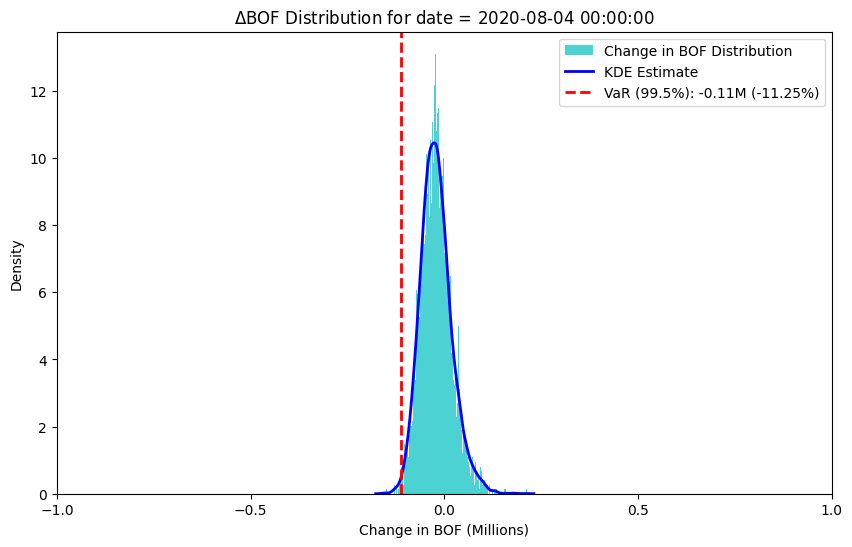

Processing Dates:  12%|█▏        | 150/1232 [18:16<2:17:58,  7.65s/dates]

scr = -112526.98669202809


Processing Dates:  12%|█▏        | 151/1232 [18:23<2:16:59,  7.60s/dates]

scr = -110713.29038363864


Processing Dates:  12%|█▏        | 152/1232 [18:31<2:15:53,  7.55s/dates]

scr = -109770.36006483075


Processing Dates:  12%|█▏        | 153/1232 [18:38<2:15:10,  7.52s/dates]

scr = -116173.94398495535


Processing Dates:  12%|█▎        | 154/1232 [18:46<2:15:18,  7.53s/dates]

scr = -114623.16581521177


Processing Dates:  13%|█▎        | 155/1232 [18:53<2:14:41,  7.50s/dates]

scr = -111148.03431973855


Processing Dates:  13%|█▎        | 156/1232 [19:01<2:14:28,  7.50s/dates]

scr = -111574.79227413726


Processing Dates:  13%|█▎        | 157/1232 [19:08<2:13:51,  7.47s/dates]

scr = -113423.07029700422


Processing Dates:  13%|█▎        | 158/1232 [19:16<2:14:01,  7.49s/dates]

scr = -109764.55067421225


Processing Dates:  13%|█▎        | 159/1232 [19:23<2:13:43,  7.48s/dates]

scr = -114119.06612886983


Processing Dates:  13%|█▎        | 160/1232 [19:30<2:13:24,  7.47s/dates]

scr = -111054.72684230247


Processing Dates:  13%|█▎        | 161/1232 [19:38<2:13:04,  7.46s/dates]

scr = -113088.22193000792


Processing Dates:  13%|█▎        | 162/1232 [19:45<2:13:23,  7.48s/dates]

scr = -113007.65289693557


Processing Dates:  13%|█▎        | 163/1232 [19:53<2:13:24,  7.49s/dates]

scr = -113954.91758964265


Processing Dates:  13%|█▎        | 164/1232 [20:00<2:13:19,  7.49s/dates]

scr = -110067.18850881848


Processing Dates:  13%|█▎        | 165/1232 [20:08<2:13:05,  7.48s/dates]

scr = -114361.26303915292


Processing Dates:  13%|█▎        | 166/1232 [20:15<2:12:49,  7.48s/dates]

scr = -113338.51387446819


Processing Dates:  14%|█▎        | 167/1232 [20:23<2:12:57,  7.49s/dates]

scr = -111413.88713856826


Processing Dates:  14%|█▎        | 168/1232 [20:30<2:12:34,  7.48s/dates]

scr = -111526.53358426502


Processing Dates:  14%|█▎        | 169/1232 [20:38<2:12:15,  7.47s/dates]

scr = -110873.5475100845


Processing Dates:  14%|█▍        | 170/1232 [20:45<2:12:01,  7.46s/dates]

scr = -113500.19490012577


Processing Dates:  14%|█▍        | 171/1232 [20:53<2:12:29,  7.49s/dates]

scr = -114071.26595456262


Processing Dates:  14%|█▍        | 172/1232 [21:00<2:12:11,  7.48s/dates]

scr = -110432.76223405563


Processing Dates:  14%|█▍        | 173/1232 [21:08<2:12:00,  7.48s/dates]

scr = -112029.60785851342


Processing Dates:  14%|█▍        | 174/1232 [21:15<2:12:08,  7.49s/dates]

scr = -107581.83967839647


Processing Dates:  14%|█▍        | 175/1232 [21:23<2:11:53,  7.49s/dates]

scr = -111886.19768635061


Processing Dates:  14%|█▍        | 176/1232 [21:30<2:12:03,  7.50s/dates]

scr = -110564.81209067207


Processing Dates:  14%|█▍        | 177/1232 [21:38<2:11:46,  7.49s/dates]

scr = -112755.10871820721


Processing Dates:  14%|█▍        | 178/1232 [21:45<2:11:45,  7.50s/dates]

scr = -112042.36333721702


Processing Dates:  15%|█▍        | 179/1232 [21:53<2:11:37,  7.50s/dates]

scr = -111505.85929971957


Processing Dates:  15%|█▍        | 180/1232 [22:00<2:11:48,  7.52s/dates]

scr = -112852.69129385547


Processing Dates:  15%|█▍        | 181/1232 [22:08<2:11:37,  7.51s/dates]

scr = -114569.4364898873


Processing Dates:  15%|█▍        | 182/1232 [22:15<2:11:24,  7.51s/dates]

scr = -112051.95580330433


Processing Dates:  15%|█▍        | 183/1232 [22:23<2:11:35,  7.53s/dates]

scr = -114600.40705397476


Processing Dates:  15%|█▍        | 184/1232 [22:30<2:11:53,  7.55s/dates]

scr = -110887.6890732875


Processing Dates:  15%|█▌        | 185/1232 [22:38<2:11:21,  7.53s/dates]

scr = -111012.06645286569


Processing Dates:  15%|█▌        | 186/1232 [22:45<2:11:08,  7.52s/dates]

scr = -111042.77063771652


Processing Dates:  15%|█▌        | 187/1232 [22:53<2:11:01,  7.52s/dates]

scr = -111685.50504791255


Processing Dates:  15%|█▌        | 188/1232 [23:00<2:10:48,  7.52s/dates]

scr = -112774.9907980211


Processing Dates:  15%|█▌        | 189/1232 [23:08<2:11:14,  7.55s/dates]

scr = -112534.74771658756


Processing Dates:  15%|█▌        | 190/1232 [23:16<2:11:12,  7.56s/dates]

scr = -112442.37255774363


Processing Dates:  16%|█▌        | 191/1232 [23:23<2:10:52,  7.54s/dates]

scr = -112888.0177671215


Processing Dates:  16%|█▌        | 192/1232 [23:31<2:10:44,  7.54s/dates]

scr = -111448.4474689428


Processing Dates:  16%|█▌        | 193/1232 [23:38<2:10:56,  7.56s/dates]

scr = -115177.63934720724


Processing Dates:  16%|█▌        | 194/1232 [23:46<2:10:53,  7.57s/dates]

scr = -111573.82825463709


Processing Dates:  16%|█▌        | 195/1232 [23:53<2:10:27,  7.55s/dates]

scr = -111427.01863722382


Processing Dates:  16%|█▌        | 196/1232 [24:01<2:10:12,  7.54s/dates]

scr = -112843.78253976001


Processing Dates:  16%|█▌        | 197/1232 [24:08<2:10:02,  7.54s/dates]

scr = -110098.82131700509


Processing Dates:  16%|█▌        | 198/1232 [24:16<2:10:54,  7.60s/dates]

scr = -114308.70099503927


Processing Dates:  16%|█▌        | 199/1232 [24:24<2:10:30,  7.58s/dates]

scr = -113781.32931088582


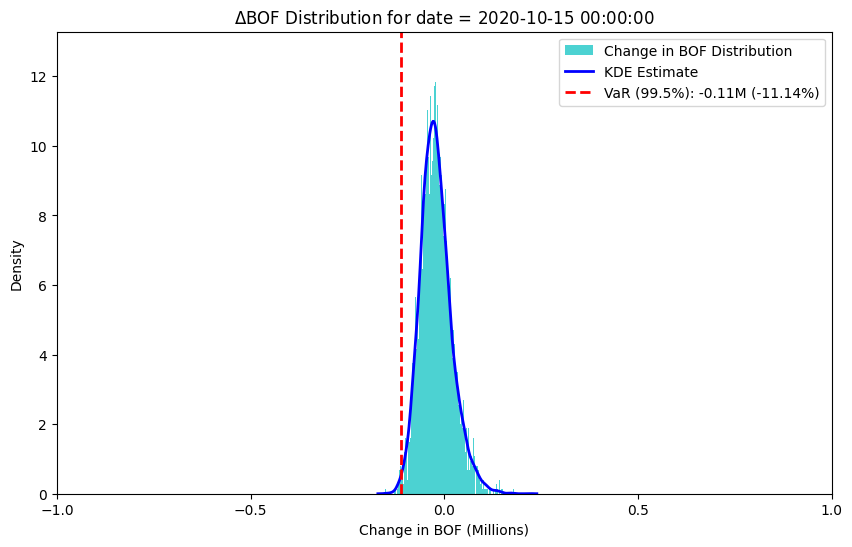

Processing Dates:  16%|█▌        | 200/1232 [24:32<2:13:36,  7.77s/dates]

scr = -111421.94625622885


Processing Dates:  16%|█▋        | 201/1232 [24:39<2:12:25,  7.71s/dates]

scr = -112480.90923116956


Processing Dates:  16%|█▋        | 202/1232 [24:47<2:11:55,  7.68s/dates]

scr = -110208.188376274


Processing Dates:  16%|█▋        | 203/1232 [24:55<2:11:04,  7.64s/dates]

scr = -109452.07020355493


Processing Dates:  17%|█▋        | 204/1232 [25:02<2:10:30,  7.62s/dates]

scr = -113042.4484089715


Processing Dates:  17%|█▋        | 205/1232 [25:10<2:10:35,  7.63s/dates]

scr = -110530.7401050868


Processing Dates:  17%|█▋        | 206/1232 [25:17<2:10:10,  7.61s/dates]

scr = -110613.00744961867


Processing Dates:  17%|█▋        | 207/1232 [25:25<2:09:51,  7.60s/dates]

scr = -109211.98209273467


Processing Dates:  17%|█▋        | 208/1232 [25:33<2:09:14,  7.57s/dates]

scr = -111969.37566166745


Processing Dates:  17%|█▋        | 209/1232 [25:40<2:09:19,  7.59s/dates]

scr = -111860.36883004603


Processing Dates:  17%|█▋        | 210/1232 [25:48<2:08:57,  7.57s/dates]

scr = -112747.2573754882


Processing Dates:  17%|█▋        | 211/1232 [25:55<2:08:34,  7.56s/dates]

scr = -112381.82680923468


Processing Dates:  17%|█▋        | 212/1232 [26:03<2:08:22,  7.55s/dates]

scr = -113621.24558579302


Processing Dates:  17%|█▋        | 213/1232 [26:10<2:08:27,  7.56s/dates]

scr = -111476.75413239065


Processing Dates:  17%|█▋        | 214/1232 [26:18<2:08:32,  7.58s/dates]

scr = -111994.06228112086


Processing Dates:  17%|█▋        | 215/1232 [26:25<2:08:14,  7.57s/dates]

scr = -114665.63227528984


Processing Dates:  18%|█▊        | 216/1232 [26:33<2:08:04,  7.56s/dates]

scr = -112823.54277565268


Processing Dates:  18%|█▊        | 217/1232 [26:41<2:07:44,  7.55s/dates]

scr = -110662.75505489623


Processing Dates:  18%|█▊        | 218/1232 [26:48<2:08:11,  7.59s/dates]

scr = -111871.73042324062


Processing Dates:  18%|█▊        | 219/1232 [26:56<2:08:03,  7.59s/dates]

scr = -112670.33328861237


Processing Dates:  18%|█▊        | 220/1232 [27:03<2:07:40,  7.57s/dates]

scr = -110702.381176409


Processing Dates:  18%|█▊        | 221/1232 [27:11<2:07:36,  7.57s/dates]

scr = -110081.26073667798


Processing Dates:  18%|█▊        | 222/1232 [27:19<2:07:49,  7.59s/dates]

scr = -112464.07507453376


Processing Dates:  18%|█▊        | 223/1232 [27:26<2:07:37,  7.59s/dates]

scr = -112354.34229826779


Processing Dates:  18%|█▊        | 224/1232 [27:34<2:07:15,  7.58s/dates]

scr = -111060.1313191741


Processing Dates:  18%|█▊        | 225/1232 [27:41<2:07:02,  7.57s/dates]

scr = -110158.6547773552


Processing Dates:  18%|█▊        | 226/1232 [27:49<2:07:40,  7.61s/dates]

scr = -112031.32510256088


Processing Dates:  18%|█▊        | 227/1232 [27:57<2:07:11,  7.59s/dates]

scr = -110238.60988242009


Processing Dates:  19%|█▊        | 228/1232 [28:04<2:06:46,  7.58s/dates]

scr = -113950.15168975014


Processing Dates:  19%|█▊        | 229/1232 [28:12<2:06:43,  7.58s/dates]

scr = -111662.69202386578


Processing Dates:  19%|█▊        | 230/1232 [28:19<2:06:44,  7.59s/dates]

scr = -112109.90686941697


Processing Dates:  19%|█▉        | 231/1232 [28:27<2:07:02,  7.61s/dates]

scr = -111299.3370638712


Processing Dates:  19%|█▉        | 232/1232 [28:34<2:06:22,  7.58s/dates]

scr = -111706.51687317714


Processing Dates:  19%|█▉        | 233/1232 [28:42<2:06:22,  7.59s/dates]

scr = -111420.98033335542


Processing Dates:  19%|█▉        | 234/1232 [28:50<2:07:03,  7.64s/dates]

scr = -109249.50707511639


Processing Dates:  19%|█▉        | 235/1232 [28:58<2:07:17,  7.66s/dates]

scr = -111409.61503767276


Processing Dates:  19%|█▉        | 236/1232 [29:05<2:07:02,  7.65s/dates]

scr = -113146.81999212547


Processing Dates:  19%|█▉        | 237/1232 [29:13<2:06:33,  7.63s/dates]

scr = -111050.01653222223


Processing Dates:  19%|█▉        | 238/1232 [29:20<2:06:24,  7.63s/dates]

scr = -115051.91604831147


Processing Dates:  19%|█▉        | 239/1232 [29:28<2:06:29,  7.64s/dates]

scr = -113939.34287990304


Processing Dates:  19%|█▉        | 240/1232 [29:36<2:06:10,  7.63s/dates]

scr = -112159.63274649483


Processing Dates:  20%|█▉        | 241/1232 [29:43<2:05:36,  7.60s/dates]

scr = -109223.8619750159


Processing Dates:  20%|█▉        | 242/1232 [29:51<2:05:30,  7.61s/dates]

scr = -111128.24252376283


Processing Dates:  20%|█▉        | 243/1232 [29:58<2:05:37,  7.62s/dates]

scr = -114294.04766774316


Processing Dates:  20%|█▉        | 244/1232 [30:06<2:05:25,  7.62s/dates]

scr = -112388.30445776804


Processing Dates:  20%|█▉        | 245/1232 [30:14<2:05:20,  7.62s/dates]

scr = -111692.62223653519


Processing Dates:  20%|█▉        | 246/1232 [30:21<2:05:04,  7.61s/dates]

scr = -111516.28082587916


Processing Dates:  20%|██        | 247/1232 [30:29<2:05:16,  7.63s/dates]

scr = -113588.05415597373


Processing Dates:  20%|██        | 248/1232 [30:37<2:05:00,  7.62s/dates]

scr = -109881.01554160797


Processing Dates:  20%|██        | 249/1232 [30:44<2:04:53,  7.62s/dates]

scr = -112785.57389348988


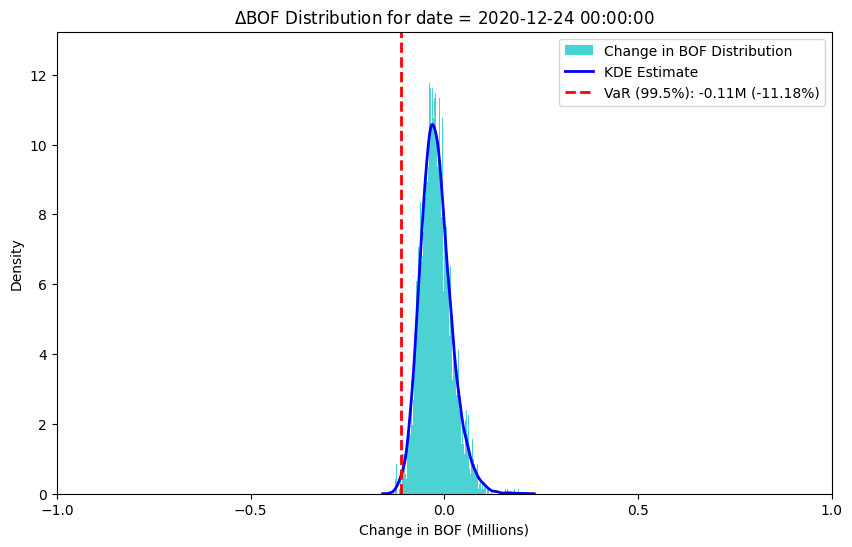

Processing Dates:  20%|██        | 250/1232 [30:53<2:08:18,  7.84s/dates]

scr = -111847.52535081854


Processing Dates:  20%|██        | 251/1232 [31:00<2:07:22,  7.79s/dates]

scr = -113352.24330139431


Processing Dates:  20%|██        | 252/1232 [31:08<2:06:43,  7.76s/dates]

scr = -112904.78991174692


Processing Dates:  21%|██        | 253/1232 [31:16<2:06:07,  7.73s/dates]

scr = -109830.67581431787


Processing Dates:  21%|██        | 254/1232 [31:23<2:05:39,  7.71s/dates]

scr = -112035.97344137743


Processing Dates:  21%|██        | 255/1232 [31:31<2:05:56,  7.73s/dates]

scr = -114041.87630104875


Processing Dates:  21%|██        | 256/1232 [31:39<2:05:23,  7.71s/dates]

scr = -112829.09293836865


Processing Dates:  21%|██        | 257/1232 [31:46<2:05:12,  7.70s/dates]

scr = -112157.7352789933


Processing Dates:  21%|██        | 258/1232 [31:54<2:04:54,  7.69s/dates]

scr = -113376.2474131256


Processing Dates:  21%|██        | 259/1232 [32:02<2:05:04,  7.71s/dates]

scr = -113213.57968132285


Processing Dates:  21%|██        | 260/1232 [32:09<2:04:31,  7.69s/dates]

scr = -112717.58501312516


Processing Dates:  21%|██        | 261/1232 [32:17<2:04:10,  7.67s/dates]

scr = -111221.79296997067


Processing Dates:  21%|██▏       | 262/1232 [32:25<2:04:17,  7.69s/dates]

scr = -111501.50608808517


Processing Dates:  21%|██▏       | 263/1232 [32:32<2:04:15,  7.69s/dates]

scr = -113875.85882275456


Processing Dates:  21%|██▏       | 264/1232 [32:40<2:04:07,  7.69s/dates]

scr = -111630.8409068898


Processing Dates:  22%|██▏       | 265/1232 [32:48<2:03:48,  7.68s/dates]

scr = -109923.8683229773


Processing Dates:  22%|██▏       | 266/1232 [32:55<2:03:19,  7.66s/dates]

scr = -112139.83679262156


Processing Dates:  22%|██▏       | 267/1232 [33:03<2:03:25,  7.67s/dates]

scr = -112044.03235832482


Processing Dates:  22%|██▏       | 268/1232 [33:11<2:03:56,  7.71s/dates]

scr = -110407.0078682737


Processing Dates:  22%|██▏       | 269/1232 [33:19<2:03:56,  7.72s/dates]

scr = -111342.49878273004


Processing Dates:  22%|██▏       | 270/1232 [33:26<2:03:30,  7.70s/dates]

scr = -113928.08625463484


Processing Dates:  22%|██▏       | 271/1232 [33:34<2:03:20,  7.70s/dates]

scr = -111369.67260028022


Processing Dates:  22%|██▏       | 272/1232 [33:42<2:04:03,  7.75s/dates]

scr = -114005.56917915615


Processing Dates:  22%|██▏       | 273/1232 [33:50<2:03:40,  7.74s/dates]

scr = -111550.45009614671


Processing Dates:  22%|██▏       | 274/1232 [33:57<2:03:25,  7.73s/dates]

scr = -113098.84613006322


Processing Dates:  22%|██▏       | 275/1232 [34:05<2:03:19,  7.73s/dates]

scr = -110895.38795213144


Processing Dates:  22%|██▏       | 276/1232 [34:13<2:02:55,  7.71s/dates]

scr = -111585.07426368719


Processing Dates:  22%|██▏       | 277/1232 [34:20<2:02:26,  7.69s/dates]

scr = -112010.98280404224


Processing Dates:  23%|██▎       | 278/1232 [34:28<2:02:23,  7.70s/dates]

scr = -110464.32023674004


Processing Dates:  23%|██▎       | 279/1232 [34:36<2:02:37,  7.72s/dates]

scr = -112531.5424924822


Processing Dates:  23%|██▎       | 280/1232 [34:43<2:02:02,  7.69s/dates]

scr = -108100.69651492256


Processing Dates:  23%|██▎       | 281/1232 [34:51<2:01:59,  7.70s/dates]

scr = -112597.60602000366


Processing Dates:  23%|██▎       | 282/1232 [34:59<2:01:59,  7.70s/dates]

scr = -112288.79608929504


Processing Dates:  23%|██▎       | 283/1232 [35:07<2:02:30,  7.75s/dates]

scr = -110352.00356692722


Processing Dates:  23%|██▎       | 284/1232 [35:15<2:02:31,  7.75s/dates]

scr = -109161.74552263803


Processing Dates:  23%|██▎       | 285/1232 [35:22<2:02:10,  7.74s/dates]

scr = -112900.47311073028


Processing Dates:  23%|██▎       | 286/1232 [35:30<2:01:43,  7.72s/dates]

scr = -113949.33237347999


Processing Dates:  23%|██▎       | 287/1232 [35:38<2:02:10,  7.76s/dates]

scr = -114180.44062020989


Processing Dates:  23%|██▎       | 288/1232 [35:45<2:01:34,  7.73s/dates]

scr = -114720.74680886946


Processing Dates:  23%|██▎       | 289/1232 [35:53<2:01:35,  7.74s/dates]

scr = -112180.89554598124


Processing Dates:  24%|██▎       | 290/1232 [36:01<2:01:35,  7.74s/dates]

scr = -112664.14950189862


Processing Dates:  24%|██▎       | 291/1232 [36:09<2:01:43,  7.76s/dates]

scr = -112875.76683099208


Processing Dates:  24%|██▎       | 292/1232 [36:17<2:01:53,  7.78s/dates]

scr = -110129.60356656478


Processing Dates:  24%|██▍       | 293/1232 [36:24<2:01:34,  7.77s/dates]

scr = -109498.40793912338


Processing Dates:  24%|██▍       | 294/1232 [36:32<2:01:22,  7.76s/dates]

scr = -111628.71613113125


Processing Dates:  24%|██▍       | 295/1232 [36:40<2:01:19,  7.77s/dates]

scr = -110798.73541365207


Processing Dates:  24%|██▍       | 296/1232 [36:48<2:01:22,  7.78s/dates]

scr = -114273.35415340425


Processing Dates:  24%|██▍       | 297/1232 [36:55<2:00:49,  7.75s/dates]

scr = -111699.51055834096


Processing Dates:  24%|██▍       | 298/1232 [37:03<2:00:38,  7.75s/dates]

scr = -114711.85843765797


Processing Dates:  24%|██▍       | 299/1232 [37:11<2:01:02,  7.78s/dates]

scr = -109475.29135608673


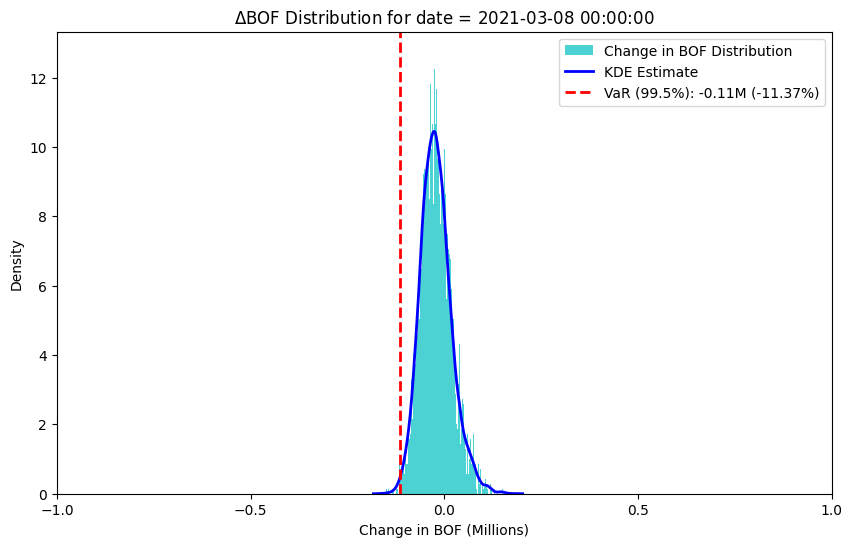

Processing Dates:  24%|██▍       | 300/1232 [37:19<2:03:29,  7.95s/dates]

scr = -113749.66844245647


Processing Dates:  24%|██▍       | 301/1232 [37:27<2:02:50,  7.92s/dates]

scr = -113440.84582327984


Processing Dates:  25%|██▍       | 302/1232 [37:35<2:01:53,  7.86s/dates]

scr = -114977.10325662342


Processing Dates:  25%|██▍       | 303/1232 [37:43<2:01:07,  7.82s/dates]

scr = -110631.81339578082


Processing Dates:  25%|██▍       | 304/1232 [37:50<2:00:41,  7.80s/dates]

scr = -111886.9464772333


Processing Dates:  25%|██▍       | 305/1232 [37:58<2:00:39,  7.81s/dates]

scr = -115902.83125199184


Processing Dates:  25%|██▍       | 306/1232 [38:06<2:00:35,  7.81s/dates]

scr = -112236.07002533502


Processing Dates:  25%|██▍       | 307/1232 [38:14<2:00:12,  7.80s/dates]

scr = -111856.30630780621


Processing Dates:  25%|██▌       | 308/1232 [38:22<1:59:58,  7.79s/dates]

scr = -114312.06956579482


Processing Dates:  25%|██▌       | 309/1232 [38:29<2:00:18,  7.82s/dates]

scr = -110912.1248674692


Processing Dates:  25%|██▌       | 310/1232 [38:37<1:59:44,  7.79s/dates]

scr = -108394.97729264662


Processing Dates:  25%|██▌       | 311/1232 [38:45<1:59:22,  7.78s/dates]

scr = -106204.84074744085


Processing Dates:  25%|██▌       | 312/1232 [38:53<1:59:06,  7.77s/dates]

scr = -105778.44520352769


Processing Dates:  25%|██▌       | 313/1232 [39:00<1:58:49,  7.76s/dates]

scr = -107967.84819571089


Processing Dates:  25%|██▌       | 314/1232 [39:08<1:59:18,  7.80s/dates]

scr = -104586.40353500644


Processing Dates:  26%|██▌       | 315/1232 [39:16<1:59:08,  7.80s/dates]

scr = -107279.40906312395


Processing Dates:  26%|██▌       | 316/1232 [39:24<1:59:13,  7.81s/dates]

scr = -110387.80427216119


Processing Dates:  26%|██▌       | 317/1232 [39:32<1:59:05,  7.81s/dates]

scr = -112218.93395546511


Processing Dates:  26%|██▌       | 318/1232 [39:40<1:59:25,  7.84s/dates]

scr = -109033.07735578802


Processing Dates:  26%|██▌       | 319/1232 [39:47<1:58:58,  7.82s/dates]

scr = -110208.05861371446


Processing Dates:  26%|██▌       | 320/1232 [39:55<1:59:04,  7.83s/dates]

scr = -110533.93385671884


Processing Dates:  26%|██▌       | 321/1232 [40:03<1:58:47,  7.82s/dates]

scr = -111323.17717282164


Processing Dates:  26%|██▌       | 322/1232 [40:11<1:58:43,  7.83s/dates]

scr = -110678.8118210738


Processing Dates:  26%|██▌       | 323/1232 [40:19<1:58:30,  7.82s/dates]

scr = -113630.15643944596


Processing Dates:  26%|██▋       | 324/1232 [40:27<1:58:45,  7.85s/dates]

scr = -115352.94420781822


Processing Dates:  26%|██▋       | 325/1232 [40:34<1:58:40,  7.85s/dates]

scr = -113920.26613928922


Processing Dates:  26%|██▋       | 326/1232 [40:42<1:58:12,  7.83s/dates]

scr = -115053.26151769623


Processing Dates:  27%|██▋       | 327/1232 [40:50<1:57:54,  7.82s/dates]

scr = -112830.74807088307


Processing Dates:  27%|██▋       | 328/1232 [40:58<1:58:11,  7.84s/dates]

scr = -114727.27999385013


Processing Dates:  27%|██▋       | 329/1232 [41:06<1:58:02,  7.84s/dates]

scr = -111552.03831036433


Processing Dates:  27%|██▋       | 330/1232 [41:14<1:57:57,  7.85s/dates]

scr = -113939.82888144346


Processing Dates:  27%|██▋       | 331/1232 [41:21<1:57:39,  7.84s/dates]

scr = -112359.92589644836


Processing Dates:  27%|██▋       | 332/1232 [41:29<1:57:07,  7.81s/dates]

scr = -112846.65368868964


Processing Dates:  27%|██▋       | 333/1232 [41:37<1:57:39,  7.85s/dates]

scr = -115494.39881502413


Processing Dates:  27%|██▋       | 334/1232 [41:45<1:57:16,  7.84s/dates]

scr = -111919.0275104877


Processing Dates:  27%|██▋       | 335/1232 [41:53<1:57:08,  7.84s/dates]

scr = -114150.94670407704


Processing Dates:  27%|██▋       | 336/1232 [42:01<1:57:02,  7.84s/dates]

scr = -112344.19212011334


Processing Dates:  27%|██▋       | 337/1232 [42:08<1:57:04,  7.85s/dates]

scr = -112633.52287174769


Processing Dates:  27%|██▋       | 338/1232 [42:16<1:57:17,  7.87s/dates]

scr = -115868.56438584189


Processing Dates:  28%|██▊       | 339/1232 [42:24<1:57:18,  7.88s/dates]

scr = -113597.17037569046


Processing Dates:  28%|██▊       | 340/1232 [42:32<1:56:55,  7.87s/dates]

scr = -112620.43636461528


Processing Dates:  28%|██▊       | 341/1232 [42:40<1:56:50,  7.87s/dates]

scr = -114590.85308085839


Processing Dates:  28%|██▊       | 342/1232 [42:48<1:56:44,  7.87s/dates]

scr = -114034.91691333488


Processing Dates:  28%|██▊       | 343/1232 [42:56<1:56:57,  7.89s/dates]

scr = -112123.22801519664


Processing Dates:  28%|██▊       | 344/1232 [43:04<1:56:29,  7.87s/dates]

scr = -112532.06613578254


Processing Dates:  28%|██▊       | 345/1232 [43:11<1:56:13,  7.86s/dates]

scr = -110118.85541650227


Processing Dates:  28%|██▊       | 346/1232 [43:19<1:55:59,  7.86s/dates]

scr = -111989.63989924842


Processing Dates:  28%|██▊       | 347/1232 [43:27<1:56:26,  7.89s/dates]

scr = -111653.63260571344


Processing Dates:  28%|██▊       | 348/1232 [43:35<1:56:06,  7.88s/dates]

scr = -110991.87389601837


Processing Dates:  28%|██▊       | 349/1232 [43:43<1:55:39,  7.86s/dates]

scr = -109748.25264597486


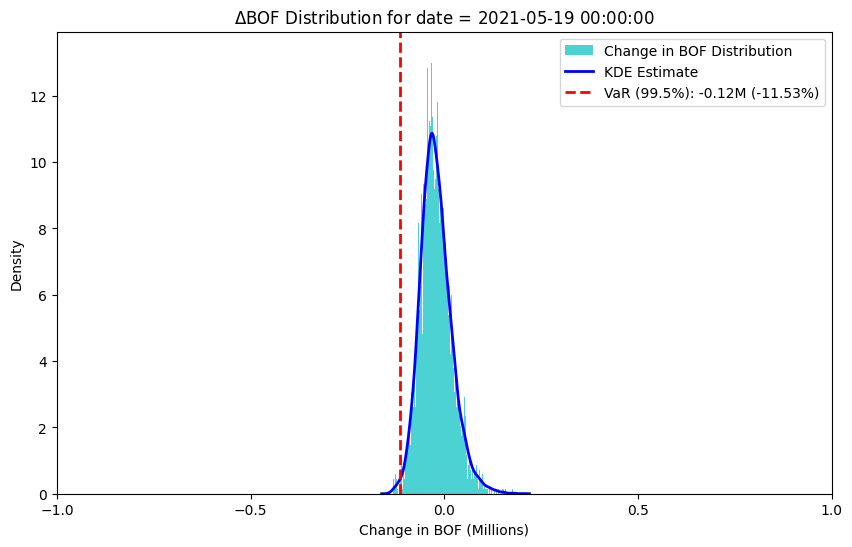

Processing Dates:  28%|██▊       | 350/1232 [43:51<1:58:01,  8.03s/dates]

scr = -115338.54588590066


Processing Dates:  28%|██▊       | 351/1232 [43:59<1:57:30,  8.00s/dates]

scr = -114102.47062889909


Processing Dates:  29%|██▊       | 352/1232 [44:07<1:56:48,  7.96s/dates]

scr = -109199.93572214388


Processing Dates:  29%|██▊       | 353/1232 [44:15<1:56:09,  7.93s/dates]

scr = -115048.93299468176


Processing Dates:  29%|██▊       | 354/1232 [44:23<1:55:41,  7.91s/dates]

scr = -112554.79178680695


Processing Dates:  29%|██▉       | 355/1232 [44:31<1:55:32,  7.90s/dates]

scr = -112733.96561360758


Processing Dates:  29%|██▉       | 356/1232 [44:39<1:55:31,  7.91s/dates]

scr = -108775.28166217527


Processing Dates:  29%|██▉       | 357/1232 [44:47<1:55:04,  7.89s/dates]

scr = -110593.57282548907


Processing Dates:  29%|██▉       | 358/1232 [44:54<1:54:51,  7.89s/dates]

scr = -113387.41404163085


Processing Dates:  29%|██▉       | 359/1232 [45:02<1:54:37,  7.88s/dates]

scr = -111786.63329358236


Processing Dates:  29%|██▉       | 360/1232 [45:10<1:54:59,  7.91s/dates]

scr = -111875.54751189907


Processing Dates:  29%|██▉       | 361/1232 [45:18<1:54:37,  7.90s/dates]

scr = -113059.69340804784


Processing Dates:  29%|██▉       | 362/1232 [45:26<1:54:01,  7.86s/dates]

scr = -110624.18575636444


Processing Dates:  29%|██▉       | 363/1232 [45:34<1:53:56,  7.87s/dates]

scr = -112569.93243344709


Processing Dates:  30%|██▉       | 364/1232 [45:42<1:53:52,  7.87s/dates]

scr = -110532.50849579135


Processing Dates:  30%|██▉       | 365/1232 [45:50<1:53:36,  7.86s/dates]

scr = -109880.9569415856


Processing Dates:  30%|██▉       | 366/1232 [45:57<1:53:47,  7.88s/dates]

scr = -108435.21189305438


Processing Dates:  30%|██▉       | 367/1232 [46:05<1:53:28,  7.87s/dates]

scr = -109219.99270273476


Processing Dates:  30%|██▉       | 368/1232 [46:13<1:53:25,  7.88s/dates]

scr = -110634.6533093971


Processing Dates:  30%|██▉       | 369/1232 [46:21<1:53:43,  7.91s/dates]

scr = -111561.7385502515


Processing Dates:  30%|███       | 370/1232 [46:29<1:53:40,  7.91s/dates]

scr = -109353.31070816306


Processing Dates:  30%|███       | 371/1232 [46:37<1:53:22,  7.90s/dates]

scr = -113515.70250246314


Processing Dates:  30%|███       | 372/1232 [46:45<1:53:16,  7.90s/dates]

scr = -113392.43060276851


Processing Dates:  30%|███       | 373/1232 [46:53<1:52:57,  7.89s/dates]

scr = -112326.79676549908


Processing Dates:  30%|███       | 374/1232 [47:01<1:52:53,  7.89s/dates]

scr = -111105.66337155487


Processing Dates:  30%|███       | 375/1232 [47:09<1:53:23,  7.94s/dates]

scr = -114820.64433724001


Processing Dates:  31%|███       | 376/1232 [47:17<1:52:59,  7.92s/dates]

scr = -112533.313735079


Processing Dates:  31%|███       | 377/1232 [47:24<1:52:39,  7.91s/dates]

scr = -112767.37236143394


Processing Dates:  31%|███       | 378/1232 [47:32<1:52:15,  7.89s/dates]

scr = -113259.0829488264


Processing Dates:  31%|███       | 379/1232 [47:40<1:52:57,  7.95s/dates]

scr = -113053.3806288093


Processing Dates:  31%|███       | 380/1232 [47:48<1:52:33,  7.93s/dates]

scr = -111598.00144352221


Processing Dates:  31%|███       | 381/1232 [47:56<1:52:12,  7.91s/dates]

scr = -112246.11944748748


Processing Dates:  31%|███       | 382/1232 [48:04<1:51:59,  7.91s/dates]

scr = -114907.86880044657


Processing Dates:  31%|███       | 383/1232 [48:12<1:51:49,  7.90s/dates]

scr = -116185.5364451518


Processing Dates:  31%|███       | 384/1232 [48:20<1:51:37,  7.90s/dates]

scr = -115754.45753660743


Processing Dates:  31%|███▏      | 385/1232 [48:28<1:52:05,  7.94s/dates]

scr = -112938.0241882514


Processing Dates:  31%|███▏      | 386/1232 [48:36<1:51:53,  7.94s/dates]

scr = -112097.84524314053


Processing Dates:  31%|███▏      | 387/1232 [48:44<1:51:30,  7.92s/dates]

scr = -112617.61189481737


Processing Dates:  31%|███▏      | 388/1232 [48:52<1:51:28,  7.92s/dates]

scr = -113492.06162885662


Processing Dates:  32%|███▏      | 389/1232 [49:00<1:51:50,  7.96s/dates]

scr = -112316.62358209891


Processing Dates:  32%|███▏      | 390/1232 [49:08<1:51:41,  7.96s/dates]

scr = -112126.45131869458


Processing Dates:  32%|███▏      | 391/1232 [49:16<1:51:41,  7.97s/dates]

scr = -111337.02864349641


Processing Dates:  32%|███▏      | 392/1232 [49:24<1:51:31,  7.97s/dates]

scr = -112811.5730499567


Processing Dates:  32%|███▏      | 393/1232 [49:32<1:51:29,  7.97s/dates]

scr = -109594.46339826315


Processing Dates:  32%|███▏      | 394/1232 [49:40<1:51:35,  7.99s/dates]

scr = -113187.14040263047


Processing Dates:  32%|███▏      | 395/1232 [49:48<1:51:22,  7.98s/dates]

scr = -110164.1298542023


Processing Dates:  32%|███▏      | 396/1232 [49:56<1:51:29,  8.00s/dates]

scr = -111886.88457742136


Processing Dates:  32%|███▏      | 397/1232 [50:03<1:50:55,  7.97s/dates]

scr = -109183.60477812364


Processing Dates:  32%|███▏      | 398/1232 [50:12<1:51:16,  8.00s/dates]

scr = -110447.00668017795


Processing Dates:  32%|███▏      | 399/1232 [50:20<1:50:55,  7.99s/dates]

scr = -110991.79436427251


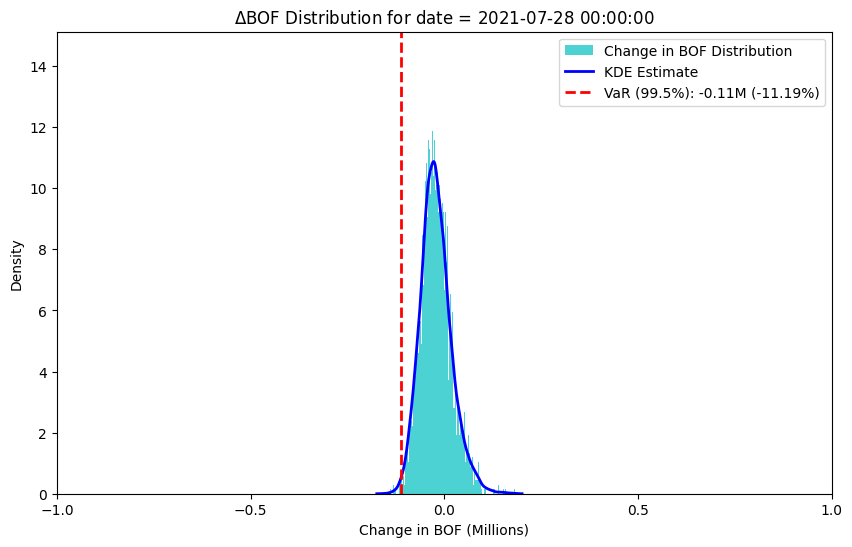

Processing Dates:  32%|███▏      | 400/1232 [50:28<1:53:01,  8.15s/dates]

scr = -111873.84730278018


Processing Dates:  33%|███▎      | 401/1232 [50:36<1:52:38,  8.13s/dates]

scr = -111700.14053896756


Processing Dates:  33%|███▎      | 402/1232 [50:44<1:51:38,  8.07s/dates]

scr = -114102.76721246712


Processing Dates:  33%|███▎      | 403/1232 [50:52<1:51:06,  8.04s/dates]

scr = -111739.46441606787


Processing Dates:  33%|███▎      | 404/1232 [51:00<1:50:37,  8.02s/dates]

scr = -116394.75073377612


Processing Dates:  33%|███▎      | 405/1232 [51:08<1:50:15,  8.00s/dates]

scr = -110468.02686387196


Processing Dates:  33%|███▎      | 406/1232 [51:16<1:50:05,  8.00s/dates]

scr = -111999.08902211601


Processing Dates:  33%|███▎      | 407/1232 [51:24<1:50:09,  8.01s/dates]

scr = -111359.16019725522


Processing Dates:  33%|███▎      | 408/1232 [51:32<1:49:53,  8.00s/dates]

scr = -111234.1771990858


Processing Dates:  33%|███▎      | 409/1232 [51:40<1:49:40,  8.00s/dates]

scr = -114362.05160549989


Processing Dates:  33%|███▎      | 410/1232 [51:48<1:49:26,  7.99s/dates]

scr = -111800.61468338832


Processing Dates:  33%|███▎      | 411/1232 [51:56<1:49:37,  8.01s/dates]

scr = -112293.98353455406


Processing Dates:  33%|███▎      | 412/1232 [52:04<1:49:38,  8.02s/dates]

scr = -113929.0171761758


Processing Dates:  34%|███▎      | 413/1232 [52:12<1:49:49,  8.05s/dates]

scr = -111051.40752544666


Processing Dates:  34%|███▎      | 414/1232 [52:20<1:49:40,  8.04s/dates]

scr = -112668.48929360523


Processing Dates:  34%|███▎      | 415/1232 [52:28<1:49:44,  8.06s/dates]

scr = -112623.73874801361


Processing Dates:  34%|███▍      | 416/1232 [52:36<1:50:03,  8.09s/dates]

scr = -113678.06828442156


Processing Dates:  34%|███▍      | 417/1232 [52:44<1:49:35,  8.07s/dates]

scr = -110684.17779547561


Processing Dates:  34%|███▍      | 418/1232 [52:52<1:48:59,  8.03s/dates]

scr = -113887.41891845428


Processing Dates:  34%|███▍      | 419/1232 [53:00<1:48:45,  8.03s/dates]

scr = -112094.04251289918


Processing Dates:  34%|███▍      | 420/1232 [53:08<1:48:49,  8.04s/dates]

scr = -110492.01407201217


Processing Dates:  34%|███▍      | 421/1232 [53:16<1:48:37,  8.04s/dates]

scr = -111825.74921628406


Processing Dates:  34%|███▍      | 422/1232 [53:25<1:48:22,  8.03s/dates]

scr = -112722.36061189928


Processing Dates:  34%|███▍      | 423/1232 [53:33<1:48:22,  8.04s/dates]

scr = -111188.39214953287


Processing Dates:  34%|███▍      | 424/1232 [53:41<1:48:10,  8.03s/dates]

scr = -111246.49770908903


Processing Dates:  34%|███▍      | 425/1232 [53:49<1:48:20,  8.06s/dates]

scr = -113762.49166349403


Processing Dates:  35%|███▍      | 426/1232 [53:57<1:48:00,  8.04s/dates]

scr = -107874.68536531174


Processing Dates:  35%|███▍      | 427/1232 [54:05<1:47:33,  8.02s/dates]

scr = -114714.7439408847


Processing Dates:  35%|███▍      | 428/1232 [54:13<1:47:27,  8.02s/dates]

scr = -113871.96743522362


Processing Dates:  35%|███▍      | 429/1232 [54:21<1:47:36,  8.04s/dates]

scr = -110752.5092890331


Processing Dates:  35%|███▍      | 430/1232 [54:29<1:47:29,  8.04s/dates]

scr = -113567.68421023228


Processing Dates:  35%|███▍      | 431/1232 [54:37<1:47:16,  8.04s/dates]

scr = -110676.10226104187


Processing Dates:  35%|███▌      | 432/1232 [54:45<1:47:21,  8.05s/dates]

scr = -112630.11321763447


Processing Dates:  35%|███▌      | 433/1232 [54:53<1:47:07,  8.04s/dates]

scr = -113748.3843703351


Processing Dates:  35%|███▌      | 434/1232 [55:01<1:47:18,  8.07s/dates]

scr = -111207.67906694405


Processing Dates:  35%|███▌      | 435/1232 [55:09<1:47:04,  8.06s/dates]

scr = -115167.6298482595


Processing Dates:  35%|███▌      | 436/1232 [55:17<1:46:58,  8.06s/dates]

scr = -112923.42109847197


Processing Dates:  35%|███▌      | 437/1232 [55:25<1:46:50,  8.06s/dates]

scr = -111934.72121117172


Processing Dates:  36%|███▌      | 438/1232 [55:33<1:46:56,  8.08s/dates]

scr = -110805.16615604128


Processing Dates:  36%|███▌      | 439/1232 [55:41<1:46:35,  8.06s/dates]

scr = -111995.98179407125


Processing Dates:  36%|███▌      | 440/1232 [55:49<1:46:21,  8.06s/dates]

scr = -112913.78723324912


Processing Dates:  36%|███▌      | 441/1232 [55:57<1:46:03,  8.04s/dates]

scr = -109760.46645258492


Processing Dates:  36%|███▌      | 442/1232 [56:05<1:45:47,  8.04s/dates]

scr = -112328.92845506943


Processing Dates:  36%|███▌      | 443/1232 [56:14<1:46:10,  8.07s/dates]

scr = -109722.97302991594


Processing Dates:  36%|███▌      | 444/1232 [56:22<1:45:51,  8.06s/dates]

scr = -111381.04394817897


Processing Dates:  36%|███▌      | 445/1232 [56:30<1:45:38,  8.05s/dates]

scr = -112331.3699164636


Processing Dates:  36%|███▌      | 446/1232 [56:38<1:45:40,  8.07s/dates]

scr = -114125.20259317405


Processing Dates:  36%|███▋      | 447/1232 [56:46<1:45:44,  8.08s/dates]

scr = -115294.22779001787


Processing Dates:  36%|███▋      | 448/1232 [56:54<1:45:30,  8.07s/dates]

scr = -111436.29996542253


Processing Dates:  36%|███▋      | 449/1232 [57:02<1:45:22,  8.07s/dates]

scr = -112603.39738501146


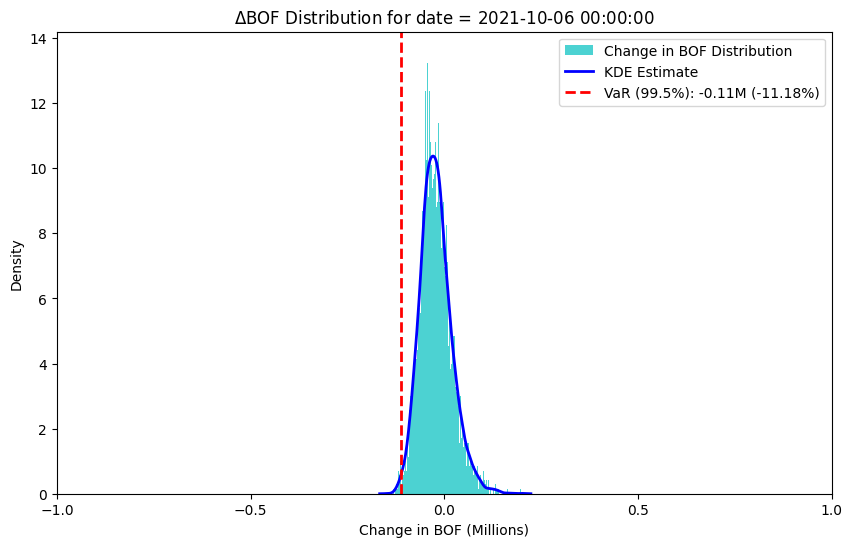

Processing Dates:  37%|███▋      | 450/1232 [57:11<1:47:32,  8.25s/dates]

scr = -111773.60008935646


Processing Dates:  37%|███▋      | 451/1232 [57:19<1:47:01,  8.22s/dates]

scr = -109770.1867417689


Processing Dates:  37%|███▋      | 452/1232 [57:27<1:46:07,  8.16s/dates]

scr = -113152.09148255485


Processing Dates:  37%|███▋      | 453/1232 [57:35<1:45:26,  8.12s/dates]

scr = -111876.7780972317


Processing Dates:  37%|███▋      | 454/1232 [57:43<1:45:06,  8.11s/dates]

scr = -113298.62288830348


Processing Dates:  37%|███▋      | 455/1232 [57:51<1:44:40,  8.08s/dates]

scr = -114320.43086019784


Processing Dates:  37%|███▋      | 456/1232 [57:59<1:44:38,  8.09s/dates]

scr = -112620.47995203562


Processing Dates:  37%|███▋      | 457/1232 [58:07<1:44:10,  8.07s/dates]

scr = -112026.72454020628


Processing Dates:  37%|███▋      | 458/1232 [58:15<1:44:09,  8.07s/dates]

scr = -113845.93105307448


Processing Dates:  37%|███▋      | 459/1232 [58:23<1:44:09,  8.08s/dates]

scr = -112958.26182682857


Processing Dates:  37%|███▋      | 460/1232 [58:31<1:44:05,  8.09s/dates]

scr = -115169.33797070097


Processing Dates:  37%|███▋      | 461/1232 [58:39<1:43:46,  8.08s/dates]

scr = -113076.07217119224


Processing Dates:  38%|███▊      | 462/1232 [58:48<1:43:38,  8.08s/dates]

scr = -112315.90620803557


Processing Dates:  38%|███▊      | 463/1232 [58:56<1:43:45,  8.10s/dates]

scr = -109596.9062655421


Processing Dates:  38%|███▊      | 464/1232 [59:04<1:43:35,  8.09s/dates]

scr = -112887.50743490209


Processing Dates:  38%|███▊      | 465/1232 [59:12<1:44:01,  8.14s/dates]

scr = -112181.60119359425


Processing Dates:  38%|███▊      | 466/1232 [59:20<1:43:31,  8.11s/dates]

scr = -112385.65522329058


Processing Dates:  38%|███▊      | 467/1232 [59:28<1:43:19,  8.10s/dates]

scr = -108084.22387983314


Processing Dates:  38%|███▊      | 468/1232 [59:36<1:43:01,  8.09s/dates]

scr = -113476.50864800041


Processing Dates:  38%|███▊      | 469/1232 [59:44<1:42:57,  8.10s/dates]

scr = -115366.95292263845


Processing Dates:  38%|███▊      | 470/1232 [59:52<1:42:59,  8.11s/dates]

scr = -110578.0747394071


Processing Dates:  38%|███▊      | 471/1232 [1:00:01<1:42:54,  8.11s/dates]

scr = -112683.5979769271


Processing Dates:  38%|███▊      | 472/1232 [1:00:09<1:42:50,  8.12s/dates]

scr = -113624.05021718702


Processing Dates:  38%|███▊      | 473/1232 [1:00:17<1:42:38,  8.11s/dates]

scr = -115806.60281104493


Processing Dates:  38%|███▊      | 474/1232 [1:00:25<1:42:47,  8.14s/dates]

scr = -112533.21925947184


Processing Dates:  39%|███▊      | 475/1232 [1:00:33<1:42:28,  8.12s/dates]

scr = -110029.11186641964


Processing Dates:  39%|███▊      | 476/1232 [1:00:41<1:42:18,  8.12s/dates]

scr = -114347.61746974397


Processing Dates:  39%|███▊      | 477/1232 [1:00:49<1:42:15,  8.13s/dates]

scr = -113728.12932289389


Processing Dates:  39%|███▉      | 478/1232 [1:00:58<1:42:21,  8.15s/dates]

scr = -109509.93359833315


Processing Dates:  39%|███▉      | 479/1232 [1:01:06<1:42:08,  8.14s/dates]

scr = -111749.09156501504


Processing Dates:  39%|███▉      | 480/1232 [1:01:14<1:41:53,  8.13s/dates]

scr = -110953.80669779914


Processing Dates:  39%|███▉      | 481/1232 [1:01:22<1:41:52,  8.14s/dates]

scr = -113128.86110453466


Processing Dates:  39%|███▉      | 482/1232 [1:01:30<1:41:40,  8.13s/dates]

scr = -112687.82060270026


Processing Dates:  39%|███▉      | 483/1232 [1:01:38<1:41:54,  8.16s/dates]

scr = -113074.57428768426


Processing Dates:  39%|███▉      | 484/1232 [1:01:46<1:41:28,  8.14s/dates]

scr = -113111.94180121824


Processing Dates:  39%|███▉      | 485/1232 [1:01:55<1:41:24,  8.15s/dates]

scr = -112301.80683237343


Processing Dates:  39%|███▉      | 486/1232 [1:02:03<1:41:08,  8.13s/dates]

scr = -112730.32171048563


Processing Dates:  40%|███▉      | 487/1232 [1:02:11<1:41:20,  8.16s/dates]

scr = -112496.50905152186


Processing Dates:  40%|███▉      | 488/1232 [1:02:19<1:40:37,  8.12s/dates]

scr = -112117.28054118561


Processing Dates:  40%|███▉      | 489/1232 [1:02:27<1:41:05,  8.16s/dates]

scr = -114130.6025544903


Processing Dates:  40%|███▉      | 490/1232 [1:02:35<1:40:50,  8.15s/dates]

scr = -113754.35989178791


Processing Dates:  40%|███▉      | 491/1232 [1:02:43<1:40:33,  8.14s/dates]

scr = -111512.78919746946


Processing Dates:  40%|███▉      | 492/1232 [1:02:52<1:40:37,  8.16s/dates]

scr = -111890.84486927037


Processing Dates:  40%|████      | 493/1232 [1:03:00<1:40:13,  8.14s/dates]

scr = -109805.3866989708


Processing Dates:  40%|████      | 494/1232 [1:03:08<1:40:02,  8.13s/dates]

scr = -111089.27589285176


Processing Dates:  40%|████      | 495/1232 [1:03:16<1:39:59,  8.14s/dates]

scr = -110611.73636786318


Processing Dates:  40%|████      | 496/1232 [1:03:24<1:40:02,  8.16s/dates]

scr = -110555.35788143426


Processing Dates:  40%|████      | 497/1232 [1:03:32<1:39:55,  8.16s/dates]

scr = -110463.0039741707


Processing Dates:  40%|████      | 498/1232 [1:03:40<1:39:39,  8.15s/dates]

scr = -112425.90284272873


Processing Dates:  41%|████      | 499/1232 [1:03:49<1:39:42,  8.16s/dates]

scr = -109196.04617415299


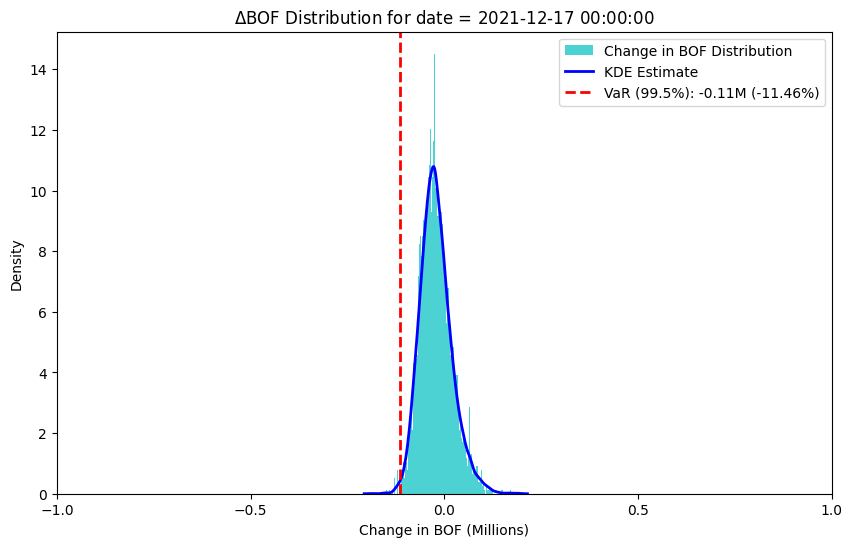

Processing Dates:  41%|████      | 500/1232 [1:03:57<1:42:02,  8.36s/dates]

scr = -114566.55147963666


Processing Dates:  41%|████      | 501/1232 [1:04:06<1:41:16,  8.31s/dates]

scr = -110866.46626782835


Processing Dates:  41%|████      | 502/1232 [1:04:14<1:40:49,  8.29s/dates]

scr = -110026.62929554527


Processing Dates:  41%|████      | 503/1232 [1:04:22<1:40:31,  8.27s/dates]

scr = -109413.65671270096


Processing Dates:  41%|████      | 504/1232 [1:04:30<1:39:46,  8.22s/dates]

scr = -110459.26968997948


Processing Dates:  41%|████      | 505/1232 [1:04:38<1:39:10,  8.18s/dates]

scr = -113416.78310351237


Processing Dates:  41%|████      | 506/1232 [1:04:46<1:38:48,  8.17s/dates]

scr = -113124.20949484153


Processing Dates:  41%|████      | 507/1232 [1:04:55<1:38:27,  8.15s/dates]

scr = -112009.26904508311


Processing Dates:  41%|████      | 508/1232 [1:05:03<1:38:39,  8.18s/dates]

scr = -112902.1704286902


Processing Dates:  41%|████▏     | 509/1232 [1:05:11<1:38:38,  8.19s/dates]

scr = -110002.93925771442


Processing Dates:  41%|████▏     | 510/1232 [1:05:19<1:38:13,  8.16s/dates]

scr = -114026.6777821622


Processing Dates:  41%|████▏     | 511/1232 [1:05:27<1:38:03,  8.16s/dates]

scr = -112823.41175532476


Processing Dates:  42%|████▏     | 512/1232 [1:05:35<1:38:02,  8.17s/dates]

scr = -110181.26000671113


Processing Dates:  42%|████▏     | 513/1232 [1:05:44<1:37:48,  8.16s/dates]

scr = -112197.42268927161


Processing Dates:  42%|████▏     | 514/1232 [1:05:52<1:37:39,  8.16s/dates]

scr = -110743.92377016057


Processing Dates:  42%|████▏     | 515/1232 [1:06:00<1:37:34,  8.16s/dates]

scr = -115917.9419229534


Processing Dates:  42%|████▏     | 516/1232 [1:06:08<1:37:28,  8.17s/dates]

scr = -113154.14086342946


Processing Dates:  42%|████▏     | 517/1232 [1:06:16<1:37:39,  8.20s/dates]

scr = -113314.06164255411


Processing Dates:  42%|████▏     | 518/1232 [1:06:25<1:37:26,  8.19s/dates]

scr = -112135.87679419384


Processing Dates:  42%|████▏     | 519/1232 [1:06:33<1:37:19,  8.19s/dates]

scr = -110682.91260427749


Processing Dates:  42%|████▏     | 520/1232 [1:06:41<1:37:07,  8.18s/dates]

scr = -111635.18125101358


Processing Dates:  42%|████▏     | 521/1232 [1:06:49<1:37:08,  8.20s/dates]

scr = -112880.18991961342


Processing Dates:  42%|████▏     | 522/1232 [1:06:57<1:37:04,  8.20s/dates]

scr = -109844.116595113


Processing Dates:  42%|████▏     | 523/1232 [1:07:06<1:36:55,  8.20s/dates]

scr = -112934.71445925566


Processing Dates:  43%|████▎     | 524/1232 [1:07:14<1:37:03,  8.23s/dates]

scr = -111085.62050944736


Processing Dates:  43%|████▎     | 525/1232 [1:07:22<1:36:43,  8.21s/dates]

scr = -109364.49340571536


Processing Dates:  43%|████▎     | 526/1232 [1:07:30<1:36:49,  8.23s/dates]

scr = -111084.70010738636


Processing Dates:  43%|████▎     | 527/1232 [1:07:39<1:36:36,  8.22s/dates]

scr = -110127.79695571898


Processing Dates:  43%|████▎     | 528/1232 [1:07:47<1:36:22,  8.21s/dates]

scr = -113038.25677337091


Processing Dates:  43%|████▎     | 529/1232 [1:07:55<1:36:05,  8.20s/dates]

scr = -109903.29175494339


Processing Dates:  43%|████▎     | 530/1232 [1:08:03<1:36:16,  8.23s/dates]

scr = -111045.1887583541


Processing Dates:  43%|████▎     | 531/1232 [1:08:11<1:36:11,  8.23s/dates]

scr = -114300.64433348787


Processing Dates:  43%|████▎     | 532/1232 [1:08:20<1:35:57,  8.23s/dates]

scr = -112868.38437632969


Processing Dates:  43%|████▎     | 533/1232 [1:08:28<1:35:45,  8.22s/dates]

scr = -112809.97286991663


Processing Dates:  43%|████▎     | 534/1232 [1:08:36<1:35:59,  8.25s/dates]

scr = -110978.68062054504


Processing Dates:  43%|████▎     | 535/1232 [1:08:44<1:35:46,  8.24s/dates]

scr = -112397.92987312043


Processing Dates:  44%|████▎     | 536/1232 [1:08:53<1:35:37,  8.24s/dates]

scr = -111990.23618629455


Processing Dates:  44%|████▎     | 537/1232 [1:09:01<1:35:42,  8.26s/dates]

scr = -112567.90380344936


Processing Dates:  44%|████▎     | 538/1232 [1:09:09<1:36:01,  8.30s/dates]

scr = -113819.87509062634


Processing Dates:  44%|████▍     | 539/1232 [1:09:18<1:35:29,  8.27s/dates]

scr = -110695.8066784477


Processing Dates:  44%|████▍     | 540/1232 [1:09:26<1:34:59,  8.24s/dates]

scr = -111477.60264611652


Processing Dates:  44%|████▍     | 541/1232 [1:09:34<1:34:41,  8.22s/dates]

scr = -109428.74067277915


Processing Dates:  44%|████▍     | 542/1232 [1:09:42<1:35:01,  8.26s/dates]

scr = -110910.10136618742


Processing Dates:  44%|████▍     | 543/1232 [1:09:51<1:34:58,  8.27s/dates]

scr = -110851.73393325537


Processing Dates:  44%|████▍     | 544/1232 [1:09:59<1:34:47,  8.27s/dates]

scr = -110441.96187153133


Processing Dates:  44%|████▍     | 545/1232 [1:10:07<1:34:27,  8.25s/dates]

scr = -112155.28645378386


Processing Dates:  44%|████▍     | 546/1232 [1:10:15<1:34:17,  8.25s/dates]

scr = -111638.67003193985


Processing Dates:  44%|████▍     | 547/1232 [1:10:24<1:34:32,  8.28s/dates]

scr = -110895.93904978885


Processing Dates:  44%|████▍     | 548/1232 [1:10:32<1:34:20,  8.28s/dates]

scr = -112850.30480308799


Processing Dates:  45%|████▍     | 549/1232 [1:10:40<1:34:00,  8.26s/dates]

scr = -112985.06032677248


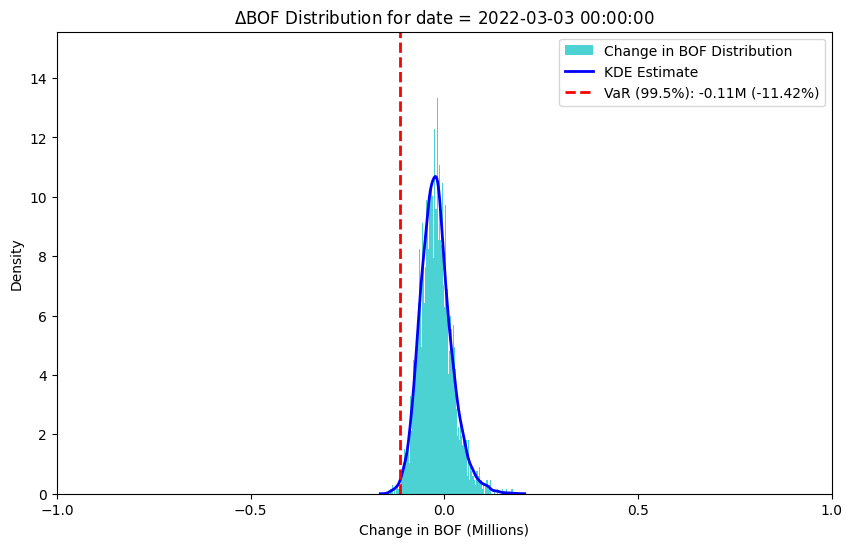

Processing Dates:  45%|████▍     | 550/1232 [1:10:49<1:36:15,  8.47s/dates]

scr = -114214.34607322144


Processing Dates:  45%|████▍     | 551/1232 [1:10:57<1:35:27,  8.41s/dates]

scr = -112621.64590354095


Processing Dates:  45%|████▍     | 552/1232 [1:11:06<1:35:08,  8.39s/dates]

scr = -112814.61441261022


Processing Dates:  45%|████▍     | 553/1232 [1:11:14<1:35:02,  8.40s/dates]

scr = -110735.50039478308


Processing Dates:  45%|████▍     | 554/1232 [1:11:22<1:34:22,  8.35s/dates]

scr = -113826.21610187809


Processing Dates:  45%|████▌     | 555/1232 [1:11:31<1:33:45,  8.31s/dates]

scr = -113591.3432195309


Processing Dates:  45%|████▌     | 556/1232 [1:11:39<1:33:30,  8.30s/dates]

scr = -116248.09390462327


Processing Dates:  45%|████▌     | 557/1232 [1:11:47<1:33:36,  8.32s/dates]

scr = -113734.9542612375


Processing Dates:  45%|████▌     | 558/1232 [1:11:55<1:33:18,  8.31s/dates]

scr = -111751.2767932265


Processing Dates:  45%|████▌     | 559/1232 [1:12:04<1:33:05,  8.30s/dates]

scr = -113721.87154787879


Processing Dates:  45%|████▌     | 560/1232 [1:12:12<1:32:47,  8.29s/dates]

scr = -115669.56813897814


Processing Dates:  46%|████▌     | 561/1232 [1:12:20<1:32:47,  8.30s/dates]

scr = -112196.60801455096


Processing Dates:  46%|████▌     | 562/1232 [1:12:29<1:32:36,  8.29s/dates]

scr = -112622.56524285715


Processing Dates:  46%|████▌     | 563/1232 [1:12:37<1:32:19,  8.28s/dates]

scr = -116010.61715178889


Processing Dates:  46%|████▌     | 564/1232 [1:12:45<1:32:03,  8.27s/dates]

scr = -111359.45838936394


Processing Dates:  46%|████▌     | 565/1232 [1:12:53<1:32:06,  8.29s/dates]

scr = -109809.62817466453


Processing Dates:  46%|████▌     | 566/1232 [1:13:02<1:31:45,  8.27s/dates]

scr = -111239.98529544008


Processing Dates:  46%|████▌     | 567/1232 [1:13:10<1:31:42,  8.27s/dates]

scr = -112865.88332757671


Processing Dates:  46%|████▌     | 568/1232 [1:13:18<1:31:34,  8.27s/dates]

scr = -111751.66618132996


Processing Dates:  46%|████▌     | 569/1232 [1:13:27<1:31:39,  8.29s/dates]

scr = -112901.72218000681


Processing Dates:  46%|████▋     | 570/1232 [1:13:35<1:31:36,  8.30s/dates]

scr = -109445.66847553788


Processing Dates:  46%|████▋     | 571/1232 [1:13:43<1:31:24,  8.30s/dates]

scr = -112048.8745748793


Processing Dates:  46%|████▋     | 572/1232 [1:13:51<1:31:25,  8.31s/dates]

scr = -112096.35119167602


Processing Dates:  47%|████▋     | 573/1232 [1:14:00<1:31:31,  8.33s/dates]

scr = -110511.3098221151


Processing Dates:  47%|████▋     | 574/1232 [1:14:08<1:31:11,  8.32s/dates]

scr = -109359.00357845577


Processing Dates:  47%|████▋     | 575/1232 [1:14:16<1:31:06,  8.32s/dates]

scr = -110422.80921699805


Processing Dates:  47%|████▋     | 576/1232 [1:14:25<1:30:51,  8.31s/dates]

scr = -111342.76013256337


Processing Dates:  47%|████▋     | 577/1232 [1:14:33<1:31:07,  8.35s/dates]

scr = -110555.99696866165


Processing Dates:  47%|████▋     | 578/1232 [1:14:41<1:30:49,  8.33s/dates]

scr = -113153.8935779026


Processing Dates:  47%|████▋     | 579/1232 [1:14:50<1:30:30,  8.32s/dates]

scr = -110372.31148257121


Processing Dates:  47%|████▋     | 580/1232 [1:14:58<1:30:49,  8.36s/dates]

scr = -112805.775849375


Processing Dates:  47%|████▋     | 581/1232 [1:15:06<1:30:25,  8.33s/dates]

scr = -110402.21515679485


Processing Dates:  47%|████▋     | 582/1232 [1:15:15<1:30:28,  8.35s/dates]

scr = -113172.57424500061


Processing Dates:  47%|████▋     | 583/1232 [1:15:23<1:30:38,  8.38s/dates]

scr = -110978.88989947726


Processing Dates:  47%|████▋     | 584/1232 [1:15:32<1:30:15,  8.36s/dates]

scr = -111531.33691556385


Processing Dates:  47%|████▋     | 585/1232 [1:15:40<1:30:20,  8.38s/dates]

scr = -112023.24083781929


Processing Dates:  48%|████▊     | 586/1232 [1:15:48<1:30:03,  8.36s/dates]

scr = -111302.76062634321


Processing Dates:  48%|████▊     | 587/1232 [1:15:57<1:29:42,  8.34s/dates]

scr = -114310.66289673938


Processing Dates:  48%|████▊     | 588/1232 [1:16:05<1:29:42,  8.36s/dates]

scr = -111222.2041468812


Processing Dates:  48%|████▊     | 589/1232 [1:16:14<1:29:47,  8.38s/dates]

scr = -111962.60125350949


Processing Dates:  48%|████▊     | 590/1232 [1:16:22<1:29:31,  8.37s/dates]

scr = -110088.0216828318


Processing Dates:  48%|████▊     | 591/1232 [1:16:30<1:29:15,  8.35s/dates]

scr = -113514.91478221345


Processing Dates:  48%|████▊     | 592/1232 [1:16:39<1:29:15,  8.37s/dates]

scr = -114669.80696409763


Processing Dates:  48%|████▊     | 593/1232 [1:16:47<1:29:03,  8.36s/dates]

scr = -110776.34891395566


Processing Dates:  48%|████▊     | 594/1232 [1:16:55<1:28:51,  8.36s/dates]

scr = -114220.07947652004


Processing Dates:  48%|████▊     | 595/1232 [1:17:03<1:28:11,  8.31s/dates]

scr = -113385.95291689738


Processing Dates:  48%|████▊     | 596/1232 [1:17:12<1:28:22,  8.34s/dates]

scr = -109747.38898561474


Processing Dates:  48%|████▊     | 597/1232 [1:17:20<1:28:08,  8.33s/dates]

scr = -112428.66712385732


Processing Dates:  49%|████▊     | 598/1232 [1:17:28<1:27:57,  8.32s/dates]

scr = -112368.91856797907


Processing Dates:  49%|████▊     | 599/1232 [1:17:37<1:27:45,  8.32s/dates]

scr = -110250.10379625589


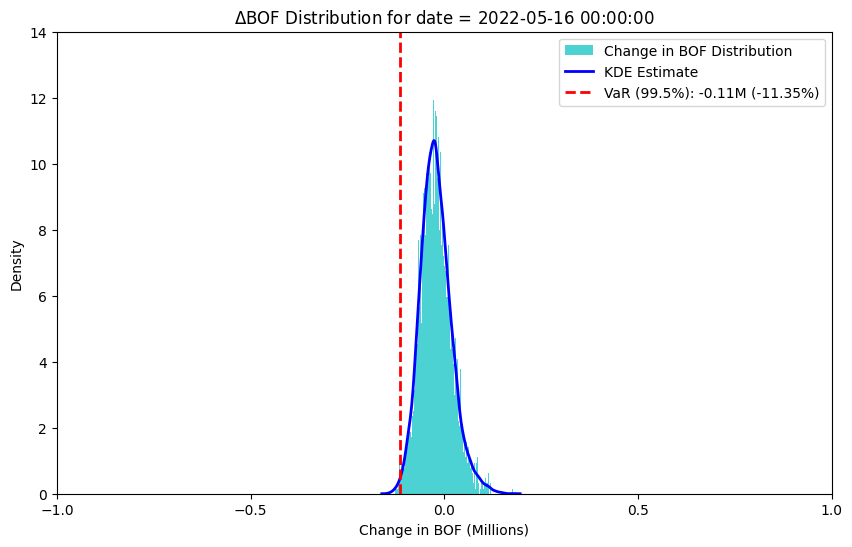

Processing Dates:  49%|████▊     | 600/1232 [1:17:46<1:29:38,  8.51s/dates]

scr = -113522.86756137309


Processing Dates:  49%|████▉     | 601/1232 [1:17:54<1:29:04,  8.47s/dates]

scr = -110527.51956004275


Processing Dates:  49%|████▉     | 602/1232 [1:18:03<1:28:53,  8.47s/dates]

scr = -110721.15929910111


Processing Dates:  49%|████▉     | 603/1232 [1:18:11<1:28:40,  8.46s/dates]

scr = -112729.66374475756


Processing Dates:  49%|████▉     | 604/1232 [1:18:19<1:28:28,  8.45s/dates]

scr = -109943.26307964322


Processing Dates:  49%|████▉     | 605/1232 [1:18:28<1:28:02,  8.43s/dates]

scr = -108825.2625673675


Processing Dates:  49%|████▉     | 606/1232 [1:18:36<1:28:01,  8.44s/dates]

scr = -112497.59300275795


Processing Dates:  49%|████▉     | 607/1232 [1:18:45<1:27:37,  8.41s/dates]

scr = -113961.87702662329


Processing Dates:  49%|████▉     | 608/1232 [1:18:53<1:27:19,  8.40s/dates]

scr = -111097.64366855887


Processing Dates:  49%|████▉     | 609/1232 [1:19:01<1:27:12,  8.40s/dates]

scr = -112693.01030225209


Processing Dates:  50%|████▉     | 610/1232 [1:19:10<1:27:09,  8.41s/dates]

scr = -111015.86989751822


Processing Dates:  50%|████▉     | 611/1232 [1:19:18<1:27:10,  8.42s/dates]

scr = -112729.03370160512


Processing Dates:  50%|████▉     | 612/1232 [1:19:27<1:27:05,  8.43s/dates]

scr = -110739.24421889982


Processing Dates:  50%|████▉     | 613/1232 [1:19:35<1:26:53,  8.42s/dates]

scr = -111377.20068868909


Processing Dates:  50%|████▉     | 614/1232 [1:19:44<1:26:39,  8.41s/dates]

scr = -112810.35217993318


Processing Dates:  50%|████▉     | 615/1232 [1:19:52<1:26:39,  8.43s/dates]

scr = -109801.35866382597


Processing Dates:  50%|█████     | 616/1232 [1:20:00<1:26:19,  8.41s/dates]

scr = -111146.83431683124


Processing Dates:  50%|█████     | 617/1232 [1:20:09<1:26:25,  8.43s/dates]

scr = -110612.09077592846


Processing Dates:  50%|█████     | 618/1232 [1:20:17<1:26:19,  8.44s/dates]

scr = -114917.26491485862


Processing Dates:  50%|█████     | 619/1232 [1:20:26<1:25:59,  8.42s/dates]

scr = -111386.76653687881


Processing Dates:  50%|█████     | 620/1232 [1:20:34<1:25:43,  8.40s/dates]

scr = -113350.85117932456


Processing Dates:  50%|█████     | 621/1232 [1:20:42<1:25:35,  8.41s/dates]

scr = -113321.42152214861


Processing Dates:  50%|█████     | 622/1232 [1:20:51<1:25:39,  8.43s/dates]

scr = -110404.3678523337


Processing Dates:  51%|█████     | 623/1232 [1:20:59<1:25:28,  8.42s/dates]

scr = -110925.71128794532


Processing Dates:  51%|█████     | 624/1232 [1:21:08<1:25:20,  8.42s/dates]

scr = -113806.56497595923


Processing Dates:  51%|█████     | 625/1232 [1:21:16<1:25:12,  8.42s/dates]

scr = -112897.00505367556


Processing Dates:  51%|█████     | 626/1232 [1:21:25<1:25:19,  8.45s/dates]

scr = -112366.89374437052


Processing Dates:  51%|█████     | 627/1232 [1:21:33<1:25:16,  8.46s/dates]

scr = -112359.7180462973


Processing Dates:  51%|█████     | 628/1232 [1:21:42<1:24:53,  8.43s/dates]

scr = -114042.34061035425


Processing Dates:  51%|█████     | 629/1232 [1:21:50<1:24:49,  8.44s/dates]

scr = -110651.73598884302


Processing Dates:  51%|█████     | 630/1232 [1:21:59<1:24:59,  8.47s/dates]

scr = -112404.52247271407


Processing Dates:  51%|█████     | 631/1232 [1:22:07<1:24:42,  8.46s/dates]

scr = -110598.74628992083


Processing Dates:  51%|█████▏    | 632/1232 [1:22:15<1:24:28,  8.45s/dates]

scr = -111159.67710567208


Processing Dates:  51%|█████▏    | 633/1232 [1:22:24<1:24:24,  8.46s/dates]

scr = -112282.96465293618


Processing Dates:  51%|█████▏    | 634/1232 [1:22:32<1:24:32,  8.48s/dates]

scr = -111337.96357321327


Processing Dates:  52%|█████▏    | 635/1232 [1:22:41<1:24:10,  8.46s/dates]

scr = -113648.82836459023


Processing Dates:  52%|█████▏    | 636/1232 [1:22:49<1:23:58,  8.45s/dates]

scr = -113402.58638377594


Processing Dates:  52%|█████▏    | 637/1232 [1:22:58<1:24:07,  8.48s/dates]

scr = -111964.5356777518


Processing Dates:  52%|█████▏    | 638/1232 [1:23:06<1:23:43,  8.46s/dates]

scr = -111868.0663817542


Processing Dates:  52%|█████▏    | 639/1232 [1:23:15<1:23:38,  8.46s/dates]

scr = -111599.23051640922


Processing Dates:  52%|█████▏    | 640/1232 [1:23:23<1:23:23,  8.45s/dates]

scr = -112984.46463684355


Processing Dates:  52%|█████▏    | 641/1232 [1:23:32<1:23:28,  8.47s/dates]

scr = -110723.66771332322


Processing Dates:  52%|█████▏    | 642/1232 [1:23:40<1:23:10,  8.46s/dates]

scr = -111414.20561675479


Processing Dates:  52%|█████▏    | 643/1232 [1:23:48<1:22:56,  8.45s/dates]

scr = -111753.23154127387


Processing Dates:  52%|█████▏    | 644/1232 [1:23:57<1:22:40,  8.44s/dates]

scr = -113068.63407061173


Processing Dates:  52%|█████▏    | 645/1232 [1:24:05<1:22:51,  8.47s/dates]

scr = -111772.4835537611


Processing Dates:  52%|█████▏    | 646/1232 [1:24:14<1:22:43,  8.47s/dates]

scr = -112014.09305710922


Processing Dates:  53%|█████▎    | 647/1232 [1:24:22<1:22:35,  8.47s/dates]

scr = -113798.1340070969


Processing Dates:  53%|█████▎    | 648/1232 [1:24:31<1:22:30,  8.48s/dates]

scr = -112025.57999419351


Processing Dates:  53%|█████▎    | 649/1232 [1:24:39<1:22:33,  8.50s/dates]

scr = -113840.86544655937


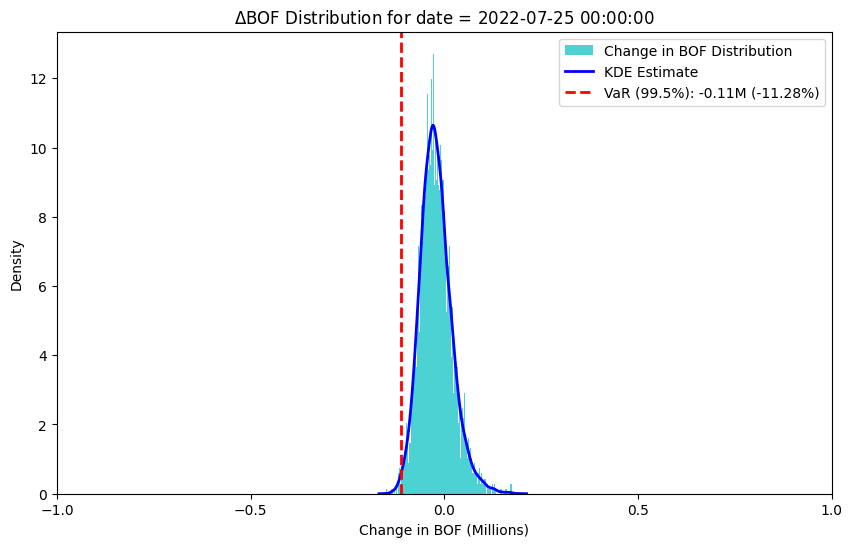

Processing Dates:  53%|█████▎    | 650/1232 [1:24:48<1:23:57,  8.66s/dates]

scr = -112801.46147988172


Processing Dates:  53%|█████▎    | 651/1232 [1:24:57<1:23:40,  8.64s/dates]

scr = -112630.1273636572


Processing Dates:  53%|█████▎    | 652/1232 [1:25:05<1:22:57,  8.58s/dates]

scr = -112886.00313871108


Processing Dates:  53%|█████▎    | 653/1232 [1:25:14<1:22:41,  8.57s/dates]

scr = -109516.31824871065


Processing Dates:  53%|█████▎    | 654/1232 [1:25:23<1:22:16,  8.54s/dates]

scr = -111957.38547771447


Processing Dates:  53%|█████▎    | 655/1232 [1:25:31<1:22:02,  8.53s/dates]

scr = -113563.19914452148


Processing Dates:  53%|█████▎    | 656/1232 [1:25:39<1:21:32,  8.49s/dates]

scr = -113911.47835396626


Processing Dates:  53%|█████▎    | 657/1232 [1:25:48<1:21:12,  8.47s/dates]

scr = -110837.68426259165


Processing Dates:  53%|█████▎    | 658/1232 [1:25:56<1:21:06,  8.48s/dates]

scr = -110238.74497470027


Processing Dates:  53%|█████▎    | 659/1232 [1:26:05<1:21:06,  8.49s/dates]

scr = -113653.59530508051


Processing Dates:  54%|█████▎    | 660/1232 [1:26:13<1:20:57,  8.49s/dates]

scr = -109006.86909089232


Processing Dates:  54%|█████▎    | 661/1232 [1:26:22<1:20:46,  8.49s/dates]

scr = -114198.49875376569


Processing Dates:  54%|█████▎    | 662/1232 [1:26:30<1:20:47,  8.50s/dates]

scr = -113648.884591672


Processing Dates:  54%|█████▍    | 663/1232 [1:26:39<1:20:23,  8.48s/dates]

scr = -109162.7903330558


Processing Dates:  54%|█████▍    | 664/1232 [1:26:47<1:20:09,  8.47s/dates]

scr = -110141.13339337209


Processing Dates:  54%|█████▍    | 665/1232 [1:26:56<1:20:03,  8.47s/dates]

scr = -112849.91822741643


Processing Dates:  54%|█████▍    | 666/1232 [1:27:04<1:20:09,  8.50s/dates]

scr = -112986.69589753837


Processing Dates:  54%|█████▍    | 667/1232 [1:27:13<1:20:00,  8.50s/dates]

scr = -112822.15247189386


Processing Dates:  54%|█████▍    | 668/1232 [1:27:21<1:19:53,  8.50s/dates]

scr = -111479.85915946132


Processing Dates:  54%|█████▍    | 669/1232 [1:27:30<1:19:49,  8.51s/dates]

scr = -112824.8153427069


Processing Dates:  54%|█████▍    | 670/1232 [1:27:38<1:19:47,  8.52s/dates]

scr = -111389.86055517472


Processing Dates:  54%|█████▍    | 671/1232 [1:27:47<1:19:33,  8.51s/dates]

scr = -111739.0334276636


Processing Dates:  55%|█████▍    | 672/1232 [1:27:55<1:19:25,  8.51s/dates]

scr = -112182.3934305845


Processing Dates:  55%|█████▍    | 673/1232 [1:28:04<1:19:11,  8.50s/dates]

scr = -113432.75117208208


Processing Dates:  55%|█████▍    | 674/1232 [1:28:13<1:19:37,  8.56s/dates]

scr = -112805.306345648


Processing Dates:  55%|█████▍    | 675/1232 [1:28:21<1:19:21,  8.55s/dates]

scr = -114194.14423192976


Processing Dates:  55%|█████▍    | 676/1232 [1:28:30<1:19:04,  8.53s/dates]

scr = -112977.70859808513


Processing Dates:  55%|█████▍    | 677/1232 [1:28:38<1:18:54,  8.53s/dates]

scr = -111171.41944042212


Processing Dates:  55%|█████▌    | 678/1232 [1:28:47<1:18:59,  8.55s/dates]

scr = -111541.43410064158


Processing Dates:  55%|█████▌    | 679/1232 [1:28:55<1:18:43,  8.54s/dates]

scr = -110870.31017938897


Processing Dates:  55%|█████▌    | 680/1232 [1:29:04<1:18:37,  8.55s/dates]

scr = -109941.61050898134


Processing Dates:  55%|█████▌    | 681/1232 [1:29:12<1:18:51,  8.59s/dates]

scr = -109024.71841704764


Processing Dates:  55%|█████▌    | 682/1232 [1:29:21<1:18:40,  8.58s/dates]

scr = -110256.87820488244


Processing Dates:  55%|█████▌    | 683/1232 [1:29:30<1:18:19,  8.56s/dates]

scr = -111054.20507288253


Processing Dates:  56%|█████▌    | 684/1232 [1:29:38<1:18:02,  8.54s/dates]

scr = -110990.54760781424


Processing Dates:  56%|█████▌    | 685/1232 [1:29:47<1:18:04,  8.56s/dates]

scr = -113726.43734292444


Processing Dates:  56%|█████▌    | 686/1232 [1:29:55<1:17:54,  8.56s/dates]

scr = -111497.75675867079


Processing Dates:  56%|█████▌    | 687/1232 [1:30:04<1:17:40,  8.55s/dates]

scr = -110780.9834591211


Processing Dates:  56%|█████▌    | 688/1232 [1:30:12<1:17:32,  8.55s/dates]

scr = -111703.29270101826


Processing Dates:  56%|█████▌    | 689/1232 [1:30:21<1:17:47,  8.59s/dates]

scr = -112042.23444077357


Processing Dates:  56%|█████▌    | 690/1232 [1:30:29<1:17:27,  8.58s/dates]

scr = -113500.34635519296


Processing Dates:  56%|█████▌    | 691/1232 [1:30:38<1:17:13,  8.56s/dates]

scr = -113004.59271939952


Processing Dates:  56%|█████▌    | 692/1232 [1:30:47<1:17:03,  8.56s/dates]

scr = -108702.31106693546


Processing Dates:  56%|█████▋    | 693/1232 [1:30:55<1:17:14,  8.60s/dates]

scr = -111797.19288316181


Processing Dates:  56%|█████▋    | 694/1232 [1:31:04<1:16:58,  8.58s/dates]

scr = -111618.26712252745


Processing Dates:  56%|█████▋    | 695/1232 [1:31:12<1:16:48,  8.58s/dates]

scr = -113737.59946802679


Processing Dates:  56%|█████▋    | 696/1232 [1:31:21<1:16:41,  8.59s/dates]

scr = -111916.09789954047


Processing Dates:  57%|█████▋    | 697/1232 [1:31:30<1:16:34,  8.59s/dates]

scr = -112068.2340194075


Processing Dates:  57%|█████▋    | 698/1232 [1:31:38<1:16:15,  8.57s/dates]

scr = -111524.84732095711


Processing Dates:  57%|█████▋    | 699/1232 [1:31:47<1:16:10,  8.57s/dates]

scr = -110509.690966023


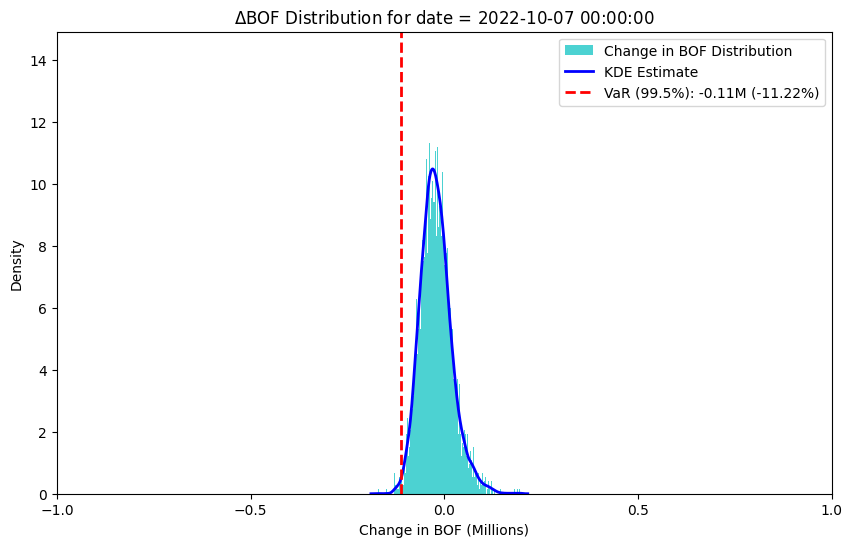

Processing Dates:  57%|█████▋    | 700/1232 [1:31:56<1:17:54,  8.79s/dates]

scr = -112191.54855719158


Processing Dates:  57%|█████▋    | 701/1232 [1:32:05<1:17:07,  8.71s/dates]

scr = -114058.55313732417


Processing Dates:  57%|█████▋    | 702/1232 [1:32:13<1:17:04,  8.73s/dates]

scr = -111726.79920017782


Processing Dates:  57%|█████▋    | 703/1232 [1:32:22<1:16:45,  8.71s/dates]

scr = -110966.3508859362


Processing Dates:  57%|█████▋    | 704/1232 [1:32:31<1:16:23,  8.68s/dates]

scr = -113092.30130660735


Processing Dates:  57%|█████▋    | 705/1232 [1:32:39<1:15:53,  8.64s/dates]

scr = -112203.07555698672


Processing Dates:  57%|█████▋    | 706/1232 [1:32:48<1:15:39,  8.63s/dates]

scr = -114381.88259707588


Processing Dates:  57%|█████▋    | 707/1232 [1:32:56<1:15:24,  8.62s/dates]

scr = -113175.44379651478


Processing Dates:  57%|█████▋    | 708/1232 [1:33:05<1:15:02,  8.59s/dates]

scr = -111998.60159863615


Processing Dates:  58%|█████▊    | 709/1232 [1:33:13<1:14:55,  8.60s/dates]

scr = -109636.53189521242


Processing Dates:  58%|█████▊    | 710/1232 [1:33:22<1:14:59,  8.62s/dates]

scr = -111307.79035128462


Processing Dates:  58%|█████▊    | 711/1232 [1:33:31<1:14:40,  8.60s/dates]

scr = -111726.49696566978


Processing Dates:  58%|█████▊    | 712/1232 [1:33:39<1:14:30,  8.60s/dates]

scr = -111929.90450150079


Processing Dates:  58%|█████▊    | 713/1232 [1:33:48<1:14:35,  8.62s/dates]

scr = -113589.76076352518


Processing Dates:  58%|█████▊    | 714/1232 [1:33:57<1:14:25,  8.62s/dates]

scr = -112012.84978791926


Processing Dates:  58%|█████▊    | 715/1232 [1:34:05<1:14:05,  8.60s/dates]

scr = -112180.25376267846


Processing Dates:  58%|█████▊    | 716/1232 [1:34:14<1:13:56,  8.60s/dates]

scr = -114773.46623576034


Processing Dates:  58%|█████▊    | 717/1232 [1:34:22<1:13:53,  8.61s/dates]

scr = -112320.02544308515


Processing Dates:  58%|█████▊    | 718/1232 [1:34:31<1:13:46,  8.61s/dates]

scr = -110869.58439890169


Processing Dates:  58%|█████▊    | 719/1232 [1:34:40<1:13:36,  8.61s/dates]

scr = -112840.15578911915


Processing Dates:  58%|█████▊    | 720/1232 [1:34:48<1:13:27,  8.61s/dates]

scr = -114825.227473218


Processing Dates:  59%|█████▊    | 721/1232 [1:34:57<1:13:40,  8.65s/dates]

scr = -115411.21865905762


Processing Dates:  59%|█████▊    | 722/1232 [1:35:06<1:13:26,  8.64s/dates]

scr = -112170.7320241274


Processing Dates:  59%|█████▊    | 723/1232 [1:35:14<1:13:18,  8.64s/dates]

scr = -115138.05904218128


Processing Dates:  59%|█████▉    | 724/1232 [1:35:23<1:13:35,  8.69s/dates]

scr = -112970.38668332237


Processing Dates:  59%|█████▉    | 725/1232 [1:35:32<1:13:08,  8.66s/dates]

scr = -113872.3109005601


Processing Dates:  59%|█████▉    | 726/1232 [1:35:40<1:12:55,  8.65s/dates]

scr = -111595.4656160055


Processing Dates:  59%|█████▉    | 727/1232 [1:35:49<1:12:43,  8.64s/dates]

scr = -111745.3094867897


Processing Dates:  59%|█████▉    | 728/1232 [1:35:58<1:12:47,  8.67s/dates]

scr = -111426.81625764036


Processing Dates:  59%|█████▉    | 729/1232 [1:36:06<1:12:30,  8.65s/dates]

scr = -110684.114081568


Processing Dates:  59%|█████▉    | 730/1232 [1:36:15<1:12:30,  8.67s/dates]

scr = -112126.89739521846


Processing Dates:  59%|█████▉    | 731/1232 [1:36:23<1:12:08,  8.64s/dates]

scr = -112534.60759074886


Processing Dates:  59%|█████▉    | 732/1232 [1:36:32<1:12:10,  8.66s/dates]

scr = -108900.79131956375


Processing Dates:  59%|█████▉    | 733/1232 [1:36:41<1:11:51,  8.64s/dates]

scr = -109009.04615101127


Processing Dates:  60%|█████▉    | 734/1232 [1:36:49<1:11:37,  8.63s/dates]

scr = -112549.72323089326


Processing Dates:  60%|█████▉    | 735/1232 [1:36:58<1:11:38,  8.65s/dates]

scr = -112148.85027476984


Processing Dates:  60%|█████▉    | 736/1232 [1:37:07<1:11:21,  8.63s/dates]

scr = -111595.6903917257


Processing Dates:  60%|█████▉    | 737/1232 [1:37:15<1:11:14,  8.63s/dates]

scr = -112296.9981130682


Processing Dates:  60%|█████▉    | 738/1232 [1:37:24<1:11:11,  8.65s/dates]

scr = -111480.81000811701


Processing Dates:  60%|█████▉    | 739/1232 [1:37:33<1:11:09,  8.66s/dates]

scr = -110076.00393002098


Processing Dates:  60%|██████    | 740/1232 [1:37:41<1:10:58,  8.66s/dates]

scr = -111896.69095434461


Processing Dates:  60%|██████    | 741/1232 [1:37:50<1:10:50,  8.66s/dates]

scr = -109532.63824099948


Processing Dates:  60%|██████    | 742/1232 [1:37:59<1:10:44,  8.66s/dates]

scr = -112121.78358398972


Processing Dates:  60%|██████    | 743/1232 [1:38:07<1:10:49,  8.69s/dates]

scr = -112725.18124351223


Processing Dates:  60%|██████    | 744/1232 [1:38:16<1:10:38,  8.69s/dates]

scr = -111740.60498976028


Processing Dates:  60%|██████    | 745/1232 [1:38:25<1:10:27,  8.68s/dates]

scr = -113598.25470186227


Processing Dates:  61%|██████    | 746/1232 [1:38:33<1:10:19,  8.68s/dates]

scr = -115881.34009097233


Processing Dates:  61%|██████    | 747/1232 [1:38:42<1:10:14,  8.69s/dates]

scr = -112741.55292318058


Processing Dates:  61%|██████    | 748/1232 [1:38:51<1:10:03,  8.69s/dates]

scr = -114576.8719209534


Processing Dates:  61%|██████    | 749/1232 [1:39:00<1:10:03,  8.70s/dates]

scr = -113927.5264911189


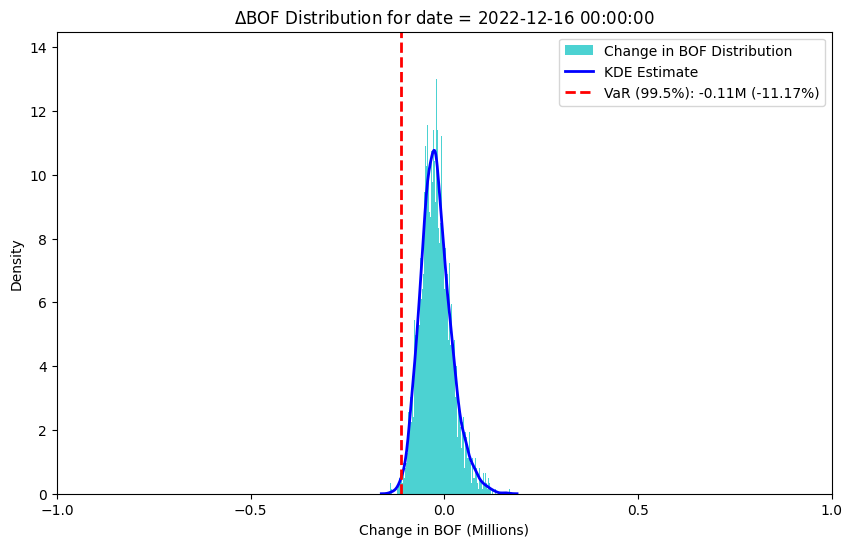

Processing Dates:  61%|██████    | 750/1232 [1:39:09<1:11:22,  8.88s/dates]

scr = -111711.34716881881


Processing Dates:  61%|██████    | 751/1232 [1:39:17<1:10:21,  8.78s/dates]

scr = -110719.98910282954


Processing Dates:  61%|██████    | 752/1232 [1:39:26<1:09:55,  8.74s/dates]

scr = -112028.27105763566


Processing Dates:  61%|██████    | 753/1232 [1:39:35<1:09:51,  8.75s/dates]

scr = -113725.82610896797


Processing Dates:  61%|██████    | 754/1232 [1:39:43<1:09:32,  8.73s/dates]

scr = -112296.39128020142


Processing Dates:  61%|██████▏   | 755/1232 [1:39:52<1:09:18,  8.72s/dates]

scr = -111608.74918127338


Processing Dates:  61%|██████▏   | 756/1232 [1:40:01<1:09:17,  8.73s/dates]

scr = -111234.14142044881


Processing Dates:  61%|██████▏   | 757/1232 [1:40:10<1:09:06,  8.73s/dates]

scr = -111233.04318885265


Processing Dates:  62%|██████▏   | 758/1232 [1:40:18<1:08:48,  8.71s/dates]

scr = -112333.87147757117


Processing Dates:  62%|██████▏   | 759/1232 [1:40:27<1:08:39,  8.71s/dates]

scr = -111987.6494819314


Processing Dates:  62%|██████▏   | 760/1232 [1:40:36<1:08:35,  8.72s/dates]

scr = -110460.46047865466


Processing Dates:  62%|██████▏   | 761/1232 [1:40:44<1:08:18,  8.70s/dates]

scr = -113989.96487304138


Processing Dates:  62%|██████▏   | 762/1232 [1:40:53<1:08:09,  8.70s/dates]

scr = -113085.98604557845


Processing Dates:  62%|██████▏   | 763/1232 [1:41:02<1:08:12,  8.73s/dates]

scr = -112870.63169675288


Processing Dates:  62%|██████▏   | 764/1232 [1:41:11<1:08:03,  8.73s/dates]

scr = -110203.97078892017


Processing Dates:  62%|██████▏   | 765/1232 [1:41:19<1:07:47,  8.71s/dates]

scr = -110923.50579384393


Processing Dates:  62%|██████▏   | 766/1232 [1:41:28<1:07:41,  8.71s/dates]

scr = -114836.40623982831


Processing Dates:  62%|██████▏   | 767/1232 [1:41:37<1:07:49,  8.75s/dates]

scr = -112604.4696076094


Processing Dates:  62%|██████▏   | 768/1232 [1:41:46<1:07:26,  8.72s/dates]

scr = -113393.90038627351


Processing Dates:  62%|██████▏   | 769/1232 [1:41:54<1:07:20,  8.73s/dates]

scr = -112712.67537856784


Processing Dates:  62%|██████▎   | 770/1232 [1:42:03<1:07:23,  8.75s/dates]

scr = -110509.48495472496


Processing Dates:  63%|██████▎   | 771/1232 [1:42:12<1:07:19,  8.76s/dates]

scr = -110343.18945885787


Processing Dates:  63%|██████▎   | 772/1232 [1:42:21<1:07:05,  8.75s/dates]

scr = -109452.79427298951


Processing Dates:  63%|██████▎   | 773/1232 [1:42:29<1:07:11,  8.78s/dates]

scr = -114627.25117105205


Processing Dates:  63%|██████▎   | 774/1232 [1:42:38<1:06:50,  8.76s/dates]

scr = -112322.49663309909


Processing Dates:  63%|██████▎   | 775/1232 [1:42:47<1:06:30,  8.73s/dates]

scr = -109860.67999911454


Processing Dates:  63%|██████▎   | 776/1232 [1:42:56<1:06:16,  8.72s/dates]

scr = -108204.60542273102


Processing Dates:  63%|██████▎   | 777/1232 [1:43:04<1:06:19,  8.75s/dates]

scr = -112893.6402455793


Processing Dates:  63%|██████▎   | 778/1232 [1:43:13<1:06:14,  8.76s/dates]

scr = -110822.39685267308


Processing Dates:  63%|██████▎   | 779/1232 [1:43:22<1:06:11,  8.77s/dates]

scr = -112426.74237787243


Processing Dates:  63%|██████▎   | 780/1232 [1:43:31<1:06:05,  8.77s/dates]

scr = -113573.08815688815


Processing Dates:  63%|██████▎   | 781/1232 [1:43:39<1:05:57,  8.77s/dates]

scr = -109867.54612686163


Processing Dates:  63%|██████▎   | 782/1232 [1:43:48<1:05:49,  8.78s/dates]

scr = -111143.99973161421


Processing Dates:  64%|██████▎   | 783/1232 [1:43:57<1:05:39,  8.77s/dates]

scr = -111280.38787806654


Processing Dates:  64%|██████▎   | 784/1232 [1:44:06<1:05:40,  8.79s/dates]

scr = -114794.02617004942


Processing Dates:  64%|██████▎   | 785/1232 [1:44:15<1:05:30,  8.79s/dates]

scr = -110630.01355087


Processing Dates:  64%|██████▍   | 786/1232 [1:44:23<1:05:17,  8.78s/dates]

scr = -111502.03158124104


Processing Dates:  64%|██████▍   | 787/1232 [1:44:32<1:05:14,  8.80s/dates]

scr = -112993.08431642807


Processing Dates:  64%|██████▍   | 788/1232 [1:44:41<1:05:01,  8.79s/dates]

scr = -115584.75898109445


Processing Dates:  64%|██████▍   | 789/1232 [1:44:50<1:04:47,  8.78s/dates]

scr = -114128.90244009564


Processing Dates:  64%|██████▍   | 790/1232 [1:44:58<1:04:34,  8.77s/dates]

scr = -114659.55577764784


Processing Dates:  64%|██████▍   | 791/1232 [1:45:07<1:04:38,  8.79s/dates]

scr = -112209.62705925536


Processing Dates:  64%|██████▍   | 792/1232 [1:45:16<1:04:29,  8.79s/dates]

scr = -113563.0616303908


Processing Dates:  64%|██████▍   | 793/1232 [1:45:25<1:04:11,  8.77s/dates]

scr = -108615.07932117471


Processing Dates:  64%|██████▍   | 794/1232 [1:45:34<1:04:13,  8.80s/dates]

scr = -111929.49904356271


Processing Dates:  65%|██████▍   | 795/1232 [1:45:42<1:04:03,  8.80s/dates]

scr = -113559.45021335602


Processing Dates:  65%|██████▍   | 796/1232 [1:45:51<1:03:46,  8.78s/dates]

scr = -111004.21578740526


Processing Dates:  65%|██████▍   | 797/1232 [1:46:00<1:03:46,  8.80s/dates]

scr = -109770.02174309593


Processing Dates:  65%|██████▍   | 798/1232 [1:46:09<1:03:36,  8.79s/dates]

scr = -111624.92563056943


Processing Dates:  65%|██████▍   | 799/1232 [1:46:18<1:03:23,  8.78s/dates]

scr = -109814.51743342532


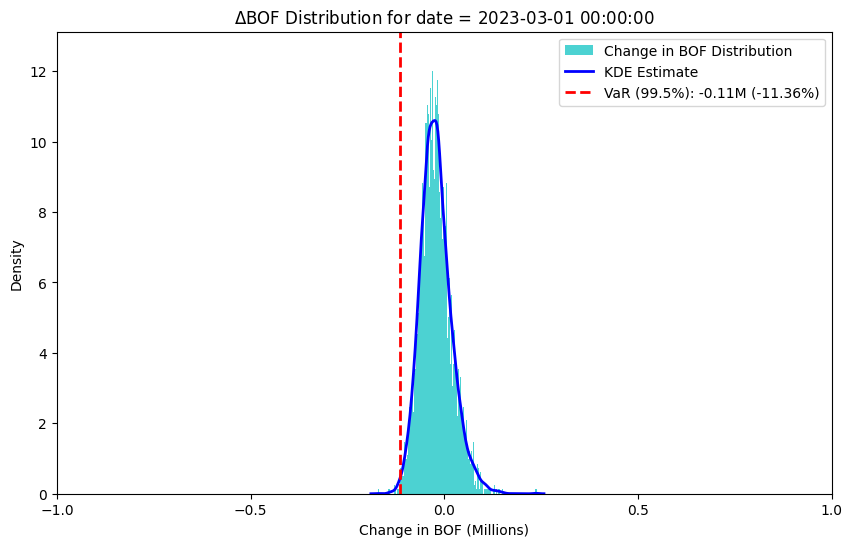

Processing Dates:  65%|██████▍   | 800/1232 [1:46:27<1:04:42,  8.99s/dates]

scr = -113593.55322044369


Processing Dates:  65%|██████▌   | 801/1232 [1:46:36<1:04:10,  8.93s/dates]

scr = -111383.97977975034


Processing Dates:  65%|██████▌   | 802/1232 [1:46:45<1:03:36,  8.88s/dates]

scr = -110324.67782977782


Processing Dates:  65%|██████▌   | 803/1232 [1:46:54<1:03:40,  8.91s/dates]

scr = -110107.66263884414


Processing Dates:  65%|██████▌   | 804/1232 [1:47:02<1:03:12,  8.86s/dates]

scr = -109328.53159776953


Processing Dates:  65%|██████▌   | 805/1232 [1:47:11<1:02:59,  8.85s/dates]

scr = -112997.56555574424


Processing Dates:  65%|██████▌   | 806/1232 [1:47:20<1:02:55,  8.86s/dates]

scr = -111778.95689565924


Processing Dates:  66%|██████▌   | 807/1232 [1:47:29<1:02:30,  8.83s/dates]

scr = -115301.3001673071


Processing Dates:  66%|██████▌   | 808/1232 [1:47:38<1:02:13,  8.80s/dates]

scr = -114571.41813733234


Processing Dates:  66%|██████▌   | 809/1232 [1:47:46<1:02:05,  8.81s/dates]

scr = -112583.15975841516


Processing Dates:  66%|██████▌   | 810/1232 [1:47:55<1:01:48,  8.79s/dates]

scr = -112769.83278163092


Processing Dates:  66%|██████▌   | 811/1232 [1:48:04<1:01:29,  8.76s/dates]

scr = -111089.83967645363


Processing Dates:  66%|██████▌   | 812/1232 [1:48:13<1:01:24,  8.77s/dates]

scr = -111060.37062697539


Processing Dates:  66%|██████▌   | 813/1232 [1:48:21<1:01:16,  8.77s/dates]

scr = -112738.13348519462


Processing Dates:  66%|██████▌   | 814/1232 [1:48:30<1:01:18,  8.80s/dates]

scr = -112477.19482334674


Processing Dates:  66%|██████▌   | 815/1232 [1:48:39<1:01:06,  8.79s/dates]

scr = -114784.60021643499


Processing Dates:  66%|██████▌   | 816/1232 [1:48:48<1:01:03,  8.81s/dates]

scr = -113343.20900856015


Processing Dates:  66%|██████▋   | 817/1232 [1:48:57<1:00:55,  8.81s/dates]

scr = -110527.89609822954


Processing Dates:  66%|██████▋   | 818/1232 [1:49:06<1:01:03,  8.85s/dates]

scr = -114861.43110541206


Processing Dates:  66%|██████▋   | 819/1232 [1:49:14<1:00:54,  8.85s/dates]

scr = -112227.99944587151


Processing Dates:  67%|██████▋   | 820/1232 [1:49:23<1:00:37,  8.83s/dates]

scr = -111034.40123939785


Processing Dates:  67%|██████▋   | 821/1232 [1:49:32<1:00:28,  8.83s/dates]

scr = -109429.81137171057


Processing Dates:  67%|██████▋   | 822/1232 [1:49:41<1:00:31,  8.86s/dates]

scr = -110512.63723682947


Processing Dates:  67%|██████▋   | 823/1232 [1:49:50<1:00:20,  8.85s/dates]

scr = -113121.57088317863


Processing Dates:  67%|██████▋   | 824/1232 [1:49:59<1:00:11,  8.85s/dates]

scr = -112541.85095565523


Processing Dates:  67%|██████▋   | 825/1232 [1:50:08<1:00:06,  8.86s/dates]

scr = -110362.34216345371


Processing Dates:  67%|██████▋   | 826/1232 [1:50:16<1:00:01,  8.87s/dates]

scr = -112780.17881277362


Processing Dates:  67%|██████▋   | 827/1232 [1:50:25<59:51,  8.87s/dates]  

scr = -114295.91718354898


Processing Dates:  67%|██████▋   | 828/1232 [1:50:34<59:37,  8.85s/dates]

scr = -112193.20162201195


Processing Dates:  67%|██████▋   | 829/1232 [1:50:43<59:26,  8.85s/dates]

scr = -110426.09092649462


Processing Dates:  67%|██████▋   | 830/1232 [1:50:52<59:33,  8.89s/dates]

scr = -109546.90475346698


Processing Dates:  67%|██████▋   | 831/1232 [1:51:01<59:12,  8.86s/dates]

scr = -110943.3942961148


Processing Dates:  68%|██████▊   | 832/1232 [1:51:10<59:00,  8.85s/dates]

scr = -111875.39837475088


Processing Dates:  68%|██████▊   | 833/1232 [1:51:19<58:59,  8.87s/dates]

scr = -113333.46278874809


Processing Dates:  68%|██████▊   | 834/1232 [1:51:27<58:57,  8.89s/dates]

scr = -113930.92199619295


Processing Dates:  68%|██████▊   | 835/1232 [1:51:36<58:41,  8.87s/dates]

scr = -113418.05967247275


Processing Dates:  68%|██████▊   | 836/1232 [1:51:45<58:32,  8.87s/dates]

scr = -111731.45978713175


Processing Dates:  68%|██████▊   | 837/1232 [1:51:54<58:24,  8.87s/dates]

scr = -109731.75095644807


Processing Dates:  68%|██████▊   | 838/1232 [1:52:03<58:24,  8.89s/dates]

scr = -111081.99805161063


Processing Dates:  68%|██████▊   | 839/1232 [1:52:12<58:16,  8.90s/dates]

scr = -110933.48686169214


Processing Dates:  68%|██████▊   | 840/1232 [1:52:21<58:11,  8.91s/dates]

scr = -109466.10176370344


Processing Dates:  68%|██████▊   | 841/1232 [1:52:30<58:04,  8.91s/dates]

scr = -112755.43364173338


Processing Dates:  68%|██████▊   | 842/1232 [1:52:39<57:59,  8.92s/dates]

scr = -111476.91062677104


Processing Dates:  68%|██████▊   | 843/1232 [1:52:48<57:47,  8.91s/dates]

scr = -111867.59629907328


Processing Dates:  69%|██████▊   | 844/1232 [1:52:57<57:39,  8.92s/dates]

scr = -109581.67187859668


Processing Dates:  69%|██████▊   | 845/1232 [1:53:05<57:31,  8.92s/dates]

scr = -113443.33145650588


Processing Dates:  69%|██████▊   | 846/1232 [1:53:14<57:16,  8.90s/dates]

scr = -111794.4045719636


Processing Dates:  69%|██████▉   | 847/1232 [1:53:23<57:23,  8.94s/dates]

scr = -113119.83901998245


Processing Dates:  69%|██████▉   | 848/1232 [1:53:32<57:04,  8.92s/dates]

scr = -113532.59565921502


Processing Dates:  69%|██████▉   | 849/1232 [1:53:41<56:49,  8.90s/dates]

scr = -113382.22295221336


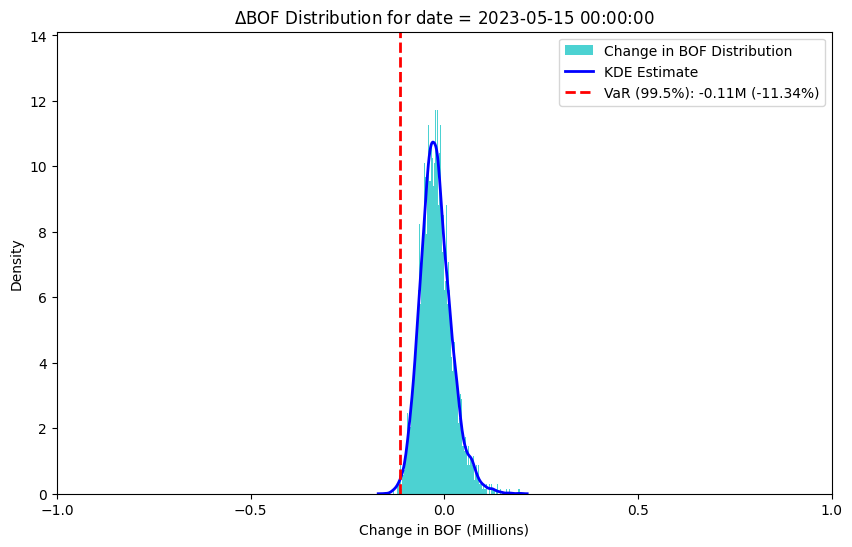

Processing Dates:  69%|██████▉   | 850/1232 [1:53:51<57:59,  9.11s/dates]

scr = -113419.47467492243


Processing Dates:  69%|██████▉   | 851/1232 [1:54:00<57:31,  9.06s/dates]

scr = -109030.92571566996


Processing Dates:  69%|██████▉   | 852/1232 [1:54:09<57:07,  9.02s/dates]

scr = -112936.32016339172


Processing Dates:  69%|██████▉   | 853/1232 [1:54:18<57:02,  9.03s/dates]

scr = -111045.70808829709


Processing Dates:  69%|██████▉   | 854/1232 [1:54:27<56:43,  9.00s/dates]

scr = -114579.25338822218


Processing Dates:  69%|██████▉   | 855/1232 [1:54:35<56:23,  8.97s/dates]

scr = -112990.46207033438


Processing Dates:  69%|██████▉   | 856/1232 [1:54:44<55:57,  8.93s/dates]

scr = -112294.50328559596


Processing Dates:  70%|██████▉   | 857/1232 [1:54:53<55:50,  8.93s/dates]

scr = -112379.06257334304


Processing Dates:  70%|██████▉   | 858/1232 [1:55:02<55:38,  8.93s/dates]

scr = -111772.33325767524


Processing Dates:  70%|██████▉   | 859/1232 [1:55:11<55:20,  8.90s/dates]

scr = -111076.10902248652


Processing Dates:  70%|██████▉   | 860/1232 [1:55:20<55:26,  8.94s/dates]

scr = -112478.83441690182


Processing Dates:  70%|██████▉   | 861/1232 [1:55:29<55:21,  8.95s/dates]

scr = -109976.3125728879


Processing Dates:  70%|██████▉   | 862/1232 [1:55:38<55:05,  8.93s/dates]

scr = -109400.61982625675


Processing Dates:  70%|███████   | 863/1232 [1:55:47<54:46,  8.91s/dates]

scr = -113085.2640803038


Processing Dates:  70%|███████   | 864/1232 [1:55:56<54:38,  8.91s/dates]

scr = -112013.6103140804


Processing Dates:  70%|███████   | 865/1232 [1:56:05<54:31,  8.91s/dates]

scr = -114580.18297590525


Processing Dates:  70%|███████   | 866/1232 [1:56:14<54:34,  8.95s/dates]

scr = -112107.86991209567


Processing Dates:  70%|███████   | 867/1232 [1:56:22<54:17,  8.92s/dates]

scr = -111474.90699493942


Processing Dates:  70%|███████   | 868/1232 [1:56:31<54:07,  8.92s/dates]

scr = -112398.82416908802


Processing Dates:  71%|███████   | 869/1232 [1:56:40<54:00,  8.93s/dates]

scr = -111201.149789644


Processing Dates:  71%|███████   | 870/1232 [1:56:49<53:49,  8.92s/dates]

scr = -112100.09860463002


Processing Dates:  71%|███████   | 871/1232 [1:56:58<53:35,  8.91s/dates]

scr = -111152.72347300938


Processing Dates:  71%|███████   | 872/1232 [1:57:07<53:37,  8.94s/dates]

scr = -113657.8948757335


Processing Dates:  71%|███████   | 873/1232 [1:57:16<53:32,  8.95s/dates]

scr = -112616.97687938424


Processing Dates:  71%|███████   | 874/1232 [1:57:25<53:29,  8.96s/dates]

scr = -113439.57174200873


Processing Dates:  71%|███████   | 875/1232 [1:57:34<53:15,  8.95s/dates]

scr = -115544.16167461389


Processing Dates:  71%|███████   | 876/1232 [1:57:43<53:02,  8.94s/dates]

scr = -113842.49841233941


Processing Dates:  71%|███████   | 877/1232 [1:57:52<52:58,  8.95s/dates]

scr = -113774.13027824672


Processing Dates:  71%|███████▏  | 878/1232 [1:58:01<52:41,  8.93s/dates]

scr = -111748.84249367574


Processing Dates:  71%|███████▏  | 879/1232 [1:58:10<52:30,  8.92s/dates]

scr = -111022.81280470168


Processing Dates:  71%|███████▏  | 880/1232 [1:58:19<52:26,  8.94s/dates]

scr = -114138.65395939135


Processing Dates:  72%|███████▏  | 881/1232 [1:58:28<52:20,  8.95s/dates]

scr = -112476.88817429412


Processing Dates:  72%|███████▏  | 882/1232 [1:58:37<52:20,  8.97s/dates]

scr = -109629.40685293749


Processing Dates:  72%|███████▏  | 883/1232 [1:58:46<52:10,  8.97s/dates]

scr = -112721.96596233365


Processing Dates:  72%|███████▏  | 884/1232 [1:58:54<51:55,  8.95s/dates]

scr = -109264.65475643697


Processing Dates:  72%|███████▏  | 885/1232 [1:59:03<51:50,  8.96s/dates]

scr = -112545.56060132165


Processing Dates:  72%|███████▏  | 886/1232 [1:59:12<51:34,  8.94s/dates]

scr = -111566.82893118722


Processing Dates:  72%|███████▏  | 887/1232 [1:59:21<51:25,  8.94s/dates]

scr = -112127.66398905618


Processing Dates:  72%|███████▏  | 888/1232 [1:59:30<51:12,  8.93s/dates]

scr = -112241.90416925981


Processing Dates:  72%|███████▏  | 889/1232 [1:59:39<51:18,  8.98s/dates]

scr = -111955.85369443624


Processing Dates:  72%|███████▏  | 890/1232 [1:59:48<51:08,  8.97s/dates]

scr = -112778.32307251252


Processing Dates:  72%|███████▏  | 891/1232 [1:59:57<51:02,  8.98s/dates]

scr = -111317.38666963032


Processing Dates:  72%|███████▏  | 892/1232 [2:00:06<50:53,  8.98s/dates]

scr = -112789.55443623409


Processing Dates:  72%|███████▏  | 893/1232 [2:00:15<50:59,  9.02s/dates]

scr = -112391.20568938115


Processing Dates:  73%|███████▎  | 894/1232 [2:00:24<50:43,  9.00s/dates]

scr = -111302.96186170304


Processing Dates:  73%|███████▎  | 895/1232 [2:00:33<50:29,  8.99s/dates]

scr = -113407.78168795446


Processing Dates:  73%|███████▎  | 896/1232 [2:00:42<50:15,  8.98s/dates]

scr = -111998.56970945079


Processing Dates:  73%|███████▎  | 897/1232 [2:00:51<50:11,  8.99s/dates]

scr = -113282.79467389797


Processing Dates:  73%|███████▎  | 898/1232 [2:01:00<50:01,  8.99s/dates]

scr = -111919.23946169982


Processing Dates:  73%|███████▎  | 899/1232 [2:01:09<49:58,  9.00s/dates]

scr = -112661.59582691743


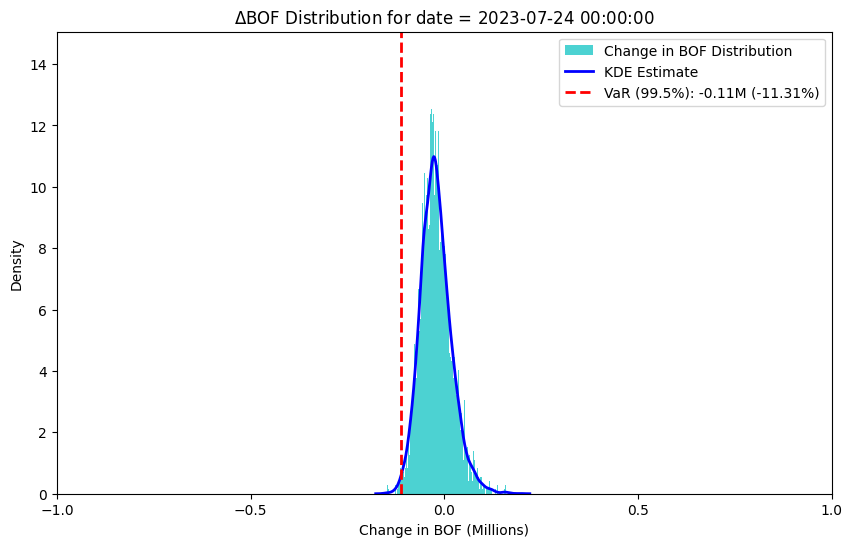

Processing Dates:  73%|███████▎  | 900/1232 [2:01:19<50:49,  9.19s/dates]

scr = -113101.91450254443


Processing Dates:  73%|███████▎  | 901/1232 [2:01:28<50:16,  9.11s/dates]

scr = -111457.0887298747


Processing Dates:  73%|███████▎  | 902/1232 [2:01:37<49:58,  9.09s/dates]

scr = -110918.63693593712


Processing Dates:  73%|███████▎  | 903/1232 [2:01:46<49:46,  9.08s/dates]

scr = -112283.55272464201


Processing Dates:  73%|███████▎  | 904/1232 [2:01:55<49:40,  9.09s/dates]

scr = -109854.74035180773


Processing Dates:  73%|███████▎  | 905/1232 [2:02:04<49:17,  9.04s/dates]

scr = -110536.916223218


Processing Dates:  74%|███████▎  | 906/1232 [2:02:13<49:01,  9.02s/dates]

scr = -111181.20949925011


Processing Dates:  74%|███████▎  | 907/1232 [2:02:22<48:46,  9.00s/dates]

scr = -112696.092225884


Processing Dates:  74%|███████▎  | 908/1232 [2:02:31<48:49,  9.04s/dates]

scr = -112340.8426237378


Processing Dates:  74%|███████▍  | 909/1232 [2:02:40<48:29,  9.01s/dates]

scr = -107517.25238478523


Processing Dates:  74%|███████▍  | 910/1232 [2:02:49<48:13,  8.99s/dates]

scr = -109569.6179684584


Processing Dates:  74%|███████▍  | 911/1232 [2:02:58<48:03,  8.98s/dates]

scr = -111502.18308253141


Processing Dates:  74%|███████▍  | 912/1232 [2:03:07<48:06,  9.02s/dates]

scr = -114139.02717112948


Processing Dates:  74%|███████▍  | 913/1232 [2:03:16<47:56,  9.02s/dates]

scr = -111009.04743831625


Processing Dates:  74%|███████▍  | 914/1232 [2:03:25<47:48,  9.02s/dates]

scr = -110702.81240510661


Processing Dates:  74%|███████▍  | 915/1232 [2:03:34<47:39,  9.02s/dates]

scr = -110945.30825645725


Processing Dates:  74%|███████▍  | 916/1232 [2:03:43<47:42,  9.06s/dates]

scr = -112916.9198390797


Processing Dates:  74%|███████▍  | 917/1232 [2:03:52<47:50,  9.11s/dates]

scr = -111647.79456660949


Processing Dates:  75%|███████▍  | 918/1232 [2:04:01<47:30,  9.08s/dates]

scr = -113299.35808901109


Processing Dates:  75%|███████▍  | 919/1232 [2:04:11<47:21,  9.08s/dates]

scr = -111368.74455807002


Processing Dates:  75%|███████▍  | 920/1232 [2:04:20<47:14,  9.09s/dates]

scr = -110383.53797946118


Processing Dates:  75%|███████▍  | 921/1232 [2:04:29<47:00,  9.07s/dates]

scr = -112893.74998801095


Processing Dates:  75%|███████▍  | 922/1232 [2:04:38<46:40,  9.03s/dates]

scr = -110936.68421664929


Processing Dates:  75%|███████▍  | 923/1232 [2:04:47<46:31,  9.03s/dates]

scr = -113180.54264177053


Processing Dates:  75%|███████▌  | 924/1232 [2:04:56<46:24,  9.04s/dates]

scr = -111246.34508071079


Processing Dates:  75%|███████▌  | 925/1232 [2:05:05<46:21,  9.06s/dates]

scr = -111234.08585711071


Processing Dates:  75%|███████▌  | 926/1232 [2:05:14<46:08,  9.05s/dates]

scr = -110580.36615964075


Processing Dates:  75%|███████▌  | 927/1232 [2:05:23<46:06,  9.07s/dates]

scr = -111800.71579054696


Processing Dates:  75%|███████▌  | 928/1232 [2:05:32<45:56,  9.07s/dates]

scr = -111430.40355176109


Processing Dates:  75%|███████▌  | 929/1232 [2:05:41<45:45,  9.06s/dates]

scr = -110872.66841392235


Processing Dates:  75%|███████▌  | 930/1232 [2:05:50<45:31,  9.04s/dates]

scr = -112552.18780400683


Processing Dates:  76%|███████▌  | 931/1232 [2:05:59<45:22,  9.04s/dates]

scr = -113501.52789363045


Processing Dates:  76%|███████▌  | 932/1232 [2:06:08<45:13,  9.05s/dates]

scr = -110555.5716275134


Processing Dates:  76%|███████▌  | 933/1232 [2:06:17<45:06,  9.05s/dates]

scr = -110813.21968079702


Processing Dates:  76%|███████▌  | 934/1232 [2:06:27<45:51,  9.23s/dates]

scr = -111253.03165544788


Processing Dates:  76%|███████▌  | 935/1232 [2:06:36<45:39,  9.22s/dates]

scr = -113096.40304224823


Processing Dates:  76%|███████▌  | 936/1232 [2:06:45<45:33,  9.23s/dates]

scr = -109677.78406092507


Processing Dates:  76%|███████▌  | 937/1232 [2:06:54<45:14,  9.20s/dates]

scr = -110220.16778344555


Processing Dates:  76%|███████▌  | 938/1232 [2:07:04<45:04,  9.20s/dates]

scr = -111053.18028147836


Processing Dates:  76%|███████▌  | 939/1232 [2:07:13<44:51,  9.19s/dates]

scr = -110251.7947761835


Processing Dates:  76%|███████▋  | 940/1232 [2:07:22<44:50,  9.21s/dates]

scr = -112249.37038131982


Processing Dates:  76%|███████▋  | 941/1232 [2:07:31<44:32,  9.18s/dates]

scr = -111290.80336867194


Processing Dates:  76%|███████▋  | 942/1232 [2:07:40<44:22,  9.18s/dates]

scr = -111925.33541453499


Processing Dates:  77%|███████▋  | 943/1232 [2:07:49<44:06,  9.16s/dates]

scr = -111043.41113797316


Processing Dates:  77%|███████▋  | 944/1232 [2:07:59<43:54,  9.15s/dates]

scr = -111198.68328358786


Processing Dates:  77%|███████▋  | 945/1232 [2:08:08<43:45,  9.15s/dates]

scr = -113000.94669537406


Processing Dates:  77%|███████▋  | 946/1232 [2:08:17<43:39,  9.16s/dates]

scr = -113589.97837258196


Processing Dates:  77%|███████▋  | 947/1232 [2:08:26<43:29,  9.16s/dates]

scr = -111183.34357759207


Processing Dates:  77%|███████▋  | 948/1232 [2:08:35<43:30,  9.19s/dates]

scr = -112990.82440384725


Processing Dates:  77%|███████▋  | 949/1232 [2:08:44<43:08,  9.15s/dates]

scr = -109842.00053137635


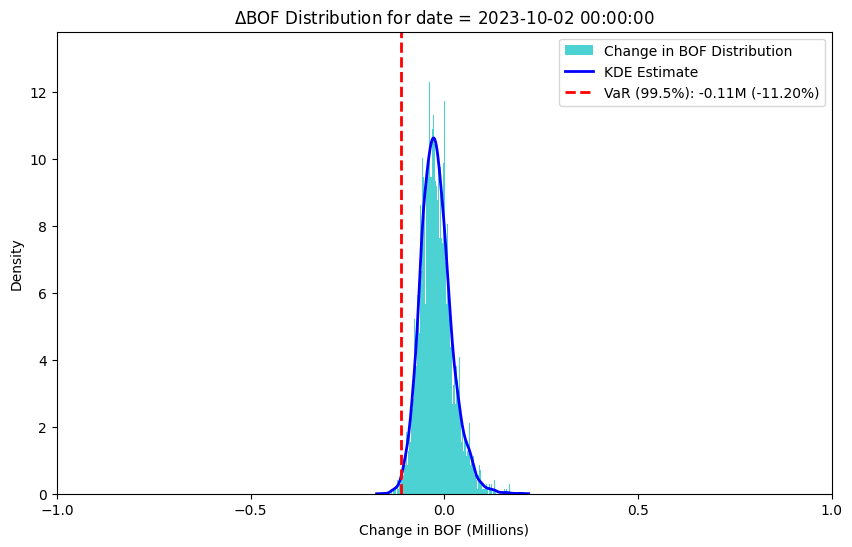

Processing Dates:  77%|███████▋  | 950/1232 [2:08:54<43:50,  9.33s/dates]

scr = -111974.09941546575


Processing Dates:  77%|███████▋  | 951/1232 [2:09:03<43:17,  9.24s/dates]

scr = -111136.95591865265


Processing Dates:  77%|███████▋  | 952/1232 [2:09:12<43:04,  9.23s/dates]

scr = -115676.97277864997


Processing Dates:  77%|███████▋  | 953/1232 [2:09:22<42:51,  9.22s/dates]

scr = -113346.36074686596


Processing Dates:  77%|███████▋  | 954/1232 [2:09:31<42:43,  9.22s/dates]

scr = -112482.21552766247


Processing Dates:  78%|███████▊  | 955/1232 [2:09:40<42:30,  9.21s/dates]

scr = -112769.17397444593


Processing Dates:  78%|███████▊  | 956/1232 [2:09:49<42:13,  9.18s/dates]

scr = -111850.88389905657


Processing Dates:  78%|███████▊  | 957/1232 [2:09:58<41:56,  9.15s/dates]

scr = -112918.02658147815


Processing Dates:  78%|███████▊  | 958/1232 [2:10:07<41:52,  9.17s/dates]

scr = -112770.94444320949


Processing Dates:  78%|███████▊  | 959/1232 [2:10:17<41:42,  9.17s/dates]

scr = -111246.06356492733


Processing Dates:  78%|███████▊  | 960/1232 [2:10:26<41:32,  9.16s/dates]

scr = -110249.9653200203


Processing Dates:  78%|███████▊  | 961/1232 [2:10:35<41:37,  9.22s/dates]

scr = -111177.31995920988


Processing Dates:  78%|███████▊  | 962/1232 [2:10:44<41:20,  9.19s/dates]

scr = -110664.4277838735


Processing Dates:  78%|███████▊  | 963/1232 [2:10:53<40:59,  9.14s/dates]

scr = -114016.65461810242


Processing Dates:  78%|███████▊  | 964/1232 [2:11:02<40:50,  9.14s/dates]

scr = -110937.75385112486


Processing Dates:  78%|███████▊  | 965/1232 [2:11:11<40:39,  9.14s/dates]

scr = -111208.54042201447


Processing Dates:  78%|███████▊  | 966/1232 [2:11:21<40:41,  9.18s/dates]

scr = -110973.36195855275


Processing Dates:  78%|███████▊  | 967/1232 [2:11:30<40:34,  9.19s/dates]

scr = -114038.11758223118


Processing Dates:  79%|███████▊  | 968/1232 [2:11:39<40:33,  9.22s/dates]

scr = -111020.92155706676


Processing Dates:  79%|███████▊  | 969/1232 [2:11:48<40:26,  9.23s/dates]

scr = -113622.60387144095


Processing Dates:  79%|███████▊  | 970/1232 [2:11:58<40:22,  9.25s/dates]

scr = -110449.64119918547


Processing Dates:  79%|███████▉  | 971/1232 [2:12:07<40:02,  9.21s/dates]

scr = -110860.4411306164


Processing Dates:  79%|███████▉  | 972/1232 [2:12:16<40:01,  9.24s/dates]

scr = -112641.04582484374


Processing Dates:  79%|███████▉  | 973/1232 [2:12:26<40:04,  9.28s/dates]

scr = -109648.7270734405


Processing Dates:  79%|███████▉  | 974/1232 [2:12:35<39:58,  9.30s/dates]

scr = -109364.58483205526


Processing Dates:  79%|███████▉  | 975/1232 [2:12:44<39:43,  9.28s/dates]

scr = -112082.99665335794


Processing Dates:  79%|███████▉  | 976/1232 [2:12:53<39:27,  9.25s/dates]

scr = -113292.48367759156


Processing Dates:  79%|███████▉  | 977/1232 [2:13:03<39:27,  9.28s/dates]

scr = -111422.17776039403


Processing Dates:  79%|███████▉  | 978/1232 [2:13:12<39:18,  9.28s/dates]

scr = -111850.96720823826


Processing Dates:  79%|███████▉  | 979/1232 [2:13:21<39:07,  9.28s/dates]

scr = -111468.62686171396


Processing Dates:  80%|███████▉  | 980/1232 [2:13:30<38:56,  9.27s/dates]

scr = -111303.78765033987


Processing Dates:  80%|███████▉  | 981/1232 [2:13:40<38:50,  9.29s/dates]

scr = -114208.48228204185


Processing Dates:  80%|███████▉  | 982/1232 [2:13:49<38:44,  9.30s/dates]

scr = -110267.90955842698


Processing Dates:  80%|███████▉  | 983/1232 [2:13:58<38:35,  9.30s/dates]

scr = -111470.14976675026


Processing Dates:  80%|███████▉  | 984/1232 [2:14:08<38:20,  9.28s/dates]

scr = -111345.24199804847


Processing Dates:  80%|███████▉  | 985/1232 [2:14:17<38:23,  9.33s/dates]

scr = -113336.04022031238


Processing Dates:  80%|████████  | 986/1232 [2:14:26<38:18,  9.34s/dates]

scr = -110369.43201161792


Processing Dates:  80%|████████  | 987/1232 [2:14:36<38:07,  9.34s/dates]

scr = -112232.6174021884


Processing Dates:  80%|████████  | 988/1232 [2:14:45<37:49,  9.30s/dates]

scr = -112451.6550795173


Processing Dates:  80%|████████  | 989/1232 [2:14:54<37:49,  9.34s/dates]

scr = -109493.50017474033


Processing Dates:  80%|████████  | 990/1232 [2:15:04<37:40,  9.34s/dates]

scr = -111398.06423805509


Processing Dates:  80%|████████  | 991/1232 [2:15:13<37:27,  9.33s/dates]

scr = -114805.15377059391


Processing Dates:  81%|████████  | 992/1232 [2:15:22<37:23,  9.35s/dates]

scr = -111684.47701642175


Processing Dates:  81%|████████  | 993/1232 [2:15:32<37:02,  9.30s/dates]

scr = -113390.33281924386


Processing Dates:  81%|████████  | 994/1232 [2:15:41<36:52,  9.29s/dates]

scr = -112982.00767338615


Processing Dates:  81%|████████  | 995/1232 [2:15:50<36:40,  9.28s/dates]

scr = -115552.29455293104


Processing Dates:  81%|████████  | 996/1232 [2:16:00<36:38,  9.32s/dates]

scr = -111739.95733128408


Processing Dates:  81%|████████  | 997/1232 [2:16:09<36:27,  9.31s/dates]

scr = -112965.80797632219


Processing Dates:  81%|████████  | 998/1232 [2:16:18<36:12,  9.28s/dates]

scr = -109582.59916968744


Processing Dates:  81%|████████  | 999/1232 [2:16:27<36:05,  9.29s/dates]

scr = -112145.3248181698


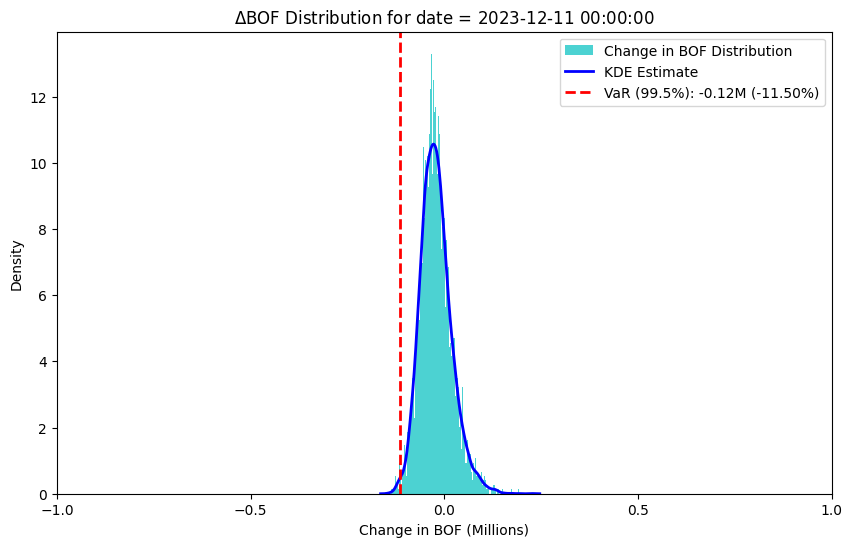

Processing Dates:  81%|████████  | 1000/1232 [2:16:37<36:44,  9.50s/dates]

scr = -115034.0683670208


Processing Dates:  81%|████████▏ | 1001/1232 [2:16:47<36:29,  9.48s/dates]

scr = -110747.60376556392


Processing Dates:  81%|████████▏ | 1002/1232 [2:16:56<36:11,  9.44s/dates]

scr = -114133.91045646394


Processing Dates:  81%|████████▏ | 1003/1232 [2:17:06<35:59,  9.43s/dates]

scr = -108842.31302428646


Processing Dates:  81%|████████▏ | 1004/1232 [2:17:15<35:39,  9.38s/dates]

scr = -111915.148602344


Processing Dates:  82%|████████▏ | 1005/1232 [2:17:24<35:15,  9.32s/dates]

scr = -113477.14235116965


Processing Dates:  82%|████████▏ | 1006/1232 [2:17:33<35:13,  9.35s/dates]

scr = -111168.70440271644


Processing Dates:  82%|████████▏ | 1007/1232 [2:17:43<34:57,  9.32s/dates]

scr = -110043.24499264311


Processing Dates:  82%|████████▏ | 1008/1232 [2:17:52<34:45,  9.31s/dates]

scr = -111141.69390570228


Processing Dates:  82%|████████▏ | 1009/1232 [2:18:01<34:36,  9.31s/dates]

scr = -113720.54038744251


Processing Dates:  82%|████████▏ | 1010/1232 [2:18:11<34:36,  9.35s/dates]

scr = -112093.5040722056


Processing Dates:  82%|████████▏ | 1011/1232 [2:18:20<34:23,  9.34s/dates]

scr = -111086.56912732258


Processing Dates:  82%|████████▏ | 1012/1232 [2:18:30<34:25,  9.39s/dates]

scr = -113198.98409833363


Processing Dates:  82%|████████▏ | 1013/1232 [2:18:39<34:41,  9.50s/dates]

scr = -114154.74647342142


Processing Dates:  82%|████████▏ | 1014/1232 [2:18:49<34:37,  9.53s/dates]

scr = -111328.15981077471


Processing Dates:  82%|████████▏ | 1015/1232 [2:18:58<34:22,  9.51s/dates]

scr = -112626.80554171419


Processing Dates:  82%|████████▏ | 1016/1232 [2:19:08<34:13,  9.51s/dates]

scr = -113109.22208273469


Processing Dates:  83%|████████▎ | 1017/1232 [2:19:17<33:58,  9.48s/dates]

scr = -111079.1237684277


Processing Dates:  83%|████████▎ | 1018/1232 [2:19:27<33:51,  9.50s/dates]

scr = -113507.7659267697


Processing Dates:  83%|████████▎ | 1019/1232 [2:19:36<33:30,  9.44s/dates]

scr = -113076.91747012553


Processing Dates:  83%|████████▎ | 1020/1232 [2:19:46<33:28,  9.48s/dates]

scr = -112785.61723153802


Processing Dates:  83%|████████▎ | 1021/1232 [2:19:55<33:27,  9.52s/dates]

scr = -112387.84911458155


Processing Dates:  83%|████████▎ | 1022/1232 [2:20:05<33:22,  9.53s/dates]

scr = -113737.63426589688


Processing Dates:  83%|████████▎ | 1023/1232 [2:20:14<33:12,  9.53s/dates]

scr = -112962.19325386049


Processing Dates:  83%|████████▎ | 1024/1232 [2:20:24<33:07,  9.56s/dates]

scr = -112264.75805935996


Processing Dates:  83%|████████▎ | 1025/1232 [2:20:34<33:01,  9.57s/dates]

scr = -112718.59831887926


Processing Dates:  83%|████████▎ | 1026/1232 [2:20:43<32:56,  9.59s/dates]

scr = -111811.5167739269


Processing Dates:  83%|████████▎ | 1027/1232 [2:20:53<32:36,  9.54s/dates]

scr = -114615.85099744258


Processing Dates:  83%|████████▎ | 1028/1232 [2:21:02<32:20,  9.51s/dates]

scr = -113168.39935494009


Processing Dates:  84%|████████▎ | 1029/1232 [2:21:12<32:22,  9.57s/dates]

scr = -113884.90538174224


Processing Dates:  84%|████████▎ | 1030/1232 [2:21:21<31:58,  9.50s/dates]

scr = -114782.9694403321


Processing Dates:  84%|████████▎ | 1031/1232 [2:21:31<31:42,  9.46s/dates]

scr = -111188.7295920072


Processing Dates:  84%|████████▍ | 1032/1232 [2:21:40<31:39,  9.50s/dates]

scr = -112140.70400626853


Processing Dates:  84%|████████▍ | 1033/1232 [2:21:50<31:40,  9.55s/dates]

scr = -111735.82411782675


Processing Dates:  84%|████████▍ | 1034/1232 [2:21:59<31:14,  9.47s/dates]

scr = -112067.6907897349


Processing Dates:  84%|████████▍ | 1035/1232 [2:22:08<30:57,  9.43s/dates]

scr = -111885.40027887351


Processing Dates:  84%|████████▍ | 1036/1232 [2:22:18<30:44,  9.41s/dates]

scr = -110388.45758086885


Processing Dates:  84%|████████▍ | 1037/1232 [2:22:27<30:26,  9.37s/dates]

scr = -116008.97647629607


Processing Dates:  84%|████████▍ | 1038/1232 [2:22:36<30:15,  9.36s/dates]

scr = -110947.46237229208


Processing Dates:  84%|████████▍ | 1039/1232 [2:22:46<29:59,  9.32s/dates]

scr = -112292.45134441923


Processing Dates:  84%|████████▍ | 1040/1232 [2:22:55<29:51,  9.33s/dates]

scr = -110872.49473448623


Processing Dates:  84%|████████▍ | 1041/1232 [2:23:04<29:41,  9.33s/dates]

scr = -108973.27294889177


Processing Dates:  85%|████████▍ | 1042/1232 [2:23:14<29:32,  9.33s/dates]

scr = -113985.60453433183


Processing Dates:  85%|████████▍ | 1043/1232 [2:23:23<29:24,  9.34s/dates]

scr = -112143.13552422925


Processing Dates:  85%|████████▍ | 1044/1232 [2:23:32<29:09,  9.31s/dates]

scr = -112296.93551327303


Processing Dates:  85%|████████▍ | 1045/1232 [2:23:42<28:56,  9.29s/dates]

scr = -107310.95677193222


Processing Dates:  85%|████████▍ | 1046/1232 [2:23:51<28:50,  9.30s/dates]

scr = -115847.11110663824


Processing Dates:  85%|████████▍ | 1047/1232 [2:24:00<28:44,  9.32s/dates]

scr = -110996.08620506297


Processing Dates:  85%|████████▌ | 1048/1232 [2:24:10<28:34,  9.32s/dates]

scr = -111731.07091445108


Processing Dates:  85%|████████▌ | 1049/1232 [2:24:19<28:22,  9.31s/dates]

scr = -111260.57773641028


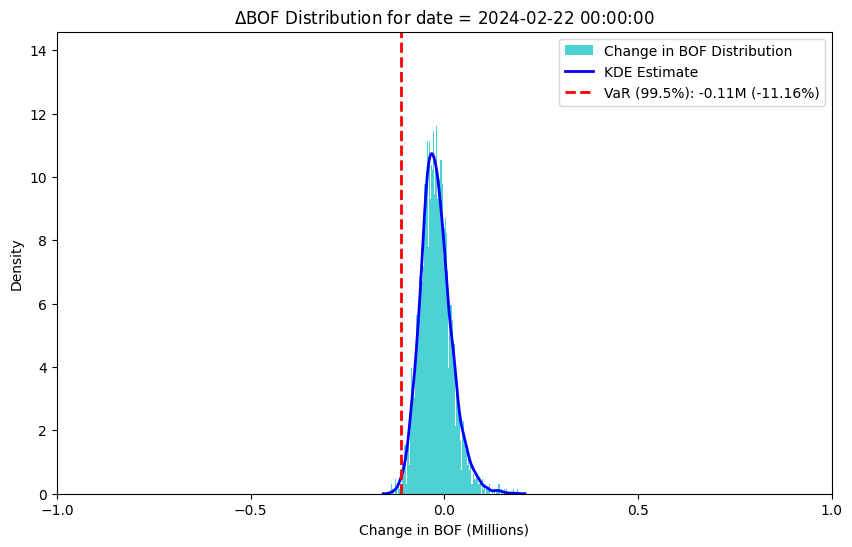

Processing Dates:  85%|████████▌ | 1050/1232 [2:24:29<28:52,  9.52s/dates]

scr = -111602.27198962886


Processing Dates:  85%|████████▌ | 1051/1232 [2:24:38<28:33,  9.46s/dates]

scr = -113106.31199327459


Processing Dates:  85%|████████▌ | 1052/1232 [2:24:47<28:16,  9.43s/dates]

scr = -108961.99062180109


Processing Dates:  85%|████████▌ | 1053/1232 [2:24:57<28:09,  9.44s/dates]

scr = -113912.18985610148


Processing Dates:  86%|████████▌ | 1054/1232 [2:25:06<27:50,  9.38s/dates]

scr = -109871.1308379037


Processing Dates:  86%|████████▌ | 1055/1232 [2:25:16<27:37,  9.37s/dates]

scr = -112655.43426079341


Processing Dates:  86%|████████▌ | 1056/1232 [2:25:25<27:31,  9.38s/dates]

scr = -111634.82498445232


Processing Dates:  86%|████████▌ | 1057/1232 [2:25:34<27:13,  9.34s/dates]

scr = -112604.28818671353


Processing Dates:  86%|████████▌ | 1058/1232 [2:25:43<27:02,  9.32s/dates]

scr = -114524.70332440236


Processing Dates:  86%|████████▌ | 1059/1232 [2:25:53<26:53,  9.33s/dates]

scr = -108022.67426212586


Processing Dates:  86%|████████▌ | 1060/1232 [2:26:02<26:47,  9.35s/dates]

scr = -106577.02228998463


Processing Dates:  86%|████████▌ | 1061/1232 [2:26:12<26:36,  9.34s/dates]

scr = -106856.32402803958


Processing Dates:  86%|████████▌ | 1062/1232 [2:26:21<26:25,  9.33s/dates]

scr = -107854.30078430448


Processing Dates:  86%|████████▋ | 1063/1232 [2:26:30<26:20,  9.35s/dates]

scr = -105773.11623206547


Processing Dates:  86%|████████▋ | 1064/1232 [2:26:40<26:10,  9.35s/dates]

scr = -105982.43995406828


Processing Dates:  86%|████████▋ | 1065/1232 [2:26:49<25:59,  9.34s/dates]

scr = -108267.22775315958


Processing Dates:  87%|████████▋ | 1066/1232 [2:26:58<25:55,  9.37s/dates]

scr = -110724.07442657191


Processing Dates:  87%|████████▋ | 1067/1232 [2:27:08<25:41,  9.34s/dates]

scr = -111248.8301814052


Processing Dates:  87%|████████▋ | 1068/1232 [2:27:17<25:32,  9.34s/dates]

scr = -113272.78505159379


Processing Dates:  87%|████████▋ | 1069/1232 [2:27:26<25:23,  9.34s/dates]

scr = -112877.85634637838


Processing Dates:  87%|████████▋ | 1070/1232 [2:27:36<25:15,  9.36s/dates]

scr = -111609.21940294265


Processing Dates:  87%|████████▋ | 1071/1232 [2:27:45<25:06,  9.36s/dates]

scr = -112170.19748147418


Processing Dates:  87%|████████▋ | 1072/1232 [2:27:54<25:00,  9.38s/dates]

scr = -113328.86853084568


Processing Dates:  87%|████████▋ | 1073/1232 [2:28:04<24:55,  9.40s/dates]

scr = -112998.64262711395


Processing Dates:  87%|████████▋ | 1074/1232 [2:28:13<24:41,  9.38s/dates]

scr = -116096.05343774532


Processing Dates:  87%|████████▋ | 1075/1232 [2:28:23<24:27,  9.35s/dates]

scr = -114507.04248021808


Processing Dates:  87%|████████▋ | 1076/1232 [2:28:32<24:16,  9.34s/dates]

scr = -113613.86417664126


Processing Dates:  87%|████████▋ | 1077/1232 [2:28:41<24:10,  9.35s/dates]

scr = -111297.34976812633


Processing Dates:  88%|████████▊ | 1078/1232 [2:28:51<24:01,  9.36s/dates]

scr = -113213.95993816109


Processing Dates:  88%|████████▊ | 1079/1232 [2:29:00<23:52,  9.37s/dates]

scr = -110904.60693934855


Processing Dates:  88%|████████▊ | 1080/1232 [2:29:09<23:46,  9.38s/dates]

scr = -113089.38780787883


Processing Dates:  88%|████████▊ | 1081/1232 [2:29:19<23:43,  9.43s/dates]

scr = -116455.39537520005


Processing Dates:  88%|████████▊ | 1082/1232 [2:29:28<23:32,  9.42s/dates]

scr = -112709.32992355616


Processing Dates:  88%|████████▊ | 1083/1232 [2:29:38<23:21,  9.41s/dates]

scr = -114305.5635700853


Processing Dates:  88%|████████▊ | 1084/1232 [2:29:47<23:15,  9.43s/dates]

scr = -115824.45888706214


Processing Dates:  88%|████████▊ | 1085/1232 [2:29:57<23:04,  9.42s/dates]

scr = -112792.64882270811


Processing Dates:  88%|████████▊ | 1086/1232 [2:30:06<22:53,  9.41s/dates]

scr = -112874.54086058479


Processing Dates:  88%|████████▊ | 1087/1232 [2:30:15<22:48,  9.44s/dates]

scr = -113706.79703841335


Processing Dates:  88%|████████▊ | 1088/1232 [2:30:25<22:37,  9.42s/dates]

scr = -110229.91042644776


Processing Dates:  88%|████████▊ | 1089/1232 [2:30:34<22:24,  9.40s/dates]

scr = -111995.89801082604


Processing Dates:  88%|████████▊ | 1090/1232 [2:30:44<22:14,  9.40s/dates]

scr = -114584.79319079795


Processing Dates:  89%|████████▊ | 1091/1232 [2:30:53<22:04,  9.39s/dates]

scr = -112743.22286140434


Processing Dates:  89%|████████▊ | 1092/1232 [2:31:02<21:53,  9.38s/dates]

scr = -112772.62088453847


Processing Dates:  89%|████████▊ | 1093/1232 [2:31:12<21:45,  9.39s/dates]

scr = -113533.52504100258


Processing Dates:  89%|████████▉ | 1094/1232 [2:31:21<21:37,  9.40s/dates]

scr = -110069.45757884716


Processing Dates:  89%|████████▉ | 1095/1232 [2:31:31<21:26,  9.39s/dates]

scr = -113310.16158896308


Processing Dates:  89%|████████▉ | 1096/1232 [2:31:40<21:15,  9.38s/dates]

scr = -112089.1867501912


Processing Dates:  89%|████████▉ | 1097/1232 [2:31:49<21:09,  9.41s/dates]

scr = -113393.96041100359


Processing Dates:  89%|████████▉ | 1098/1232 [2:31:59<21:00,  9.41s/dates]

scr = -111680.57794612329


Processing Dates:  89%|████████▉ | 1099/1232 [2:32:08<20:49,  9.39s/dates]

scr = -110841.26562300813


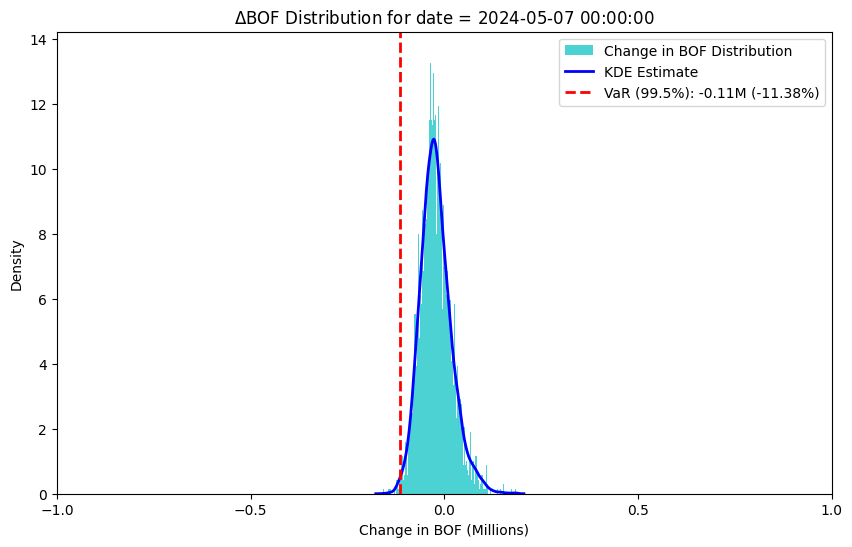

Processing Dates:  89%|████████▉ | 1100/1232 [2:32:18<21:07,  9.61s/dates]

scr = -113837.88464412418


Processing Dates:  89%|████████▉ | 1101/1232 [2:32:28<20:48,  9.53s/dates]

scr = -115642.93823772982


Processing Dates:  89%|████████▉ | 1102/1232 [2:32:37<20:37,  9.52s/dates]

scr = -112996.52792393281


Processing Dates:  90%|████████▉ | 1103/1232 [2:32:47<20:24,  9.49s/dates]

scr = -108705.48323595317


Processing Dates:  90%|████████▉ | 1104/1232 [2:32:56<20:13,  9.48s/dates]

scr = -113008.40946928573


Processing Dates:  90%|████████▉ | 1105/1232 [2:33:05<20:02,  9.47s/dates]

scr = -111123.25364083143


Processing Dates:  90%|████████▉ | 1106/1232 [2:33:15<19:54,  9.48s/dates]

scr = -112441.35358207968


Processing Dates:  90%|████████▉ | 1107/1232 [2:33:24<19:43,  9.47s/dates]

scr = -109427.41587227405


Processing Dates:  90%|████████▉ | 1108/1232 [2:33:34<19:31,  9.45s/dates]

scr = -110363.15383914126


Processing Dates:  90%|█████████ | 1109/1232 [2:33:43<19:22,  9.45s/dates]

scr = -109549.1139138059


Processing Dates:  90%|█████████ | 1110/1232 [2:33:53<19:13,  9.45s/dates]

scr = -111377.70053443634


Processing Dates:  90%|█████████ | 1111/1232 [2:34:02<19:00,  9.43s/dates]

scr = -112450.64311044682


Processing Dates:  90%|█████████ | 1112/1232 [2:34:12<18:52,  9.44s/dates]

scr = -114421.22020532885


Processing Dates:  90%|█████████ | 1113/1232 [2:34:21<18:44,  9.45s/dates]

scr = -112741.20430110929


Processing Dates:  90%|█████████ | 1114/1232 [2:34:30<18:34,  9.45s/dates]

scr = -111862.62111558371


Processing Dates:  91%|█████████ | 1115/1232 [2:34:40<18:26,  9.46s/dates]

scr = -111416.38192947384


Processing Dates:  91%|█████████ | 1116/1232 [2:34:49<18:15,  9.44s/dates]

scr = -111599.91292595181


Processing Dates:  91%|█████████ | 1117/1232 [2:34:59<18:08,  9.46s/dates]

scr = -109655.22604816985


Processing Dates:  91%|█████████ | 1118/1232 [2:35:08<17:57,  9.45s/dates]

scr = -111656.07653483788


Processing Dates:  91%|█████████ | 1119/1232 [2:35:18<17:50,  9.47s/dates]

scr = -111955.1475863347


Processing Dates:  91%|█████████ | 1120/1232 [2:35:27<17:43,  9.49s/dates]

scr = -114593.262210162


Processing Dates:  91%|█████████ | 1121/1232 [2:35:37<17:34,  9.50s/dates]

scr = -112159.55082755501


Processing Dates:  91%|█████████ | 1122/1232 [2:35:46<17:22,  9.48s/dates]

scr = -111914.12131713319


Processing Dates:  91%|█████████ | 1123/1232 [2:35:56<17:13,  9.48s/dates]

scr = -108894.40508711137


Processing Dates:  91%|█████████ | 1124/1232 [2:36:05<17:02,  9.46s/dates]

scr = -111467.44464590063


Processing Dates:  91%|█████████▏| 1125/1232 [2:36:15<16:53,  9.47s/dates]

scr = -111617.25696627473


Processing Dates:  91%|█████████▏| 1126/1232 [2:36:24<16:42,  9.46s/dates]

scr = -114963.77912633067


Processing Dates:  91%|█████████▏| 1127/1232 [2:36:34<16:35,  9.49s/dates]

scr = -112630.60124270854


Processing Dates:  92%|█████████▏| 1128/1232 [2:36:43<16:26,  9.48s/dates]

scr = -109393.70527100434


Processing Dates:  92%|█████████▏| 1129/1232 [2:36:53<16:14,  9.46s/dates]

scr = -114231.40680875494


Processing Dates:  92%|█████████▏| 1130/1232 [2:37:02<16:04,  9.46s/dates]

scr = -113375.84866087494


Processing Dates:  92%|█████████▏| 1131/1232 [2:37:11<15:56,  9.47s/dates]

scr = -115007.00096562796


Processing Dates:  92%|█████████▏| 1132/1232 [2:37:21<15:46,  9.46s/dates]

scr = -109740.01193325863


Processing Dates:  92%|█████████▏| 1133/1232 [2:37:30<15:37,  9.47s/dates]

scr = -112965.76657056529


Processing Dates:  92%|█████████▏| 1134/1232 [2:37:40<15:30,  9.49s/dates]

scr = -112699.09991689949


Processing Dates:  92%|█████████▏| 1135/1232 [2:37:49<15:20,  9.49s/dates]

scr = -112230.30223433363


Processing Dates:  92%|█████████▏| 1136/1232 [2:37:59<15:09,  9.47s/dates]

scr = -115315.06541657308


Processing Dates:  92%|█████████▏| 1137/1232 [2:38:08<15:03,  9.51s/dates]

scr = -111539.76092522213


Processing Dates:  92%|█████████▏| 1138/1232 [2:38:18<14:51,  9.49s/dates]

scr = -114470.34056523455


Processing Dates:  92%|█████████▏| 1139/1232 [2:38:27<14:41,  9.48s/dates]

scr = -111775.6526003047


Processing Dates:  93%|█████████▎| 1140/1232 [2:38:37<14:32,  9.49s/dates]

scr = -112834.51225318633


Processing Dates:  93%|█████████▎| 1141/1232 [2:38:46<14:22,  9.48s/dates]

scr = -110338.02119526993


Processing Dates:  93%|█████████▎| 1142/1232 [2:38:56<14:12,  9.47s/dates]

scr = -113059.34238812573


Processing Dates:  93%|█████████▎| 1143/1232 [2:39:05<14:04,  9.49s/dates]

scr = -110138.82285172047


Processing Dates:  93%|█████████▎| 1144/1232 [2:39:15<13:57,  9.52s/dates]

scr = -109213.15099475584


Processing Dates:  93%|█████████▎| 1145/1232 [2:39:24<13:47,  9.51s/dates]

scr = -113907.66675400056


Processing Dates:  93%|█████████▎| 1146/1232 [2:39:34<13:36,  9.50s/dates]

scr = -110097.02805919638


Processing Dates:  93%|█████████▎| 1147/1232 [2:39:43<13:30,  9.53s/dates]

scr = -111858.5648027393


Processing Dates:  93%|█████████▎| 1148/1232 [2:39:53<13:19,  9.52s/dates]

scr = -117028.14079307546


Processing Dates:  93%|█████████▎| 1149/1232 [2:40:02<13:08,  9.50s/dates]

scr = -116561.67011101311


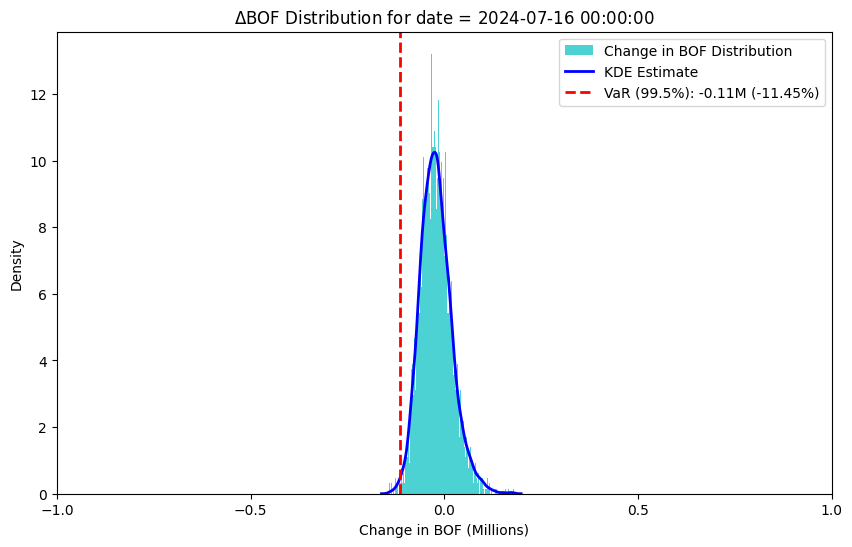

Processing Dates:  93%|█████████▎| 1150/1232 [2:40:13<13:17,  9.72s/dates]

scr = -114468.6422647503


Processing Dates:  93%|█████████▎| 1151/1232 [2:40:22<13:01,  9.65s/dates]

scr = -112088.96805003301


Processing Dates:  94%|█████████▎| 1152/1232 [2:40:32<12:51,  9.64s/dates]

scr = -113366.26030889511


Processing Dates:  94%|█████████▎| 1153/1232 [2:40:41<12:37,  9.59s/dates]

scr = -111099.49160481864


Processing Dates:  94%|█████████▎| 1154/1232 [2:40:51<12:24,  9.55s/dates]

scr = -115501.9596695328


Processing Dates:  94%|█████████▍| 1155/1232 [2:41:00<12:12,  9.52s/dates]

scr = -112726.94193132398


Processing Dates:  94%|█████████▍| 1156/1232 [2:41:10<12:07,  9.57s/dates]

scr = -112445.11516393113


Processing Dates:  94%|█████████▍| 1157/1232 [2:41:19<11:56,  9.55s/dates]

scr = -111456.08050645818


Processing Dates:  94%|█████████▍| 1158/1232 [2:41:29<11:46,  9.54s/dates]

scr = -113363.70245146884


Processing Dates:  94%|█████████▍| 1159/1232 [2:41:39<11:38,  9.57s/dates]

scr = -112998.43532265529


Processing Dates:  94%|█████████▍| 1160/1232 [2:41:48<11:26,  9.54s/dates]

scr = -110846.1374765832


Processing Dates:  94%|█████████▍| 1161/1232 [2:41:57<11:17,  9.54s/dates]

scr = -113942.00666316714


Processing Dates:  94%|█████████▍| 1162/1232 [2:42:07<11:09,  9.56s/dates]

scr = -112055.92618791308


Processing Dates:  94%|█████████▍| 1163/1232 [2:42:17<10:58,  9.55s/dates]

scr = -113660.23765318179


Processing Dates:  94%|█████████▍| 1164/1232 [2:42:26<10:49,  9.55s/dates]

scr = -111828.53552030823


Processing Dates:  95%|█████████▍| 1165/1232 [2:42:36<10:41,  9.58s/dates]

scr = -110417.59271532326


Processing Dates:  95%|█████████▍| 1166/1232 [2:42:45<10:30,  9.56s/dates]

scr = -108528.61139256874


Processing Dates:  95%|█████████▍| 1167/1232 [2:42:55<10:19,  9.53s/dates]

scr = -111950.35534898481


Processing Dates:  95%|█████████▍| 1168/1232 [2:43:04<10:10,  9.54s/dates]

scr = -110891.199347


Processing Dates:  95%|█████████▍| 1169/1232 [2:43:14<10:03,  9.57s/dates]

scr = -110499.32020935605


Processing Dates:  95%|█████████▍| 1170/1232 [2:43:24<09:52,  9.56s/dates]

scr = -113321.38953092037


Processing Dates:  95%|█████████▌| 1171/1232 [2:43:33<09:42,  9.56s/dates]

scr = -110135.78379083094


Processing Dates:  95%|█████████▌| 1172/1232 [2:43:43<09:33,  9.56s/dates]

scr = -114566.62971892762


Processing Dates:  95%|█████████▌| 1173/1232 [2:43:52<09:23,  9.56s/dates]

scr = -114199.32419763558


Processing Dates:  95%|█████████▌| 1174/1232 [2:44:02<09:14,  9.56s/dates]

scr = -110970.29510346004


Processing Dates:  95%|█████████▌| 1175/1232 [2:44:11<09:06,  9.58s/dates]

scr = -111901.76087678094


Processing Dates:  95%|█████████▌| 1176/1232 [2:44:21<08:56,  9.58s/dates]

scr = -112855.30772442147


Processing Dates:  96%|█████████▌| 1177/1232 [2:44:31<08:46,  9.58s/dates]

scr = -114733.31105835772


Processing Dates:  96%|█████████▌| 1178/1232 [2:44:40<08:36,  9.56s/dates]

scr = -111941.10754280369


Processing Dates:  96%|█████████▌| 1179/1232 [2:44:50<08:28,  9.59s/dates]

scr = -110678.83543094904


Processing Dates:  96%|█████████▌| 1180/1232 [2:44:59<08:17,  9.57s/dates]

scr = -111192.07788583748


Processing Dates:  96%|█████████▌| 1181/1232 [2:45:09<08:07,  9.56s/dates]

scr = -111496.82512197758


Processing Dates:  96%|█████████▌| 1182/1232 [2:45:18<07:59,  9.59s/dates]

scr = -111866.00879979267


Processing Dates:  96%|█████████▌| 1183/1232 [2:45:28<07:49,  9.58s/dates]

scr = -109904.91469949731


Processing Dates:  96%|█████████▌| 1184/1232 [2:45:37<07:38,  9.55s/dates]

scr = -108039.08278454913


Processing Dates:  96%|█████████▌| 1185/1232 [2:45:47<07:29,  9.57s/dates]

scr = -108563.95437236506


Processing Dates:  96%|█████████▋| 1186/1232 [2:45:57<07:19,  9.56s/dates]

scr = -108286.80686400007


Processing Dates:  96%|█████████▋| 1187/1232 [2:46:06<07:09,  9.54s/dates]

scr = -107061.59523666653


Processing Dates:  96%|█████████▋| 1188/1232 [2:46:16<07:00,  9.56s/dates]

scr = -104442.24981914237


Processing Dates:  97%|█████████▋| 1189/1232 [2:46:25<06:49,  9.53s/dates]

scr = -106771.86045124869


Processing Dates:  97%|█████████▋| 1190/1232 [2:46:35<06:40,  9.53s/dates]

scr = -102995.40788381855


Processing Dates:  97%|█████████▋| 1191/1232 [2:46:44<06:31,  9.55s/dates]

scr = -102360.84275875353


Processing Dates:  97%|█████████▋| 1192/1232 [2:46:54<06:22,  9.57s/dates]

scr = -102696.13122217446


Processing Dates:  97%|█████████▋| 1193/1232 [2:47:04<06:13,  9.57s/dates]

scr = -114074.93720757078


Processing Dates:  97%|█████████▋| 1194/1232 [2:47:13<06:03,  9.58s/dates]

scr = -111666.28246707919


Processing Dates:  97%|█████████▋| 1195/1232 [2:47:23<05:55,  9.61s/dates]

scr = -109636.60200564792


Processing Dates:  97%|█████████▋| 1196/1232 [2:47:32<05:45,  9.61s/dates]

scr = -113196.21659561429


Processing Dates:  97%|█████████▋| 1197/1232 [2:47:42<05:36,  9.62s/dates]

scr = -113300.8013498143


Processing Dates:  97%|█████████▋| 1198/1232 [2:47:52<05:27,  9.62s/dates]

scr = -112280.15858302251


Processing Dates:  97%|█████████▋| 1199/1232 [2:48:01<05:17,  9.61s/dates]

scr = -112276.50511165892


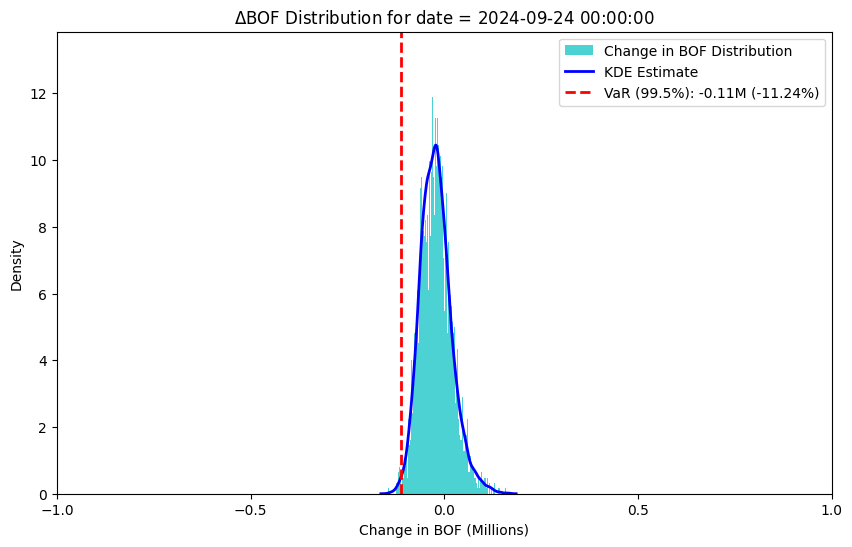

Processing Dates:  97%|█████████▋| 1200/1232 [2:48:12<05:14,  9.82s/dates]

scr = -112443.5966388539


Processing Dates:  97%|█████████▋| 1201/1232 [2:48:21<05:02,  9.77s/dates]

scr = -112301.76872259133


Processing Dates:  98%|█████████▊| 1202/1232 [2:48:31<04:51,  9.70s/dates]

scr = -113354.84346734999


Processing Dates:  98%|█████████▊| 1203/1232 [2:48:40<04:40,  9.68s/dates]

scr = -113324.59631165095


Processing Dates:  98%|█████████▊| 1204/1232 [2:48:50<04:32,  9.73s/dates]

scr = -111295.1506038775


Processing Dates:  98%|█████████▊| 1205/1232 [2:49:00<04:22,  9.71s/dates]

scr = -114083.49670807972


Processing Dates:  98%|█████████▊| 1206/1232 [2:49:10<04:11,  9.69s/dates]

scr = -113283.74551243377


Processing Dates:  98%|█████████▊| 1207/1232 [2:49:19<04:02,  9.70s/dates]

scr = -109402.66273343767


Processing Dates:  98%|█████████▊| 1208/1232 [2:49:29<03:52,  9.67s/dates]

scr = -114468.8740866798


Processing Dates:  98%|█████████▊| 1209/1232 [2:49:39<03:42,  9.66s/dates]

scr = -111727.05041032784


Processing Dates:  98%|█████████▊| 1210/1232 [2:49:48<03:32,  9.65s/dates]

scr = -109947.92704789575


Processing Dates:  98%|█████████▊| 1211/1232 [2:49:58<03:22,  9.65s/dates]

scr = -111426.9410251263


Processing Dates:  98%|█████████▊| 1212/1232 [2:50:07<03:12,  9.64s/dates]

scr = -112033.26663022987


Processing Dates:  98%|█████████▊| 1213/1232 [2:50:17<03:03,  9.64s/dates]

scr = -113432.86213326048


Processing Dates:  99%|█████████▊| 1214/1232 [2:50:27<02:54,  9.68s/dates]

scr = -109421.57939820967


Processing Dates:  99%|█████████▊| 1215/1232 [2:50:37<02:44,  9.67s/dates]

scr = -112032.31165284841


Processing Dates:  99%|█████████▊| 1216/1232 [2:50:46<02:34,  9.67s/dates]

scr = -111405.4136889729


Processing Dates:  99%|█████████▉| 1217/1232 [2:50:56<02:25,  9.68s/dates]

scr = -111954.44848424089


Processing Dates:  99%|█████████▉| 1218/1232 [2:51:05<02:15,  9.65s/dates]

scr = -112871.74151479172


Processing Dates:  99%|█████████▉| 1219/1232 [2:51:15<02:05,  9.66s/dates]

scr = -114233.16907931189


Processing Dates:  99%|█████████▉| 1220/1232 [2:51:25<01:56,  9.70s/dates]

scr = -112354.35733252384


Processing Dates:  99%|█████████▉| 1221/1232 [2:51:35<01:46,  9.72s/dates]

scr = -110178.62277135304


Processing Dates:  99%|█████████▉| 1222/1232 [2:51:44<01:37,  9.71s/dates]

scr = -116048.5885422434


Processing Dates:  99%|█████████▉| 1223/1232 [2:51:54<01:27,  9.77s/dates]

scr = -110343.94768030994


Processing Dates:  99%|█████████▉| 1224/1232 [2:52:04<01:17,  9.75s/dates]

scr = -113045.10806550972


Processing Dates:  99%|█████████▉| 1225/1232 [2:52:14<01:08,  9.75s/dates]

scr = -114160.92964688162


Processing Dates: 100%|█████████▉| 1226/1232 [2:52:24<00:58,  9.76s/dates]

scr = -111626.44510818202


Processing Dates: 100%|█████████▉| 1227/1232 [2:52:33<00:48,  9.74s/dates]

scr = -112174.92914374215


Processing Dates: 100%|█████████▉| 1228/1232 [2:52:43<00:38,  9.72s/dates]

scr = -112467.09952025549


Processing Dates: 100%|█████████▉| 1229/1232 [2:52:53<00:29,  9.70s/dates]

scr = -111451.65020350582


Processing Dates: 100%|█████████▉| 1230/1232 [2:53:02<00:19,  9.72s/dates]

scr = -111693.49052531927


Processing Dates: 100%|██████████| 1232/1232 [2:53:12<00:00,  8.44s/dates]

scr = -114915.8349465669


In [ ]:
from internal_models.multivariate_GAN.simple_gan_portfolio import SimpleGANPortfolio
from utilities.bof_var_plot import plot_bof_var

portfolio_scr_results = {}  # key: date, value: scr
plotting_data = []

# Reseting all gan returns
for asset_name in gan_dict:
    gan_dict[asset_name].reset_returns()

i = 0
for test_day in tqdm(test_returns_df.index, desc=f"Processing Dates", unit="dates"):
    i += 1

    if i % 252 == 0:
        train_gans()

    gan_samples_cols = []
    no_next_day = False
    for asset_name in returns_df.columns:
        gan = gan_dict[asset_name]
        new_return = test_returns_df.loc[test_day, asset_name]

        if test_day != test_returns_df.index[-1]:
            next_day = test_returns_df.index[test_returns_df.index.get_loc(test_day) + 1]
        else:
            print(f"Warning: {test_day} is the last day in the index, no next day available.")
            no_next_day = True
            continue

        asset_scenarios = gan.generate_new_scenarios_from_return(new_return, test_day, 30, save=False, num_scenarios=10000)
        asset_cum = np.prod(1 + asset_scenarios, axis=1) - 1
        gan_samples_cols.append(asset_cum.reshape(-1, 1))

    if no_next_day:
        continue
    
    gan_samples = np.hstack(gan_samples_cols)  # shape: (n_simulations, n_assets)

    portfolio = SimpleGANPortfolio(gan_samples, weights, bof0_casei=-1)
    bof_change, scr = portfolio.calculate_distribution_and_scr(case=2)
    data = process_bof_var(bof_change, scr)
    plotting_data.append(data)
    

    if i % 50 == 0 or i == 1:
        plot_bof_var(bof_change,scr,r"$\Delta$BOF Distribution for date = " + str(next_day))

    if scr > 0: scr = 0.0

    print("scr =", scr)

    portfolio_scr_results[next_day] = scr

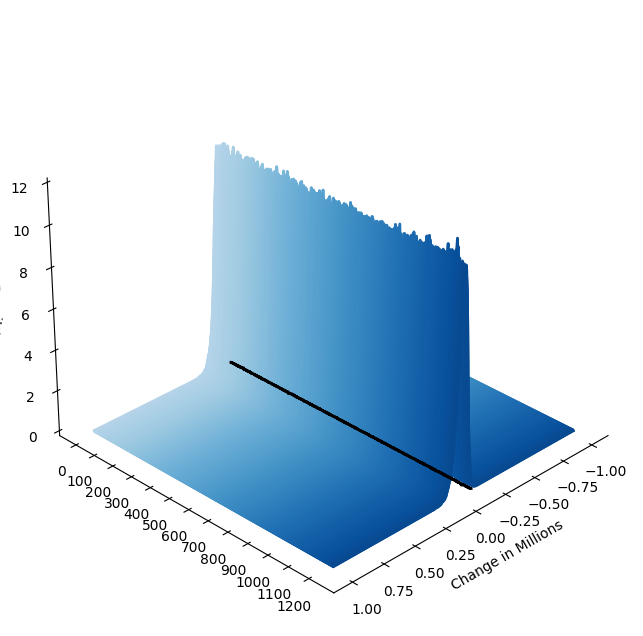

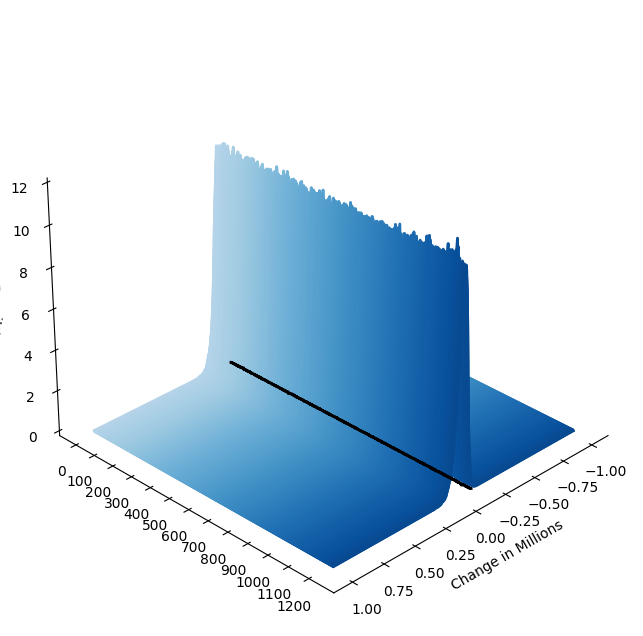

In [ ]:
plot_3d_density(plotting_data)

In [ ]:
from internal_models.multivariate_GAN.simple_gan_portfolio import SimpleGANPortfolio
from internal_models.multivariate_GAN.students_copula_GAN import StudentCopula

## Making sure the window ends when we want to start testing

In [ ]:
entire_df = pd.concat([returns_df, test_returns_df])

In [ ]:
test_start_date = test_returns_df.index.min()
test_end_date = test_returns_df.index.max()
print("Test end date:", test_end_date)

# Find the index location of the test_start_date in entire_df
idx = entire_df.index.get_loc(test_end_date)
idx_start = entire_df.index.get_loc(test_start_date)

# Slice 252 rows before that index
historical_df = entire_df.iloc[idx_start - 252:]
historical_df.head()

Test end date: 2024-11-06 00:00:00


,REEL,PE,MSCIWORLD,IG,GOV,HY,EONIA
Date,,,,,,,
2019-01-03,0.000449,-0.016792,-0.017998,0.003209,-0.002739,0.000322,-0.00001
2019-01-04,0.017480,0.029982,0.025947,-0.004488,-0.002372,0.006997,-0.00001
2019-01-07,0.004902,0.016009,0.003607,0.000024,-0.001484,0.006122,-0.00003
2019-01-08,0.015357,0.012384,0.010125,-0.000592,-0.001053,0.004209,-0.00001
2019-01-09,-0.003836,0.003621,0.001916,0.001019,0.001938,0.004650,-0.00001


In [ ]:
# CALCULATE DELTA BOF ARRAY
eonia = historical_df.iloc[:, -1]
bof_0 = assets_0 - liabilities_0

In [ ]:
n_windows = len(historical_df) - 252 + 1

window_start_dates = []
window_end_dates = []
realized_bof_values = []
realized_delta_bof_values_1 = []

for t in range(n_windows):
    # Get window data
    window_data = historical_df.iloc[t:t+252]
    window_start_date = historical_df.index[t]
    window_end_date = historical_df.index[t+252-1]
    
    # Get returns and EONIA for this window
    window_returns = (window_data * weights).sum(axis=1)
    window_eonia = window_data.iloc[:, -1]
    
    # Calculate portfolio value at the end of the window
    # Starting from assets_0 each time
    portfolio_value_end = assets_0 * (1 + window_returns).prod() # This is analogous to the yearly return
    
    # Calculate liabilities at the end of the window
    # Starting from liabilities_0 each time
    liabilities_end = liabilities_0 * (1 + window_eonia).prod()
    
    # Calculate BOF at the end of the window
    bof_end = portfolio_value_end - liabilities_end
    delta_bof = bof_end - bof_0
    
    # Store results
    window_start_dates.append(window_start_date)
    window_end_dates.append(window_end_date)
    realized_bof_values.append(bof_end)
    realized_delta_bof_values_1.append(delta_bof)

## Does not work, since when we have a rolling BOF_0, and windows are overlapping, returns are counted over again multiple times, hence blowing up bof_0

To mitigate these i look at portfolio and liability values on a daily basis. I check the start and end values for all the different windows.

1233


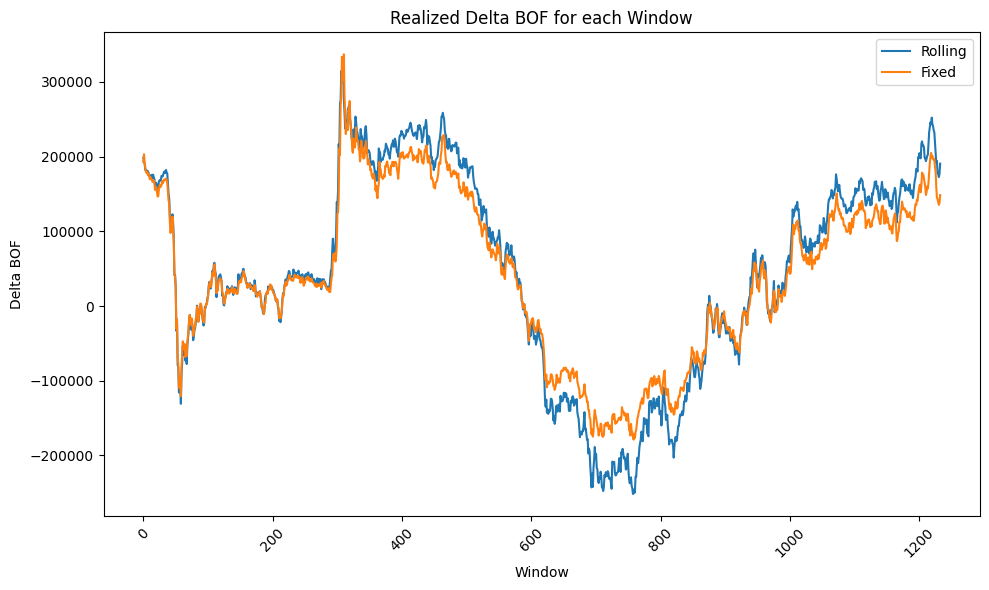

In [ ]:
n_windows = len(historical_df) - 252 + 1

window_start_dates = []
window_end_dates = []
realized_bof_values = []
realized_delta_bof_values = []

# For rolling approach, we need to track daily evolution of the portfolio
portfolio_values = [assets_0]  # Initialize with starting value
liability_values = [liabilities_0]  # Initialize with starting value

# First, calculate the full evolution of portfolio and liabilities day by day
for i in range(len(historical_df)):
    if i == 0:
        continue  # Skip first day as we already have initial values
        
    daily_return = (historical_df.iloc[i] * weights).sum()
    daily_eonia = historical_df.iloc[i, -1]
    
    new_portfolio_value = portfolio_values[-1] * (1 + daily_return)
    new_liability_value = liability_values[-1] * (1 + daily_eonia)
    
    portfolio_values.append(new_portfolio_value)
    liability_values.append(new_liability_value)

# Now calculate BOF for each window using the pre-calculated values
for t in range(n_windows):
    window_start_date = historical_df.index[t]
    window_end_date = historical_df.index[t+252-1]
    
    # Get BOF at start and end of window
    bof_start = portfolio_values[t] - liability_values[t]
    bof_end = portfolio_values[t+252-1] - liability_values[t+252-1]
    
    # Calculate delta BOF for this window
    delta_bof = bof_end - bof_start
    
    # Store results
    window_start_dates.append(window_start_date)
    window_end_dates.append(window_end_date)
    realized_bof_values.append(bof_end)
    realized_delta_bof_values.append(delta_bof)

print(len(realized_delta_bof_values_1))
plt.figure(figsize=(10, 6))
plt.plot(realized_delta_bof_values, linestyle='-', label="Rolling")
plt.plot(realized_delta_bof_values_1, linestyle='-', label="Fixed")
plt.xlabel("Window")
plt.ylabel("Delta BOF")
plt.title("Realized Delta BOF for each Window")
plt.xticks(rotation=45)
plt.grid(False)
plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
'''
from utilities.bof_var_plot import plot_bof_var

asset_names = list(returns_df.columns)
all_dates = sorted(list(scenarios_results[asset_names[0]].keys()))

portfolio_scr_results = {}  # key: date, value: scr

i = 0
for date in all_dates[:]:
    i += 1
    gan_samples_cols = []
    for asset in asset_names:
        asset_scenarios = scenarios_results[asset][date]  # expected shape: (n_simulations, window_size)
        asset_cum = np.prod(1 + asset_scenarios, axis=1) - 1

        if np.isnan(asset_cum).any() or np.isinf(asset_cum).any():
            print(f"Warning: NaN or Inf encountered in cumulative returns for asset {asset} on date {date}.")
        gan_samples_cols.append(asset_cum.reshape(-1, 1))

    gan_samples = np.hstack(gan_samples_cols)  # shape: (n_simulations, n_assets)
    
    portfolio = SimpleGANPortfolio(gan_samples, weights, bof0_casei=-1)
    bof_change, scr = portfolio.calculate_distribution_and_scr(case=2)
 
    if i % 16 == 0 or i == 1:
        plot_bof_var(bof_change,scr,r"$\Delta$BOF Distribution for date = " + str(date))
    
    if scr > 0: scr = 0.0
    
    portfolio_scr_results[date] = scr
    '''


<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
C:\Users\nicka\AppData\Local\Temp\ipykernel_16472\3265619124.py:1: SyntaxWarning: invalid escape sequence '\D'
  '''


'\nfrom utilities.bof_var_plot import plot_bof_var\n\nasset_names = list(returns_df.columns)\nall_dates = sorted(list(scenarios_results[asset_names[0]].keys()))\n\nportfolio_scr_results = {}  # key: date, value: scr\n\ni = 0\nfor date in all_dates[:]:\n    i += 1\n    gan_samples_cols = []\n    for asset in asset_names:\n        asset_scenarios = scenarios_results[asset][date]  # expected shape: (n_simulations, window_size)\n        asset_cum = np.prod(1 + asset_scenarios, axis=1) - 1\n\n        if np.isnan(asset_cum).any() or np.isinf(asset_cum).any():\n            print(f"Warning: NaN or Inf encountered in cumulative returns for asset {asset} on date {date}.")\n        gan_samples_cols.append(asset_cum.reshape(-1, 1))\n\n    gan_samples = np.hstack(gan_samples_cols)  # shape: (n_simulations, n_assets)\n    \n    portfolio = SimpleGANPortfolio(gan_samples, weights, bof0_casei=-1)\n    bof_change, scr = portfolio.calculate_distribution_and_scr(case=2)\n \n    if i % 16 == 0 or i == 1:\

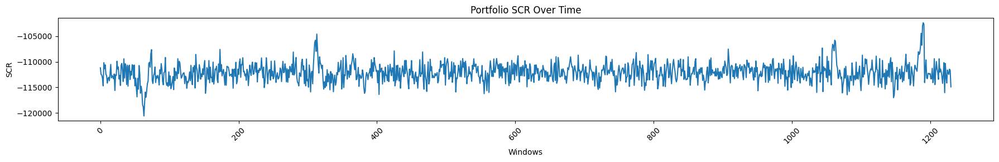

In [ ]:
sorted_dates = sorted(portfolio_scr_results.keys())
scr_values = [portfolio_scr_results[date] for date in sorted_dates]

plt.figure(figsize=(18, 3))
plt.plot(scr_values, linestyle='-')
plt.xlabel("Windows")
plt.ylabel("SCR")
plt.title("Portfolio SCR Over Time")
plt.xticks(rotation=45)
plt.grid(False)
plt.tight_layout()
plt.show()

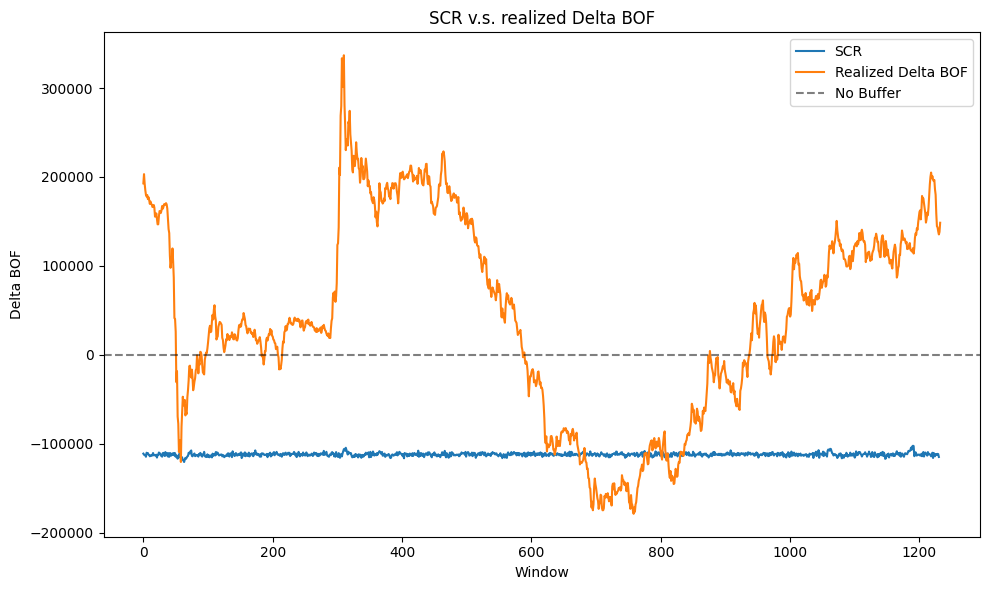

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(scr_values, linestyle='-', label='SCR')
plt.plot(realized_delta_bof_values_1, linestyle='-', label='Realized Delta BOF')

# Add a vertical dashed line - you can change the position as needed
plt.axhline(y=0, color='black', linestyle='--', label='No Buffer', alpha=0.5)

plt.xlabel("Window")
plt.ylabel("Delta BOF")
plt.title("SCR v.s. realized Delta BOF")
plt.grid(False)
plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
from backtesting.perform_var_tests import evaluate_risk_metrics

evaluate_risk_metrics(scr_values, realized_delta_bof_values_1)

breaches [0 0 0 ... 0 0 0]


,Metric,Value,Description,Pass/Fail
0,Balanced SCR Loss (α=0.25),40572.5174,Penalty for under-conservatism,
1,Balanced SCR Loss (α=0.5),81145.0229,Penalty for balanced,
2,Balanced SCR Loss (α=0.75),121717.5285,Penalty for capital inefficiency,
3,Kupiec POF Test p-value,0.0000,Tests if breach frequency matches expected,❌
4,Indep. Test p-value,0.0000,Tests if breaches are independent,❌
5,Cond. Coverage p-value,0.0000,Combined test of frequency and independence,❌
6,Lopez Average Loss,0.1183,Quadratic loss function for VaR breaches,
7,Breach Rate,0.1064,Proportion of time when Delta BOF < SCR,


-------------------------------------------------------------------------------------------------------------------------------------------------------------------------
## SHOWING A BUNCH OF GAN SPESIFIC RESULTS

- Distributions
- Latent space plots
- PCAs

etc.

In [ ]:
for asset_name in gan_dict:
    gan_dict[asset_name].reset_returns()
    gan_dict[asset_name].generate_scenarios(num_scenarios=10000)

Generated scenarios saved to: generated_CGAN_output_test\generated_returns_REEL_final_scenarios.pt
Generated scenarios saved to: generated_CGAN_output_test\generated_returns_PE_final_scenarios.pt
Generated scenarios saved to: generated_CGAN_output_test\generated_returns_MSCIWORLD_final_scenarios.pt
Generated scenarios saved to: generated_CGAN_output_test\generated_returns_IG_final_scenarios.pt
Generated scenarios saved to: generated_CGAN_output_test\generated_returns_GOV_final_scenarios.pt
Generated scenarios saved to: generated_CGAN_output_test\generated_returns_HY_final_scenarios.pt
Generated scenarios saved to: generated_CGAN_output_test\generated_returns_EONIA_final_scenarios.pt


Loaded Generated returns from: generated_CGAN_output_test\generated_returns_REEL_final_scenarios.pt
Scaled = False
Loaded Generated returns from: generated_CGAN_output_test\generated_returns_PE_final_scenarios.pt
Scaled = False
Loaded Generated returns from: generated_CGAN_output_test\generated_returns_MSCIWORLD_final_scenarios.pt
Scaled = False
Loaded Generated returns from: generated_CGAN_output_test\generated_returns_IG_final_scenarios.pt
Scaled = False
Loaded Generated returns from: generated_CGAN_output_test\generated_returns_GOV_final_scenarios.pt
Scaled = False
Loaded Generated returns from: generated_CGAN_output_test\generated_returns_HY_final_scenarios.pt
Scaled = False
Loaded Generated returns from: generated_CGAN_output_test\generated_returns_EONIA_final_scenarios.pt
Scaled = False


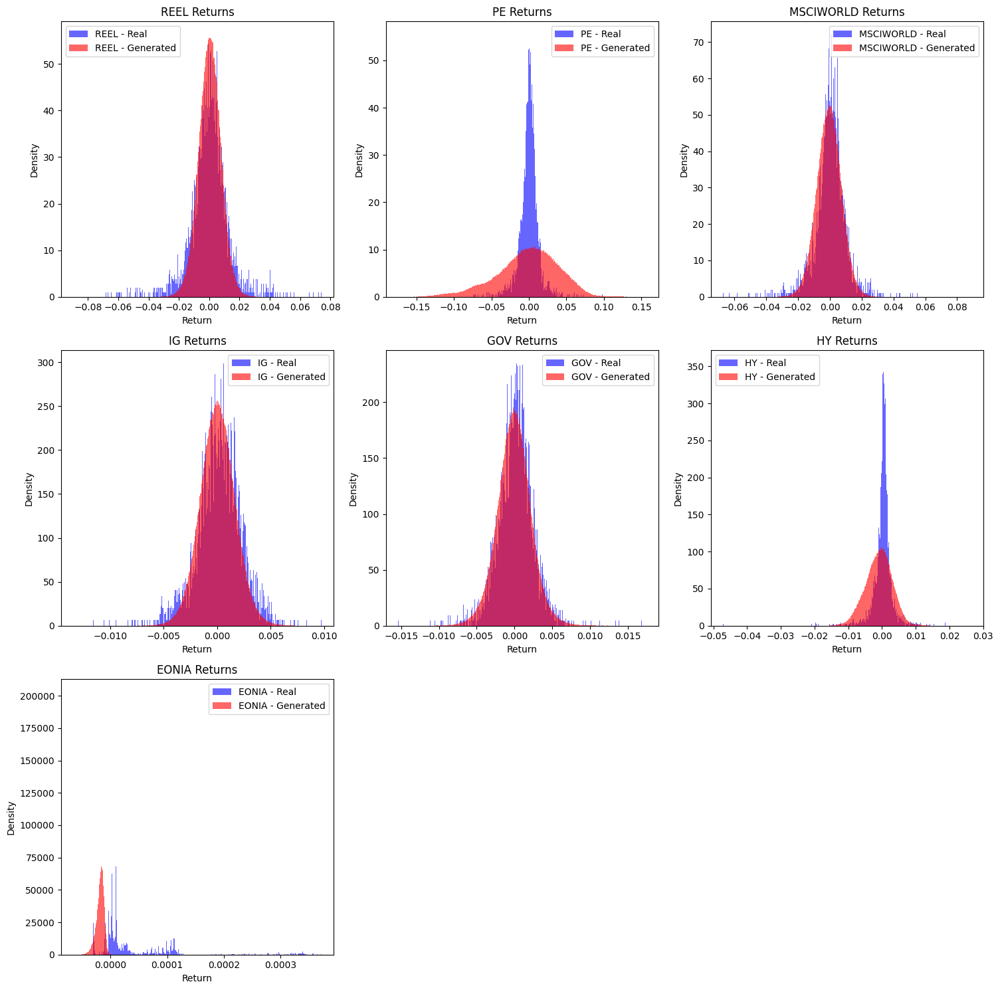


📊 Return Statistics Summary:
                Asset      Mean  Std Dev  Skewness  Kurtosis  99.5% VaR
          REEL - Real  0.000193 0.012916 -0.270455  4.969021  -0.051644
     REEL - Generated  0.000388 0.007437 -0.052342  0.348924  -0.020022
            PE - Real  0.000224 0.012736 -0.303648  6.380382  -0.052287
       PE - Generated -0.001573 0.041090 -0.438913  0.251013  -0.122880
     MSCIWORLD - Real  0.000283 0.009887 -0.226726  7.359869  -0.037021
MSCIWORLD - Generated -0.000506 0.007785 -0.050849  0.285321  -0.021658
            IG - Real  0.000182 0.002083 -0.458256  2.226597  -0.006788
       IG - Generated  0.000039 0.001639  0.043697  0.398316  -0.004329
           GOV - Real  0.000183 0.002449 -0.034370  4.018610  -0.008100
      GOV - Generated -0.000047 0.002264  0.047476  0.937808  -0.006412
            HY - Real  0.000279 0.003002 -1.860565 31.424899  -0.012798
       HY - Generated -0.000939 0.003972 -0.132005  0.205780  -0.011833
         EONIA - Real  0.000032 0.

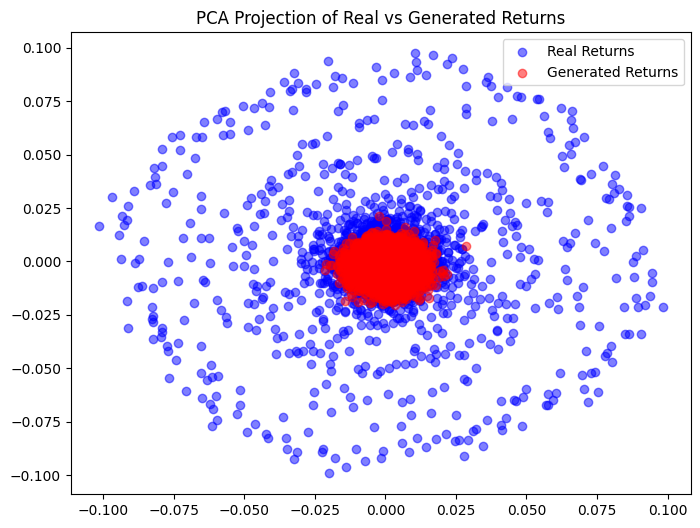

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_REEL_final_scenarios.pt


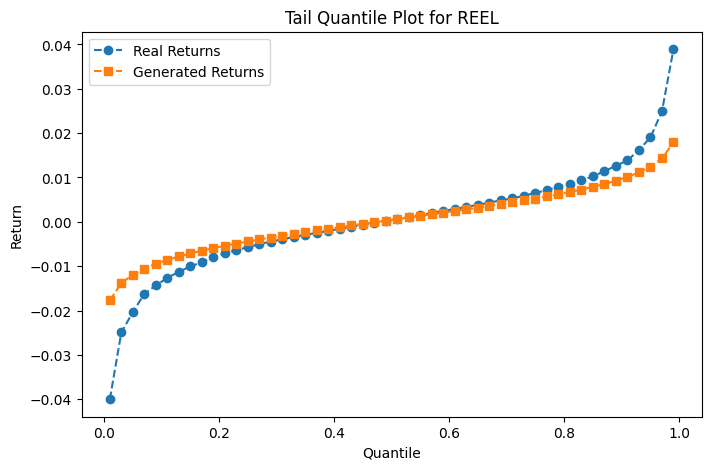


════════════════════════════════════════════════
║  COMPUTING NEAREST DISTANCE HISTOGRAM: REEL  ║
════════════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_REEL_final_scenarios.pt

📊 Distance Summary for REEL:
Min Distance: 0.000000
Max Distance: 0.564905
Mean Distance: 0.001212
Median Distance: 0.000373
Standard Deviation: 0.003945


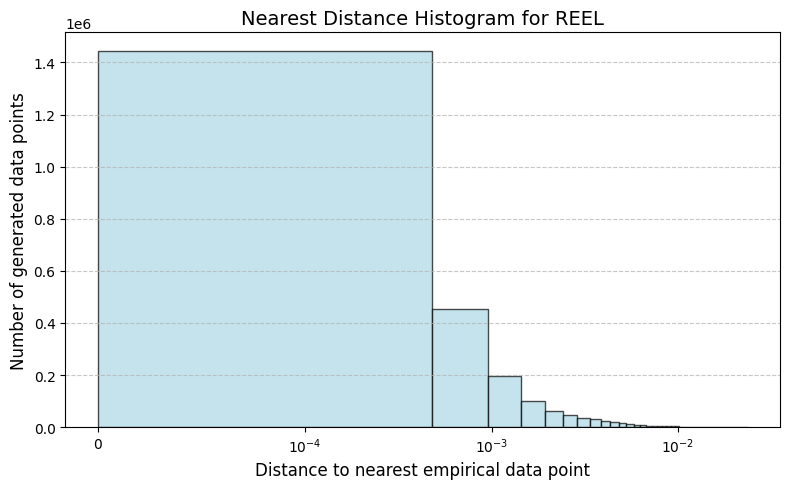


══════════════════════════════════════════
║  COMPUTING WASSERSTEIN DISTANCE: REEL  ║
══════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_REEL_final_scenarios.pt
📊 Wasserstein Distance for REEL: 0.003023


═════════════════════════
║  ANALYZING ASSET: PE  ║
═════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_PE_final_scenarios.pt
Variance of Real Data: 0.000162
Variance of Generated Data: 0.000131
✅ Generated Data Shows Reasonable Variance
Mean Pairwise Distance (Real): 0.268750
Mean Pairwise Distance (Generated): 0.254489
✅ Generated samples are reasonably diverse


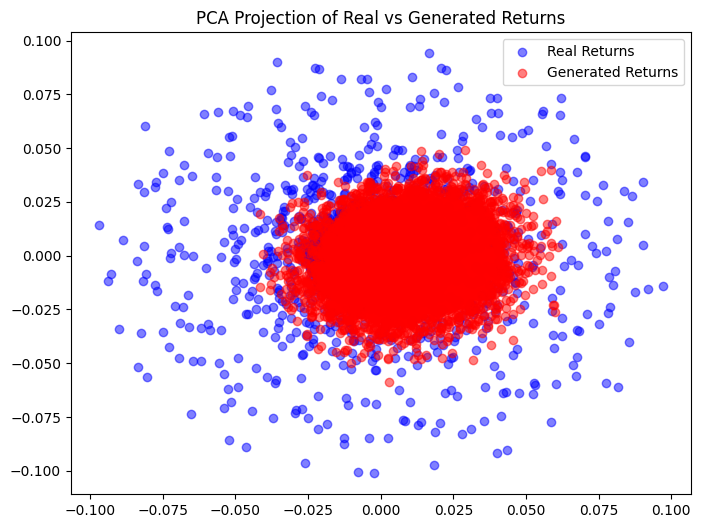

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_PE_final_scenarios.pt


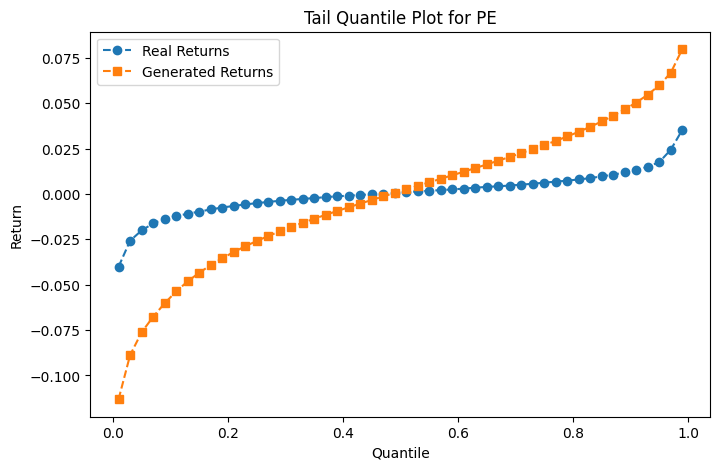


══════════════════════════════════════════════
║  COMPUTING NEAREST DISTANCE HISTOGRAM: PE  ║
══════════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_PE_final_scenarios.pt

📊 Distance Summary for PE:
Min Distance: 0.000000
Max Distance: 0.228063
Mean Distance: 0.001234
Median Distance: 0.000376
Standard Deviation: 0.002920


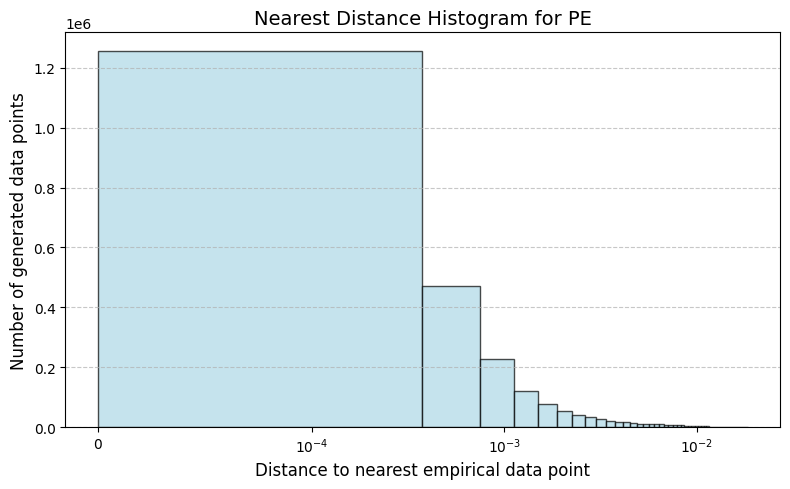


════════════════════════════════════════
║  COMPUTING WASSERSTEIN DISTANCE: PE  ║
════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_PE_final_scenarios.pt
📊 Wasserstein Distance for PE: 0.023758


════════════════════════════════
║  ANALYZING ASSET: MSCIWORLD  ║
════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_MSCIWORLD_final_scenarios.pt
Variance of Real Data: 0.000098
Variance of Generated Data: 0.000055
✅ Generated Data Shows Reasonable Variance
Mean Pairwise Distance (Real): 0.211255
Mean Pairwise Distance (Generated): 0.164065
✅ Generated samples are reasonably diverse


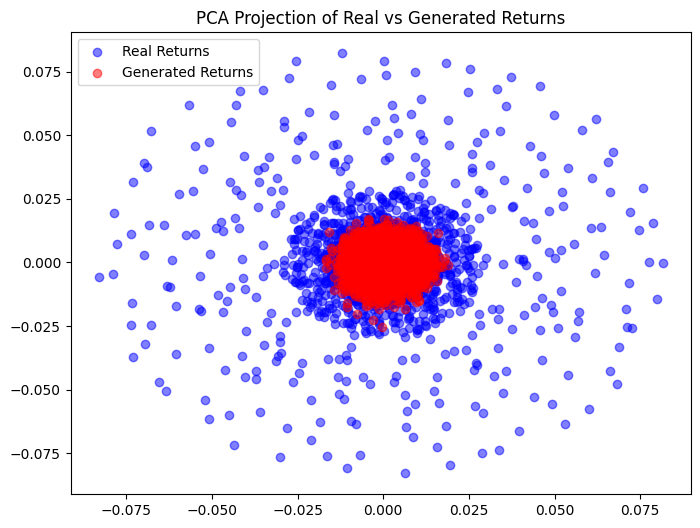

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_MSCIWORLD_final_scenarios.pt


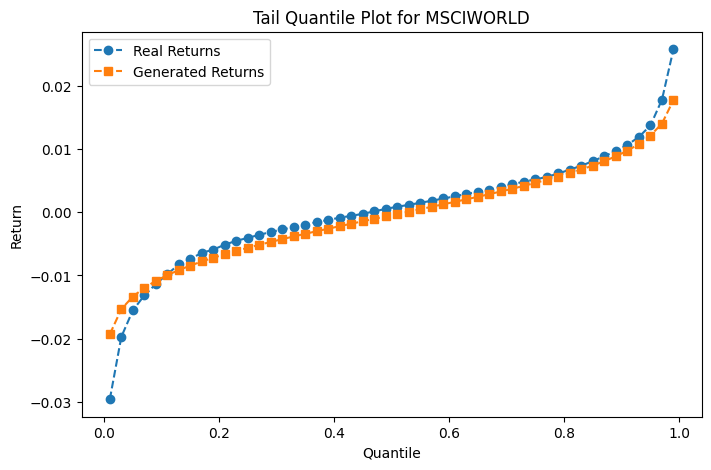


═════════════════════════════════════════════════════
║  COMPUTING NEAREST DISTANCE HISTOGRAM: MSCIWORLD  ║
═════════════════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_MSCIWORLD_final_scenarios.pt

📊 Distance Summary for MSCIWORLD:
Min Distance: 0.000000
Max Distance: 0.617450
Mean Distance: 0.001239
Median Distance: 0.000377
Standard Deviation: 0.004292


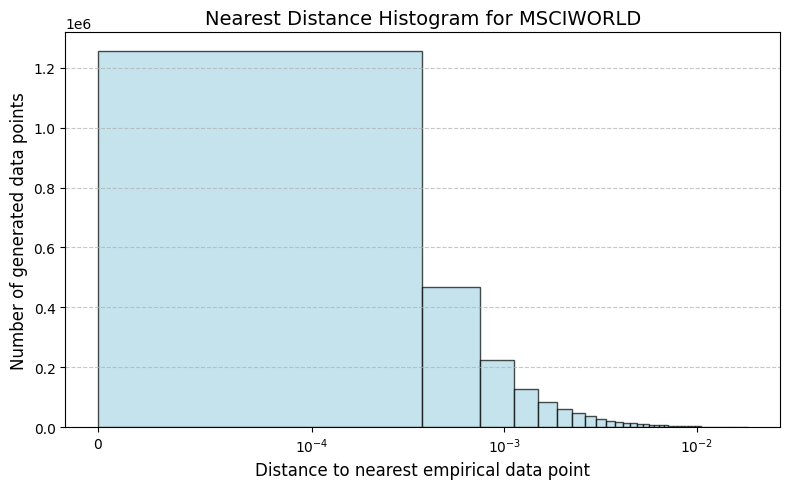


═══════════════════════════════════════════════
║  COMPUTING WASSERSTEIN DISTANCE: MSCIWORLD  ║
═══════════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_MSCIWORLD_final_scenarios.pt
📊 Wasserstein Distance for MSCIWORLD: 0.001637


═════════════════════════
║  ANALYZING ASSET: IG  ║
═════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_IG_final_scenarios.pt
Variance of Real Data: 0.000004
Variance of Generated Data: 0.000002
✅ Generated Data Shows Reasonable Variance
Mean Pairwise Distance (Real): 0.046002
Mean Pairwise Distance (Generated): 0.034439
✅ Generated samples are reasonably diverse


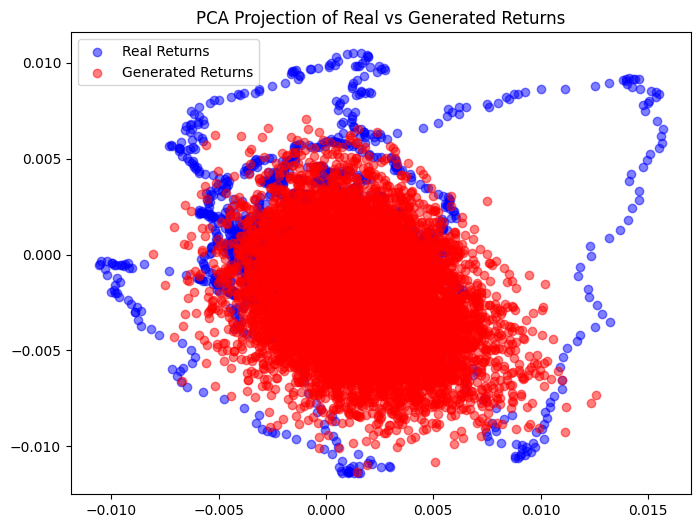

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_IG_final_scenarios.pt


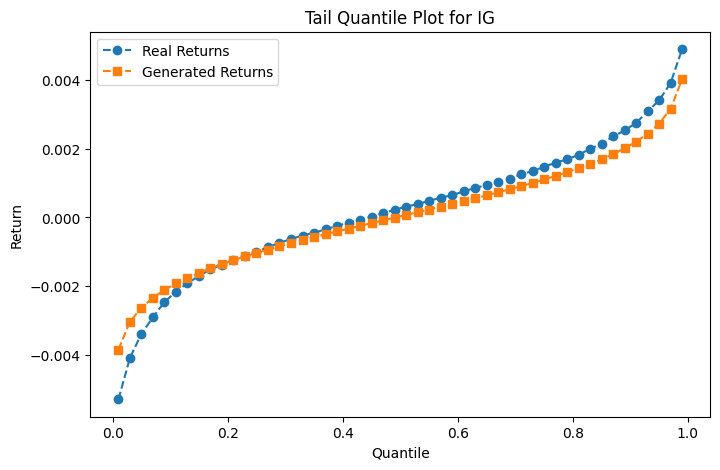


══════════════════════════════════════════════
║  COMPUTING NEAREST DISTANCE HISTOGRAM: IG  ║
══════════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_IG_final_scenarios.pt

📊 Distance Summary for IG:
Min Distance: 0.000000
Max Distance: 2.313335
Mean Distance: 0.001237
Median Distance: 0.000378
Standard Deviation: 0.007409


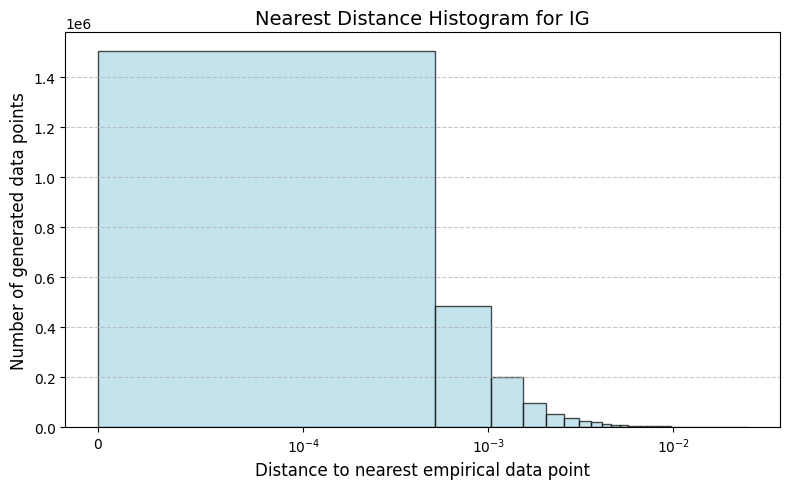


════════════════════════════════════════
║  COMPUTING WASSERSTEIN DISTANCE: IG  ║
════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_IG_final_scenarios.pt
📊 Wasserstein Distance for IG: 0.000355


══════════════════════════
║  ANALYZING ASSET: GOV  ║
══════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_GOV_final_scenarios.pt
Variance of Real Data: 0.000006
Variance of Generated Data: 0.000004
✅ Generated Data Shows Reasonable Variance
Mean Pairwise Distance (Real): 0.054322
Mean Pairwise Distance (Generated): 0.042283
✅ Generated samples are reasonably diverse


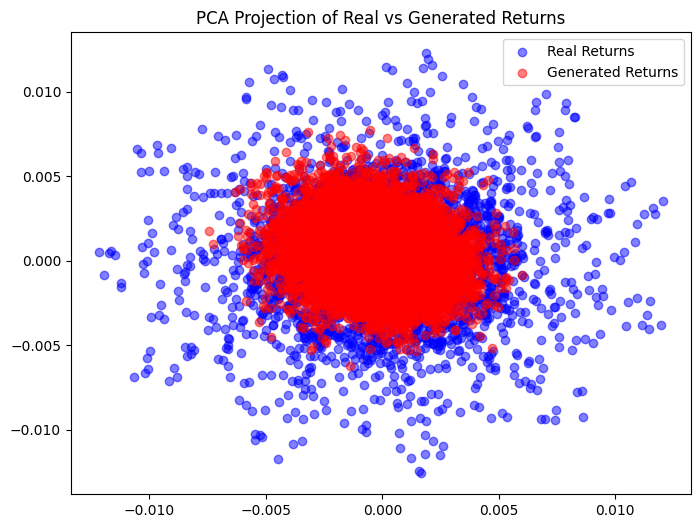

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_GOV_final_scenarios.pt


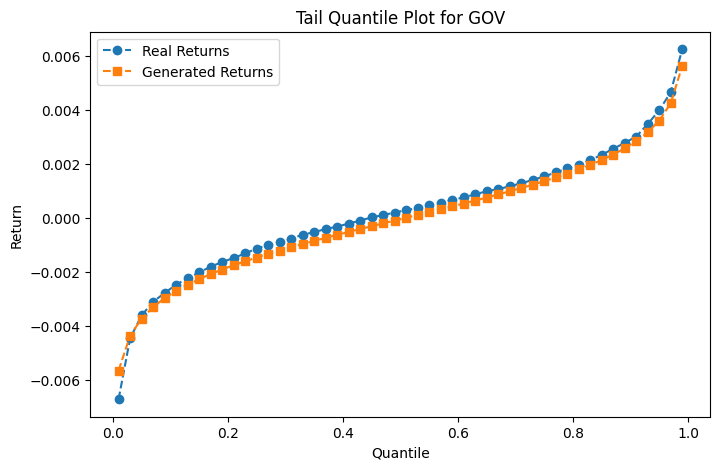


═══════════════════════════════════════════════
║  COMPUTING NEAREST DISTANCE HISTOGRAM: GOV  ║
═══════════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_GOV_final_scenarios.pt

📊 Distance Summary for GOV:
Min Distance: 0.000000
Max Distance: 0.845296
Mean Distance: 0.001296
Median Distance: 0.000359
Standard Deviation: 0.007058


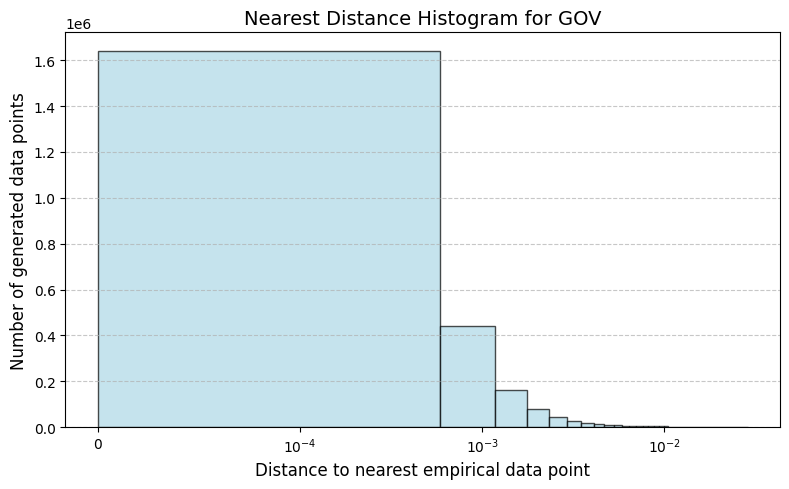


═════════════════════════════════════════
║  COMPUTING WASSERSTEIN DISTANCE: GOV  ║
═════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_GOV_final_scenarios.pt
📊 Wasserstein Distance for GOV: 0.000287


═════════════════════════
║  ANALYZING ASSET: HY  ║
═════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_HY_final_scenarios.pt
Variance of Real Data: 0.000009
Variance of Generated Data: 0.000004
⚠️ Warning: Possible Mode Collapse - Low Variance in Generated Data
Mean Pairwise Distance (Real): 0.060213
Mean Pairwise Distance (Generated): 0.045331
✅ Generated samples are reasonably diverse


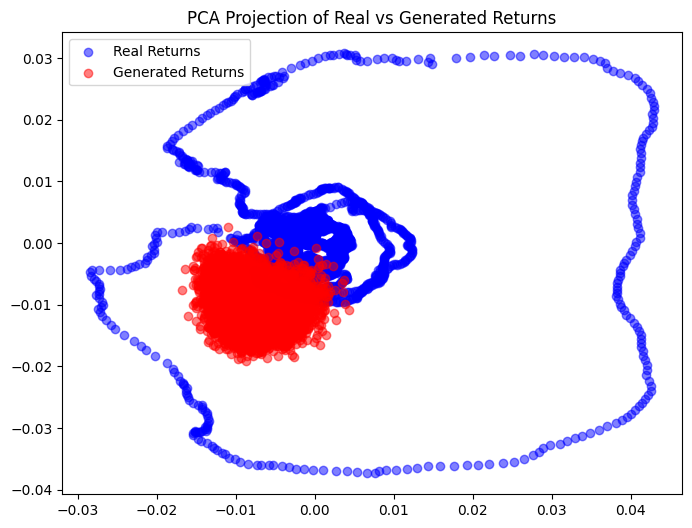

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_HY_final_scenarios.pt


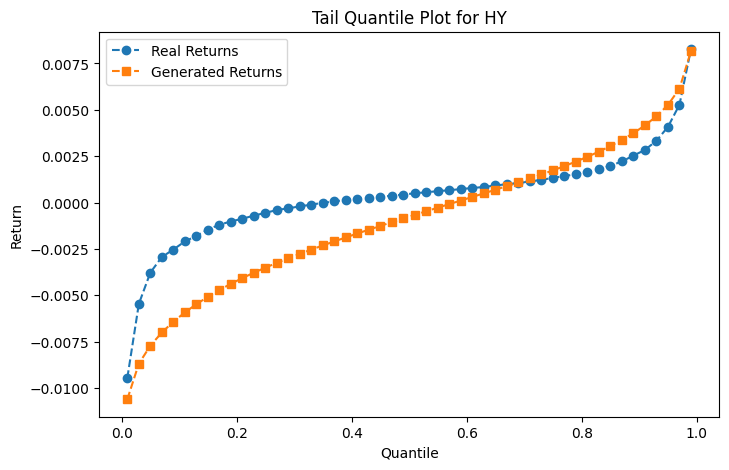


══════════════════════════════════════════════
║  COMPUTING NEAREST DISTANCE HISTOGRAM: HY  ║
══════════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_HY_final_scenarios.pt

📊 Distance Summary for HY:
Min Distance: 0.000000
Max Distance: 0.230806
Mean Distance: 0.001563
Median Distance: 0.000429
Standard Deviation: 0.003685


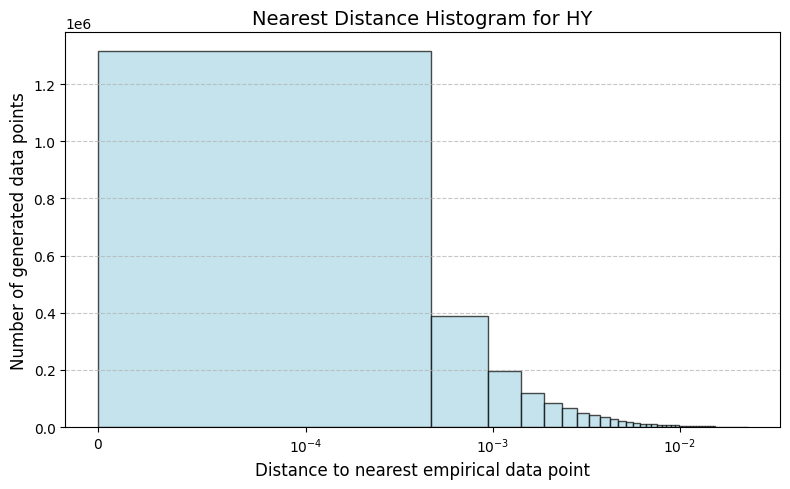


════════════════════════════════════════
║  COMPUTING WASSERSTEIN DISTANCE: HY  ║
════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_HY_final_scenarios.pt
📊 Wasserstein Distance for HY: 0.001770


════════════════════════════
║  ANALYZING ASSET: EONIA  ║
════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_EONIA_final_scenarios.pt
Variance of Real Data: 0.000000
Variance of Generated Data: 0.000000
⚠️ Warning: Possible Mode Collapse - Low Variance in Generated Data
Mean Pairwise Distance (Real): 0.001171
Mean Pairwise Distance (Generated): 0.000151
⚠️ Warning: Potential Mode Collapse - Samples are too similar


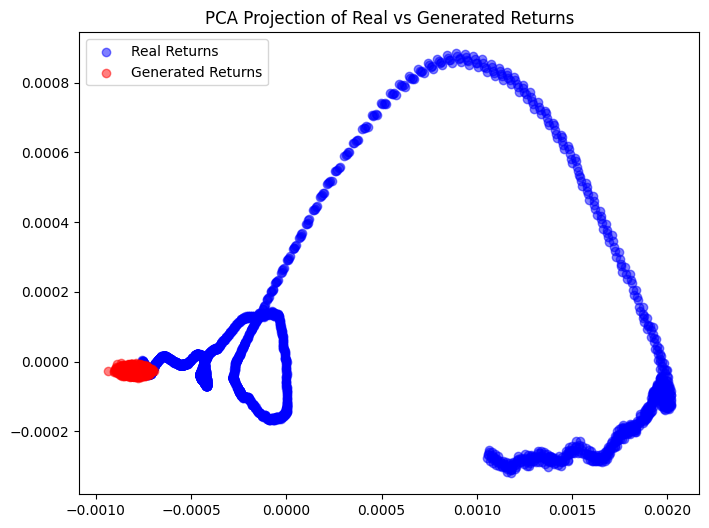


═══════════════════════════════════════════
║  COMPUTING WASSERSTEIN DISTANCE: EONIA  ║
═══════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_EONIA_final_scenarios.pt
📊 Wasserstein Distance for EONIA: 0.000050



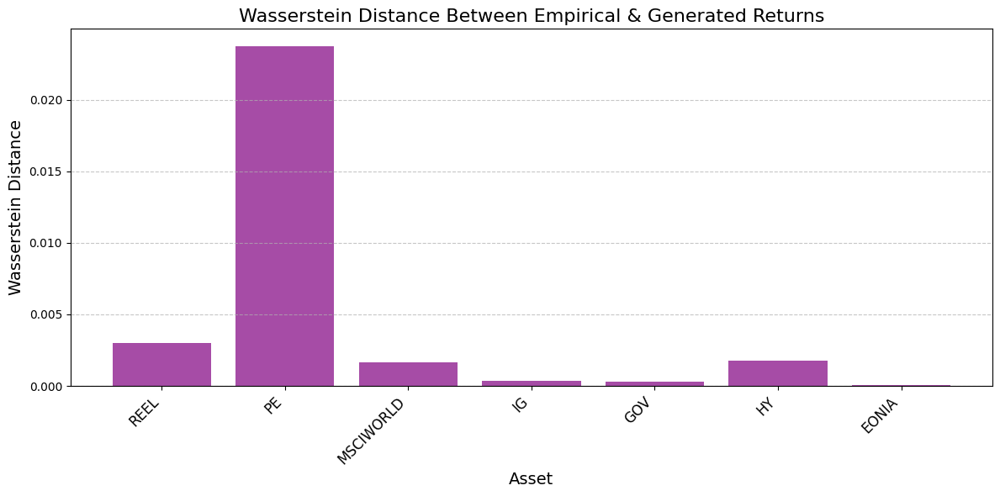

In [ ]:
extensive_plotting(scaled=False, returns_df=returns_df, test=True, quarterly=False)

# ----------------------------------------------------------

In [ ]:
from internal_models.GANs.explainability.visuals_3 import *
from internal_models.GANs.explainability.gan_visuals import *

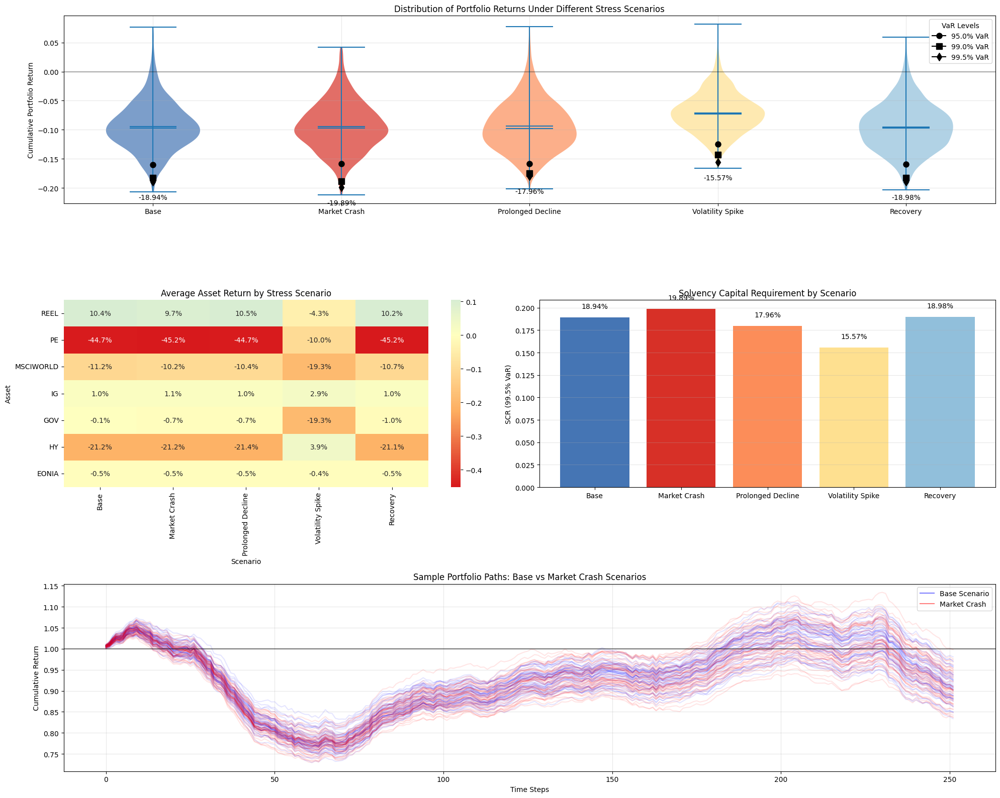

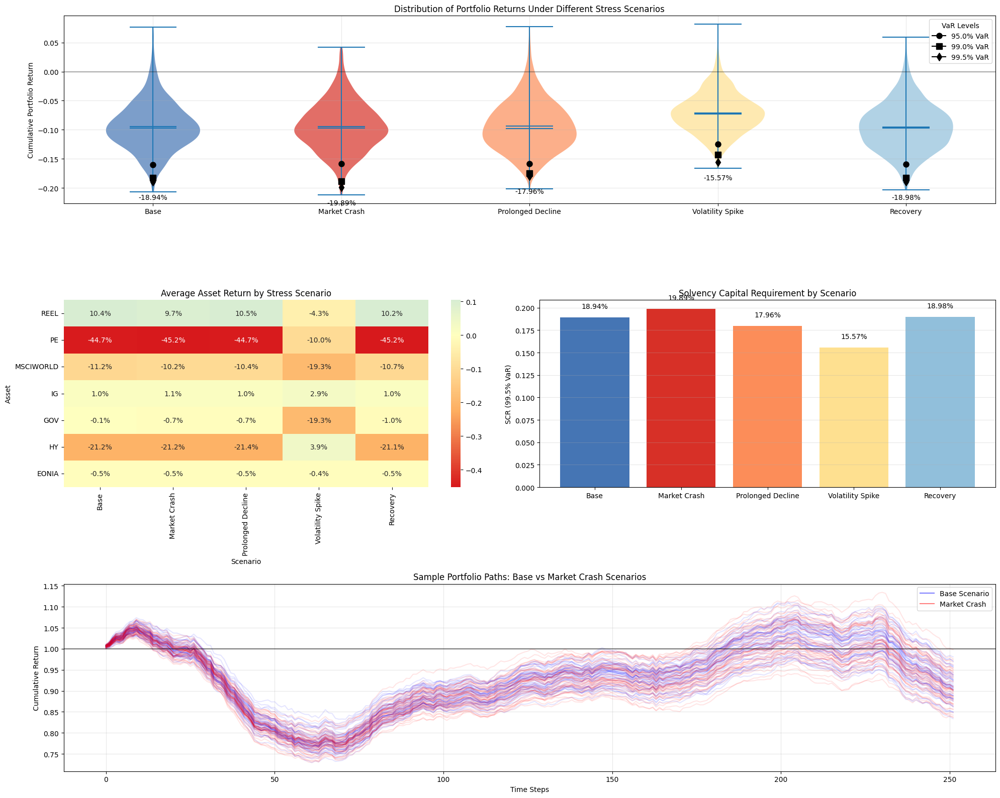

In [ ]:
visualize_stress_tests(gan_dict)

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


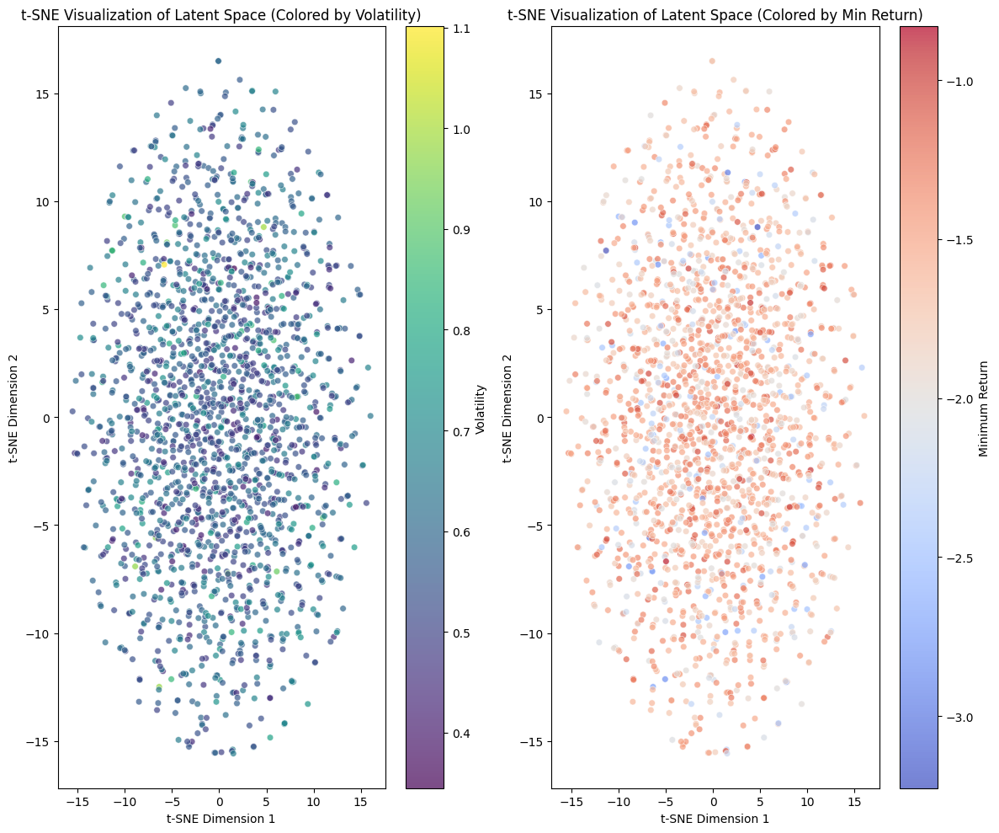

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


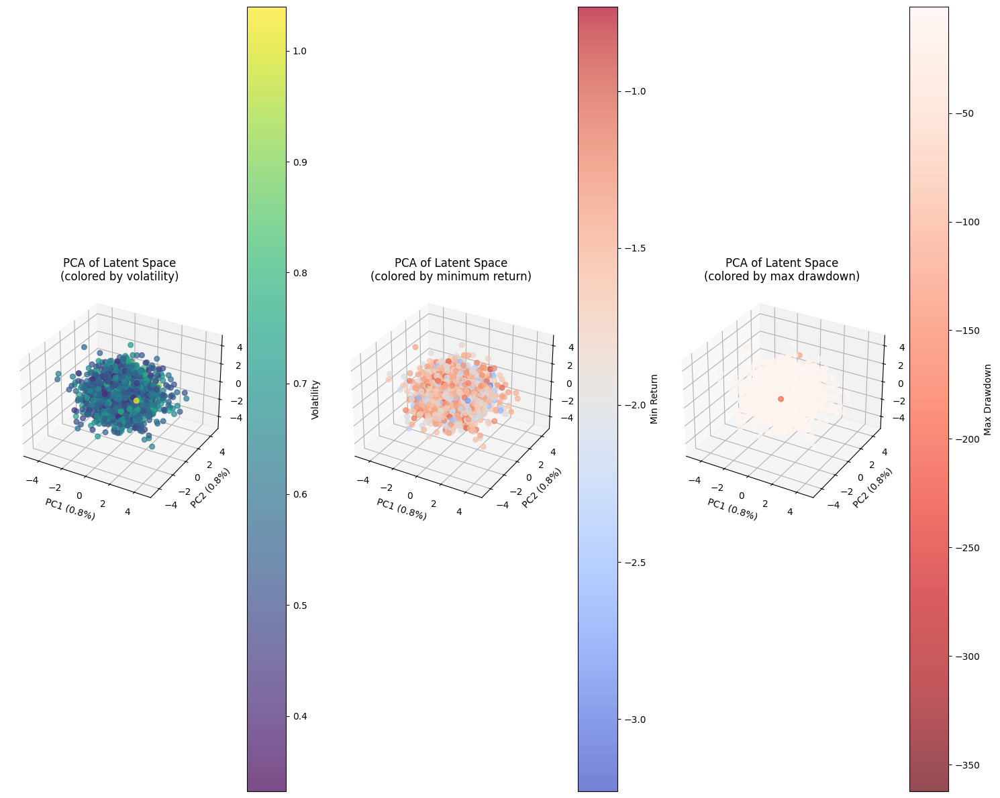

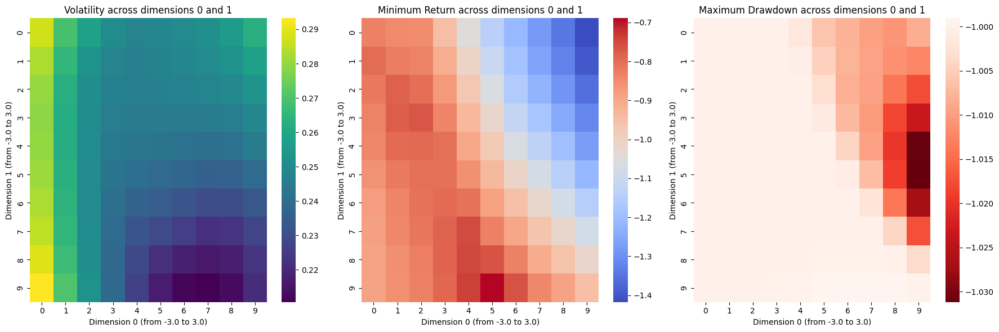

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  6.95it/s]


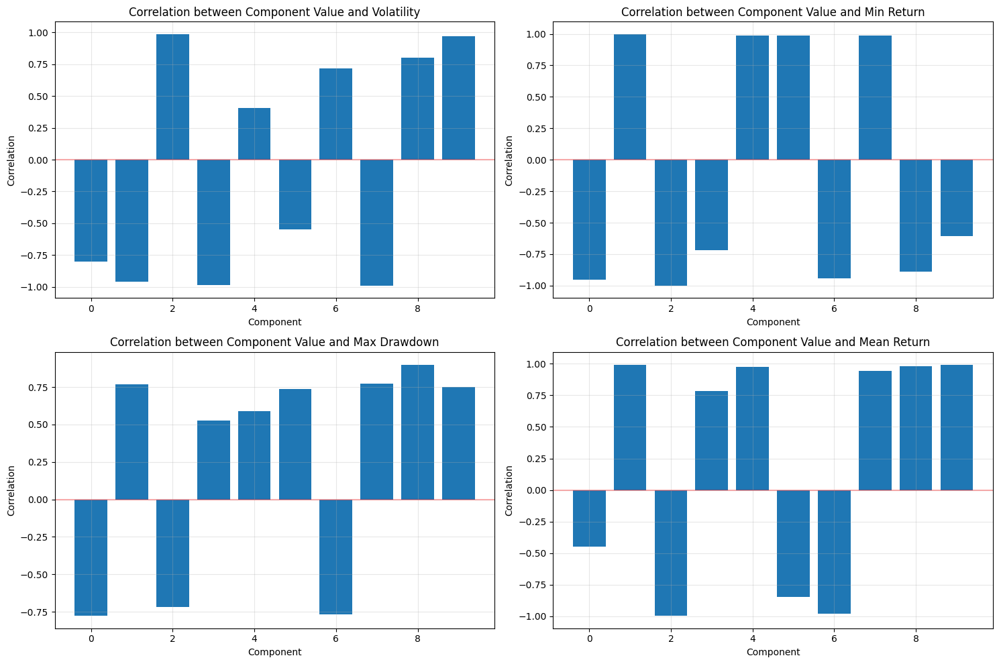

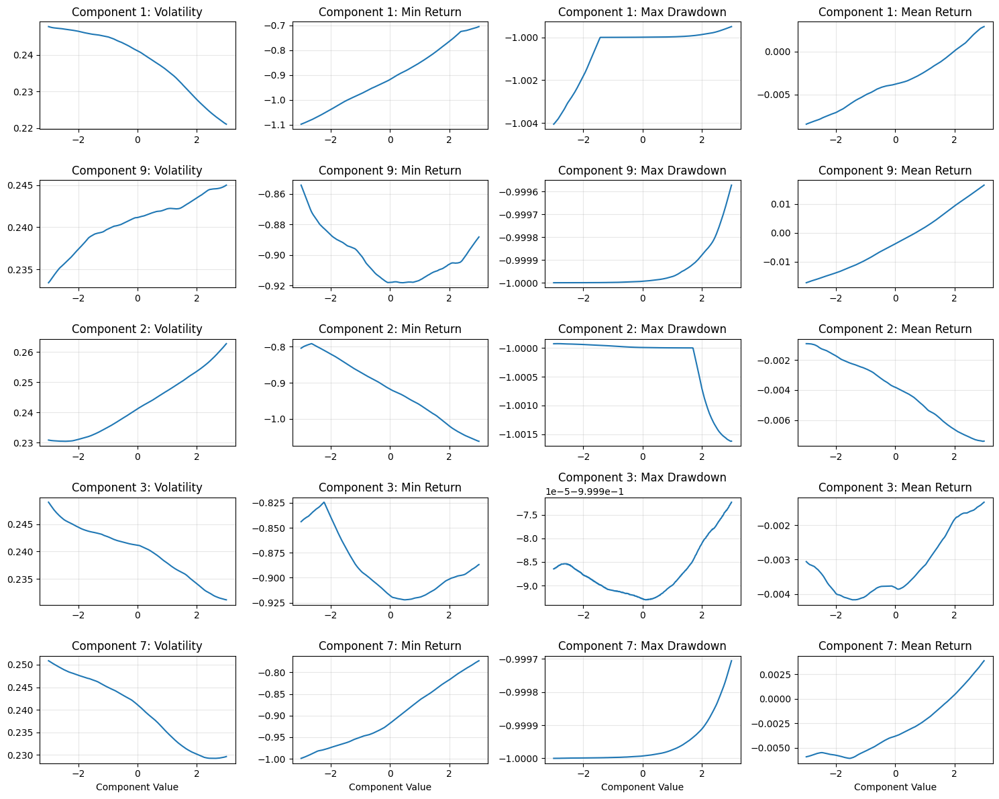

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


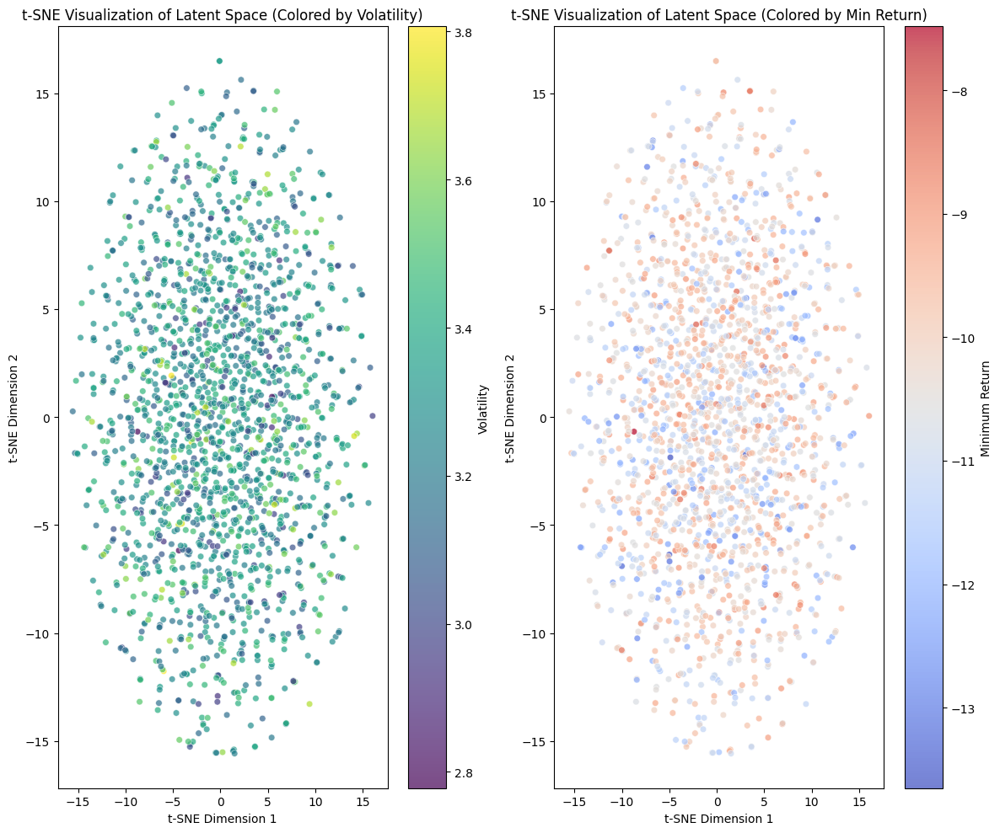

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


c:\Users\nicka\master-thesis\internal_models\GANs\explainability\LatentSpaceVisualizer.py:173: RuntimeWarning: overflow encountered in accumulate
  cum_returns = (1 + returns).cumprod()
c:\Users\nicka\master-thesis\internal_models\GANs\explainability\LatentSpaceVisualizer.py:175: RuntimeWarning: invalid value encountered in subtract
  drawdowns = (cum_returns - running_max) / running_max
c:\Users\nicka\master-thesis\internal_models\GANs\explainability\LatentSpaceVisualizer.py:175: RuntimeWarning: invalid value encountered in divide
  drawdowns = (cum_returns - running_max) / running_max
c:\Users\nicka\master-thesis\internal_models\GANs\explainability\LatentSpaceVisualizer.py:175: RuntimeWarning: overflow encountered in subtract
  drawdowns = (cum_returns - running_max) / running_max


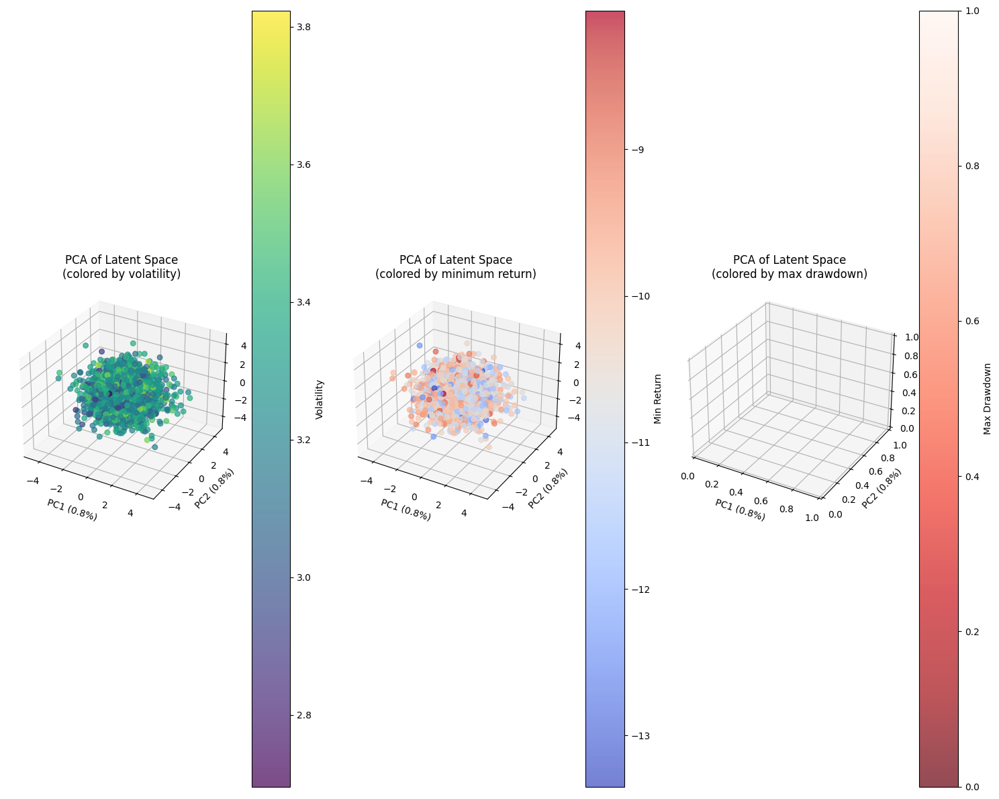

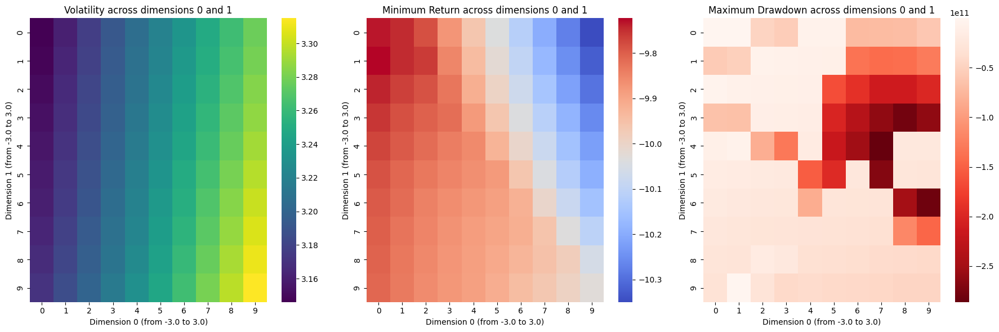

Analyzing latent components:   0%|          | 0/10 [00:00<?, ?it/s]c:\Users\nicka\master-thesis\internal_models\GANs\explainability\LatentSpaceVisualizer.py:173: RuntimeWarning: overflow encountered in accumulate
  cum_returns = (1 + returns).cumprod()
c:\Users\nicka\master-thesis\internal_models\GANs\explainability\LatentSpaceVisualizer.py:175: RuntimeWarning: invalid value encountered in subtract
  drawdowns = (cum_returns - running_max) / running_max
c:\Users\nicka\master-thesis\internal_models\GANs\explainability\LatentSpaceVisualizer.py:175: RuntimeWarning: invalid value encountered in divide
  drawdowns = (cum_returns - running_max) / running_max
c:\Users\nicka\master-thesis\internal_models\GANs\explainability\LatentSpaceVisualizer.py:175: RuntimeWarning: overflow encountered in subtract
  drawdowns = (cum_returns - running_max) / running_max
Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  6.21it/s]


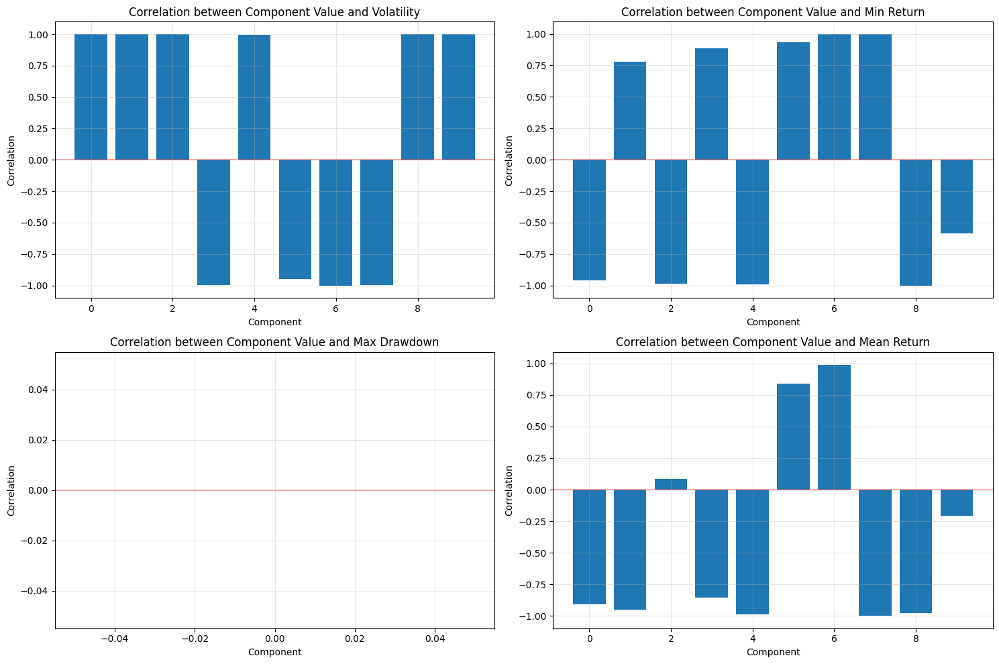

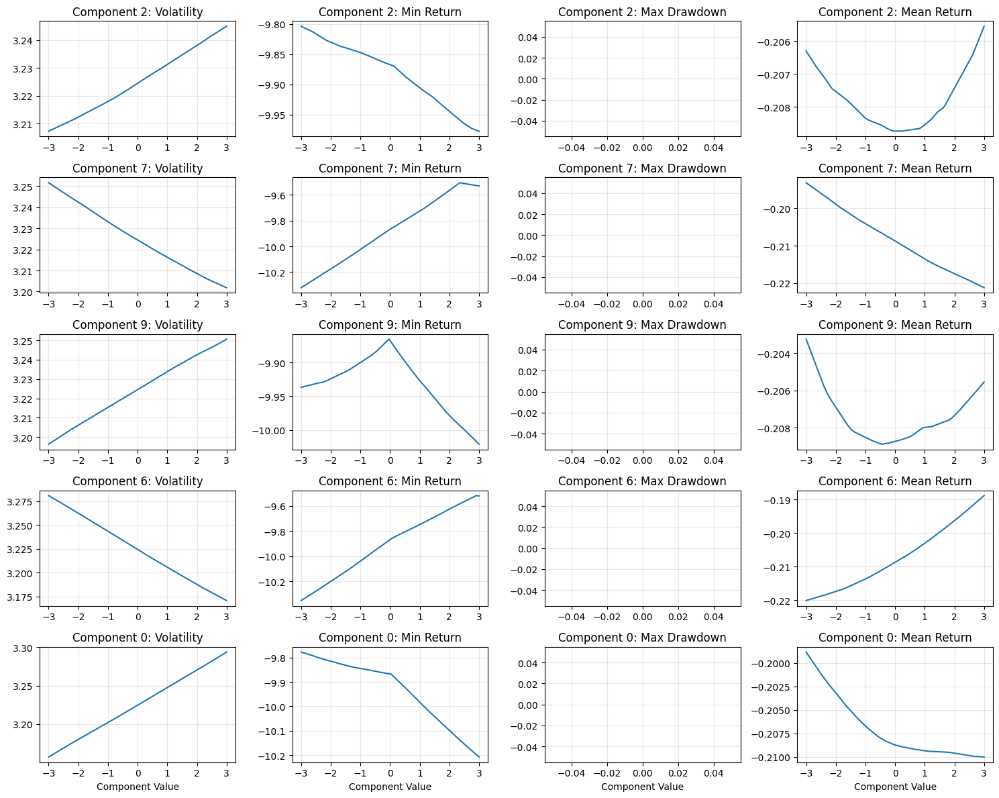

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


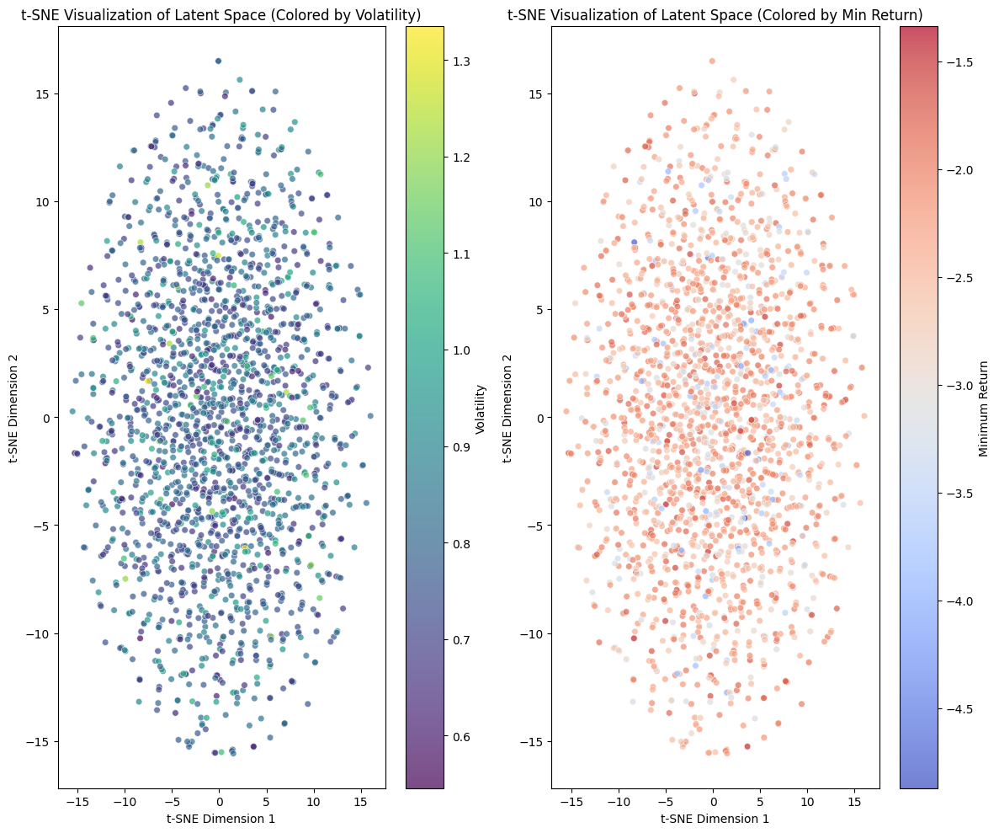

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


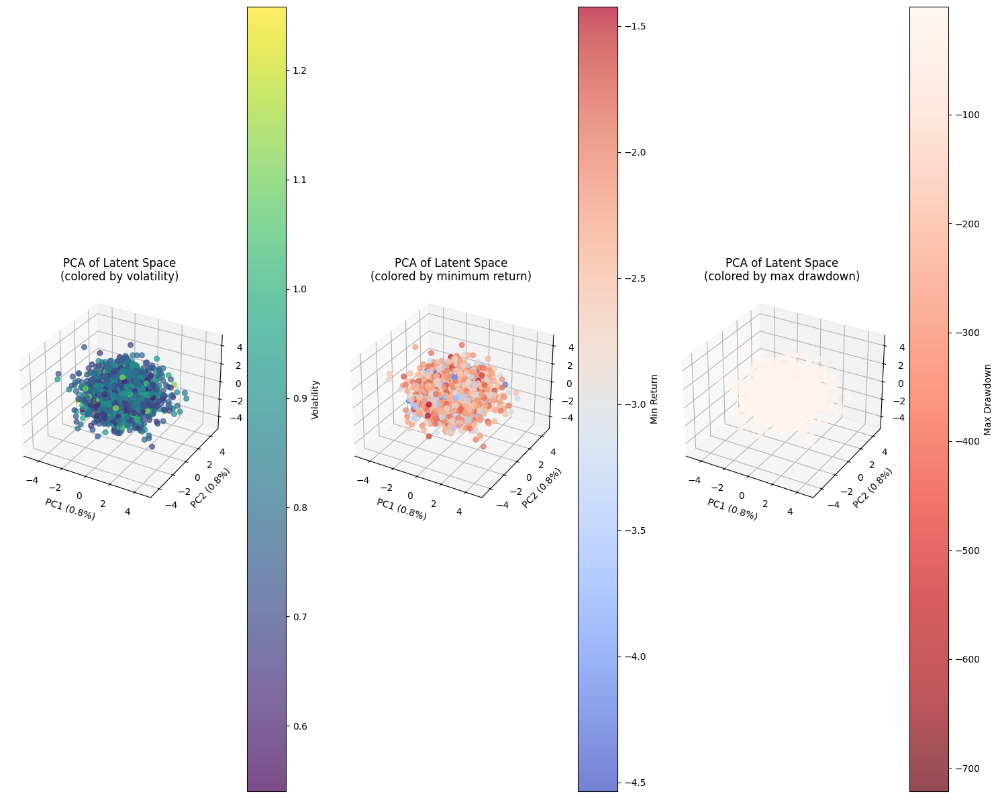

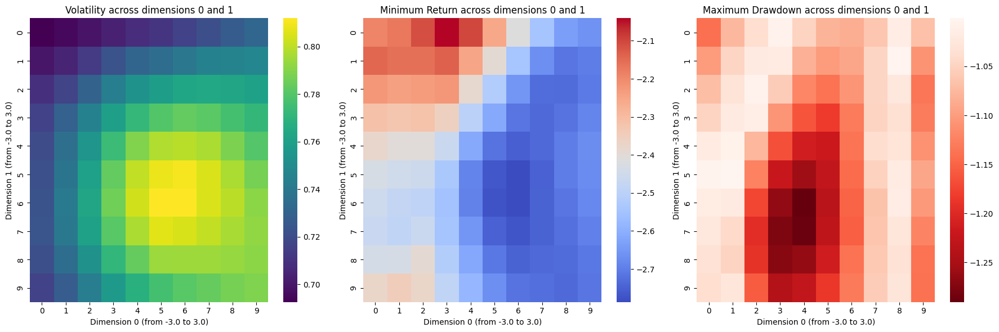

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  6.60it/s]


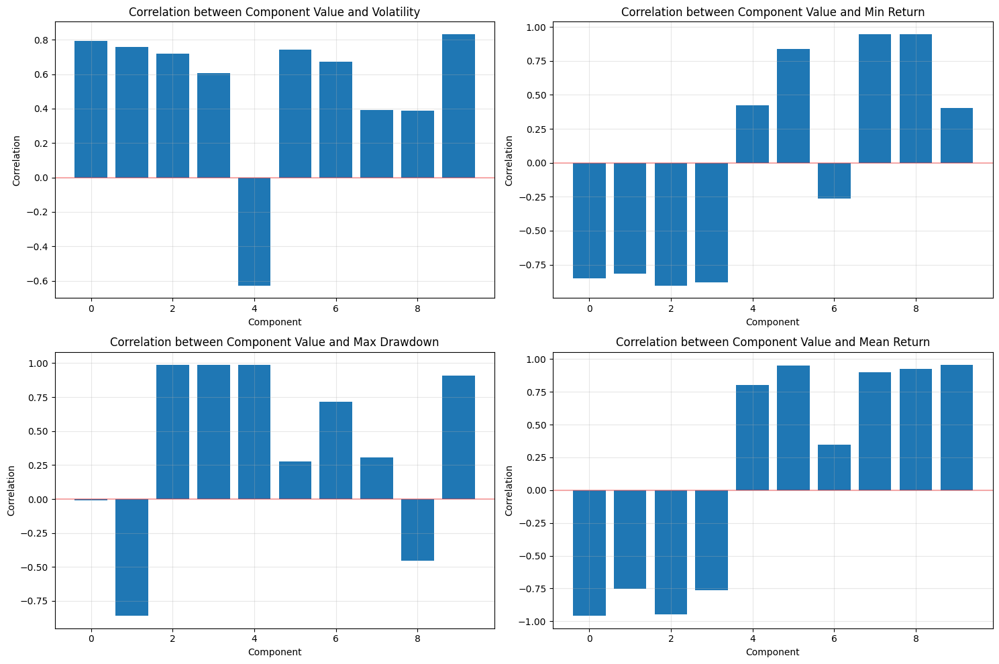

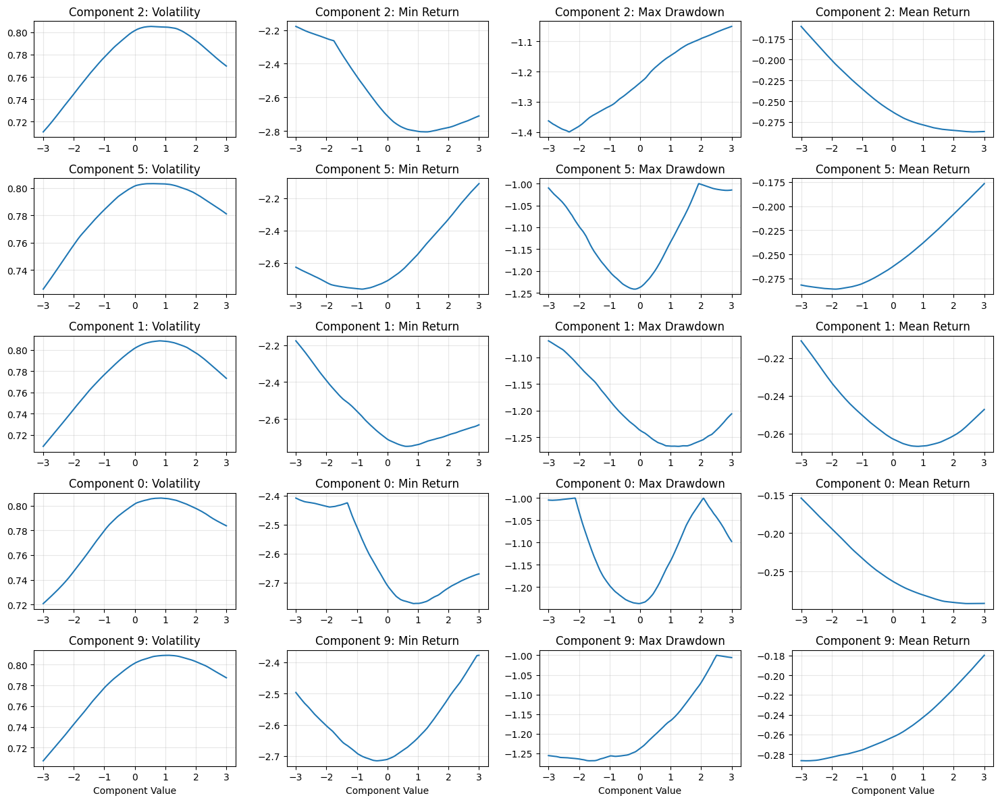

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


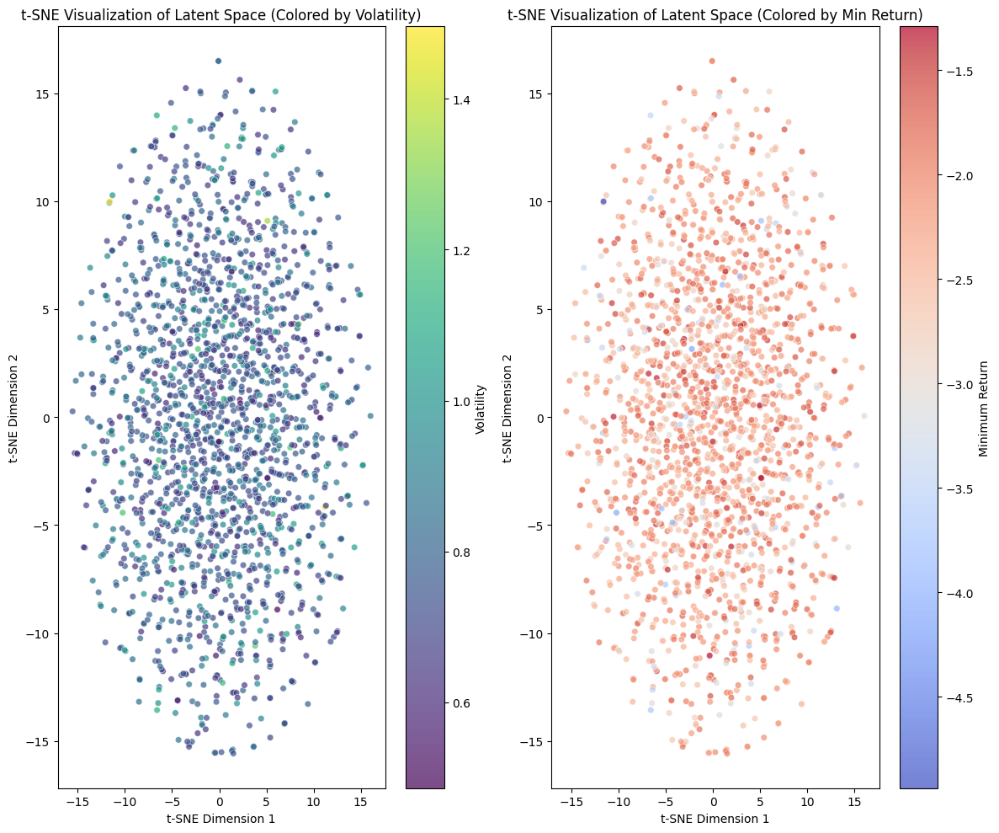

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


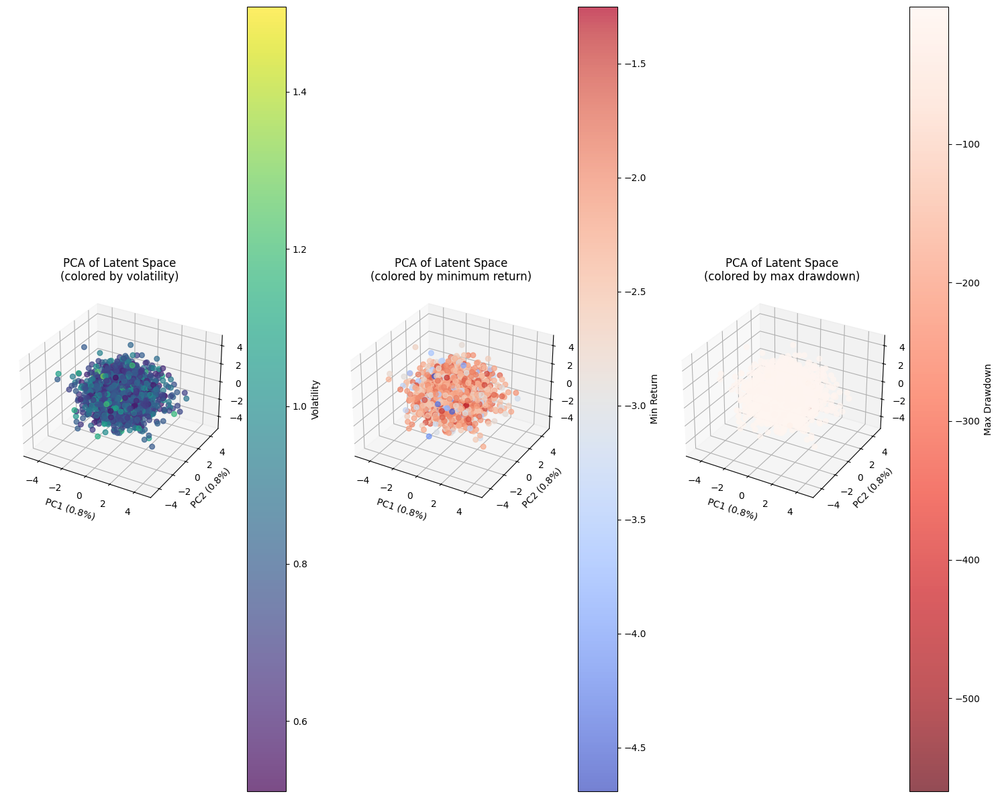

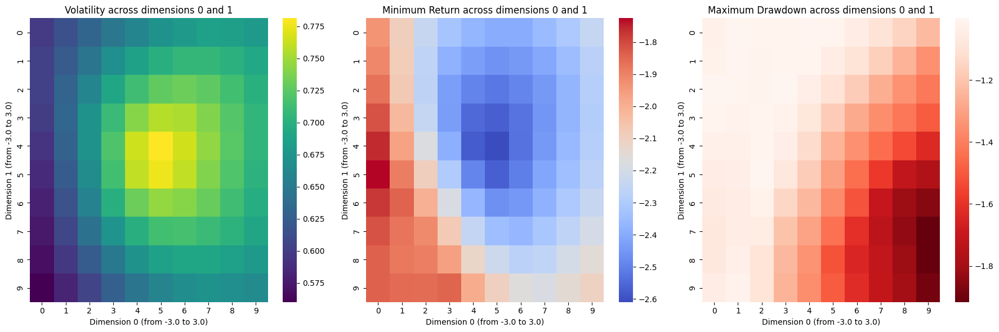

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  6.12it/s]


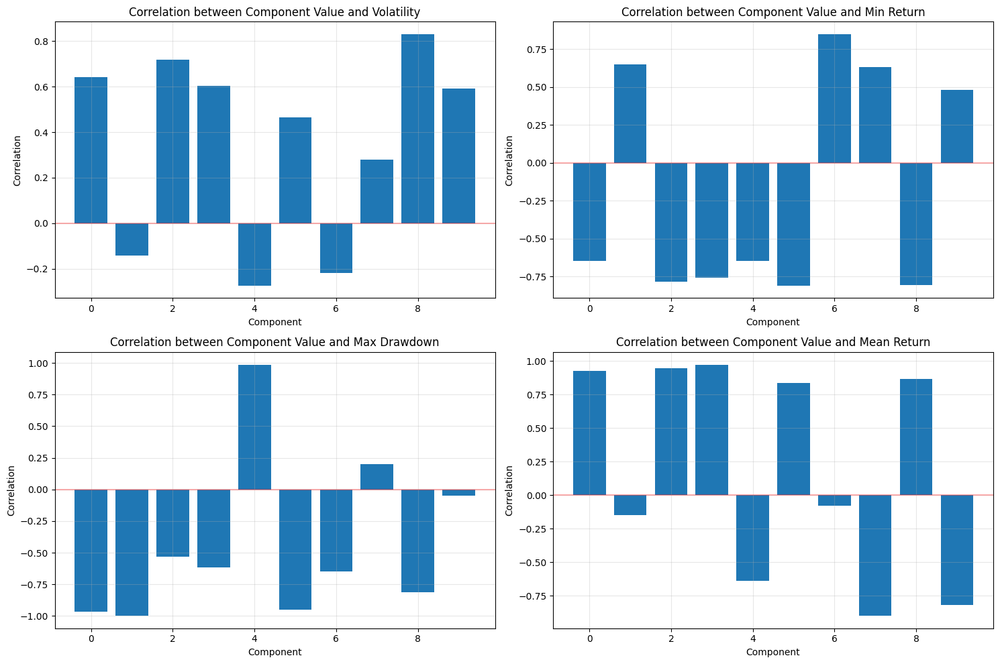

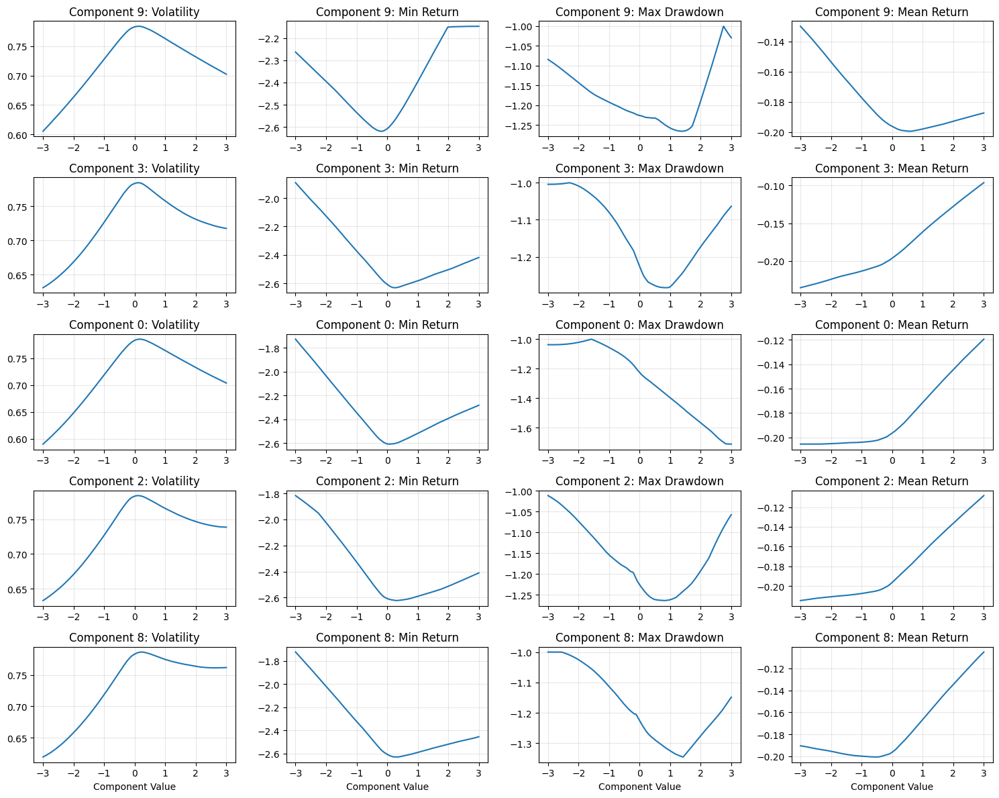

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


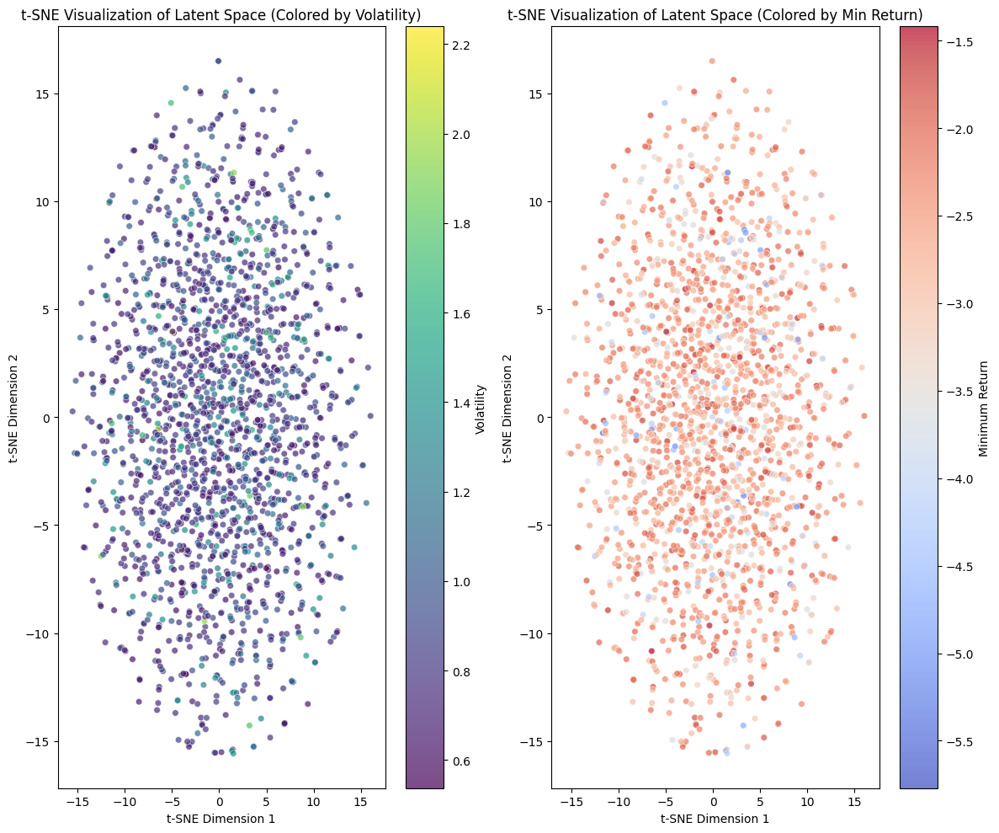

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


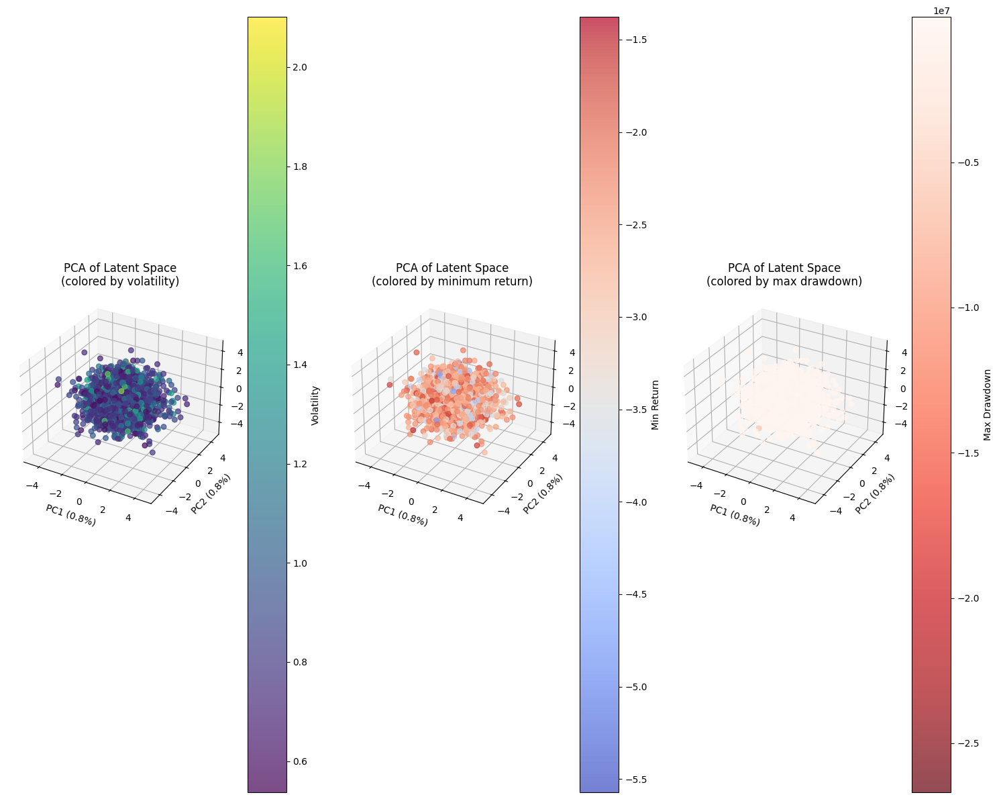

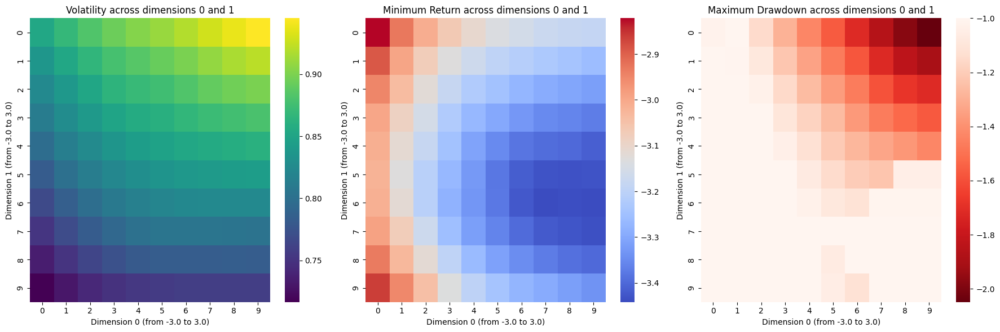

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  6.59it/s]


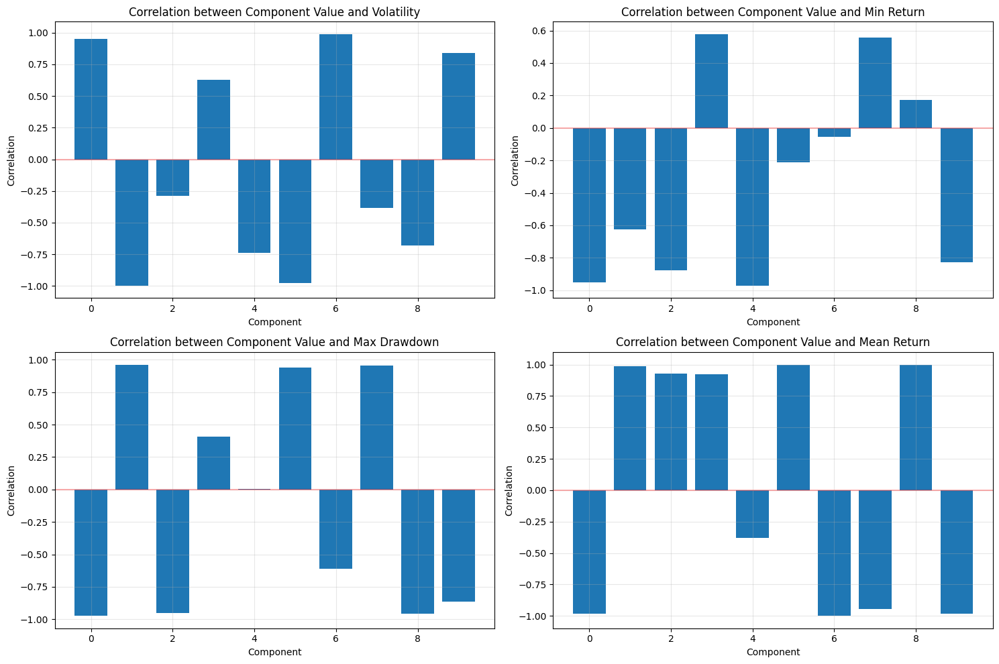

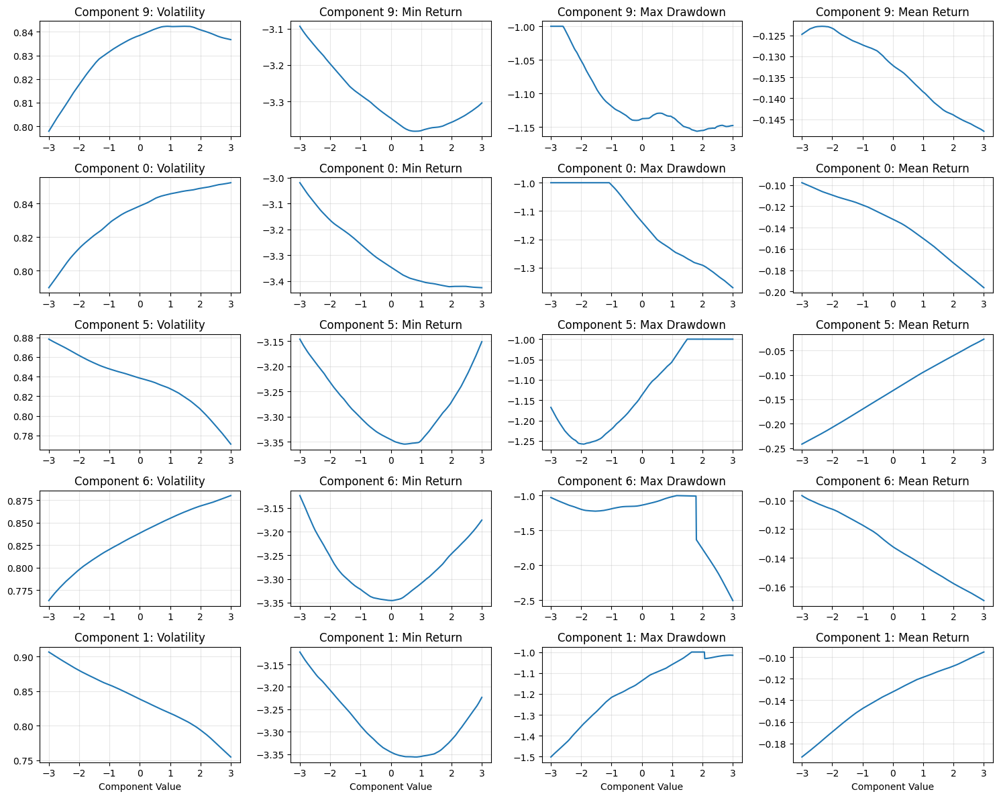

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


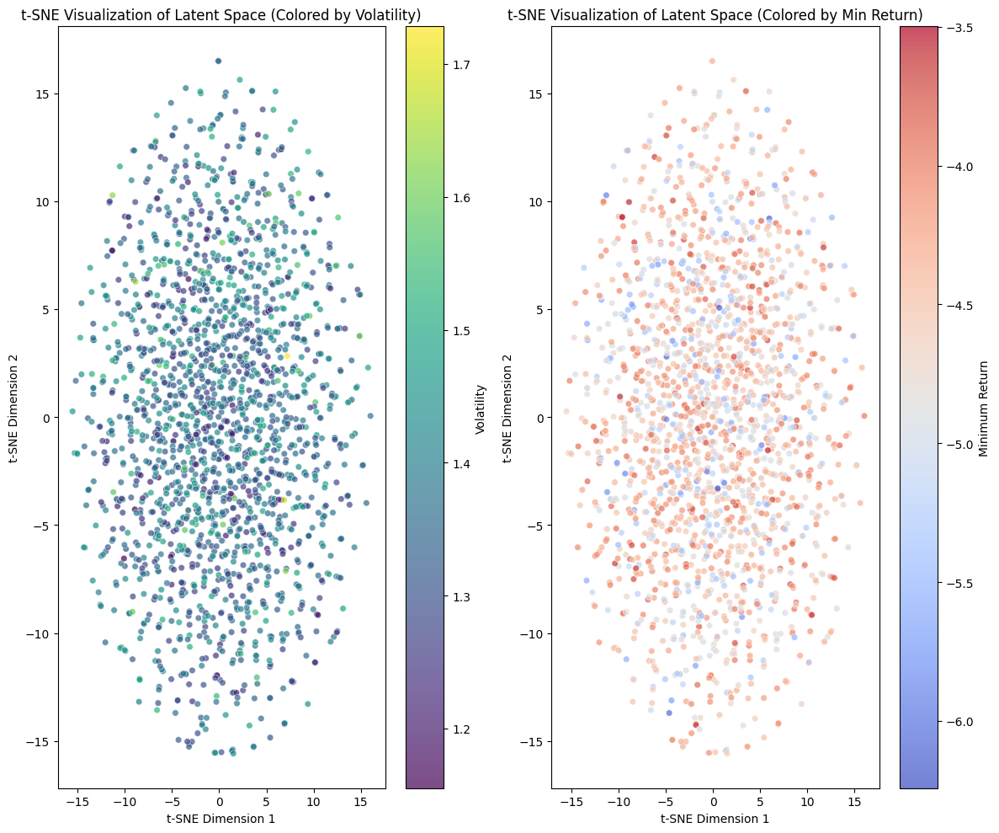

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


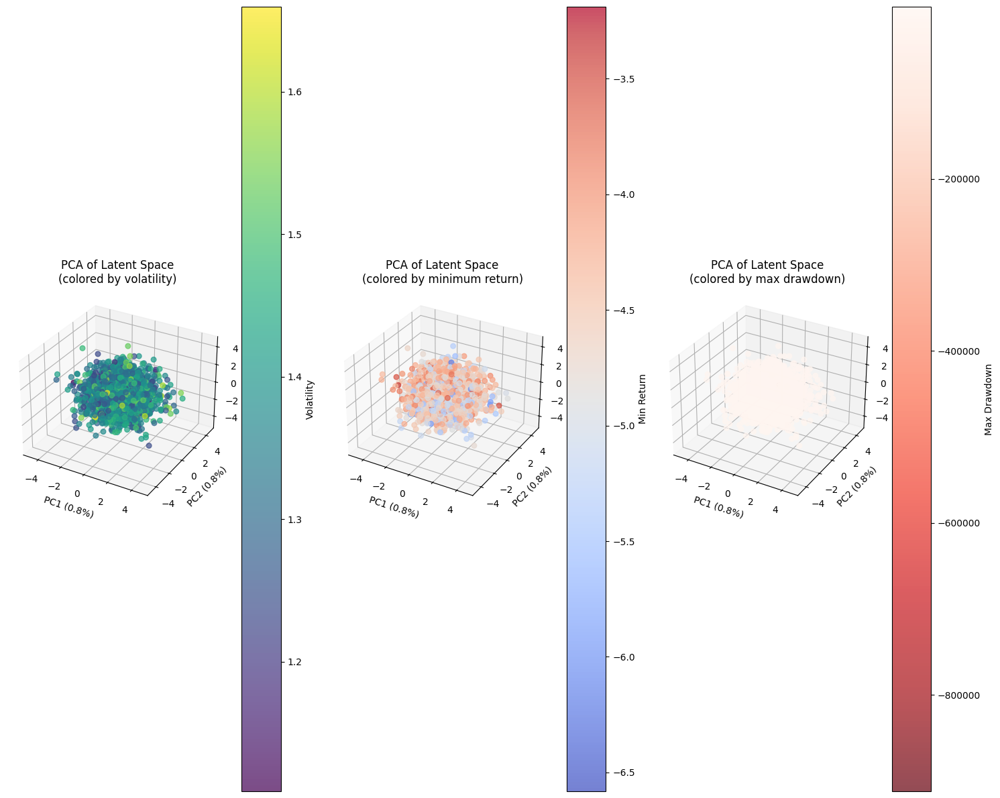

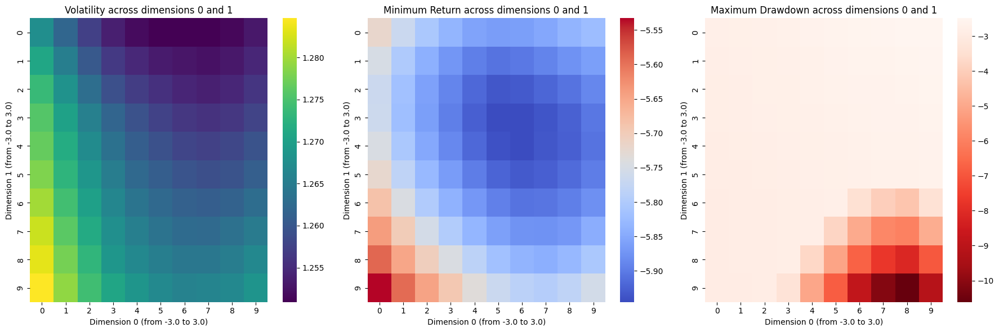

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  6.52it/s]


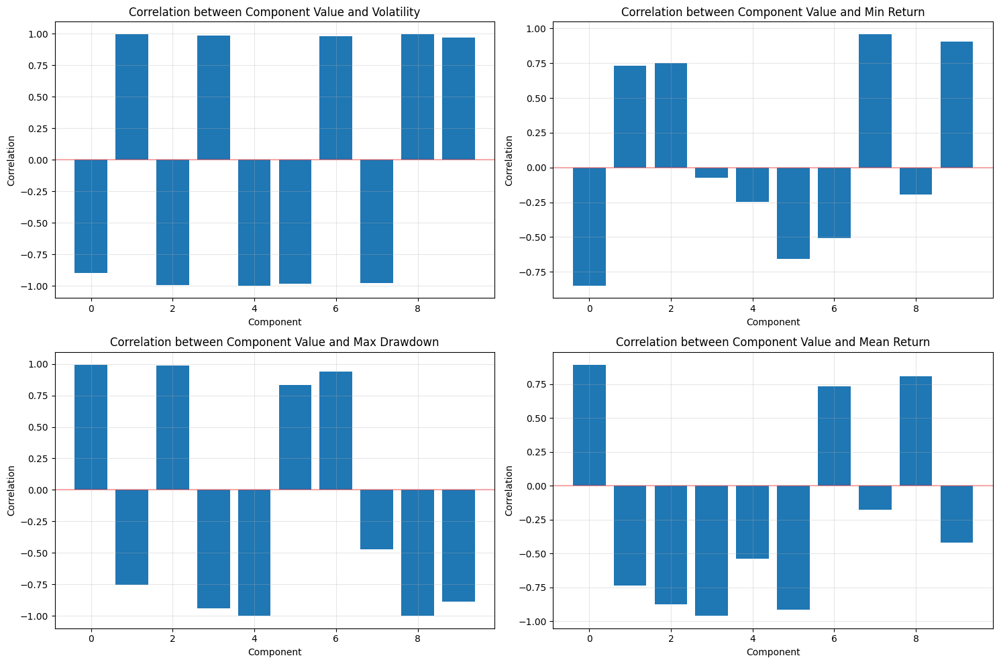

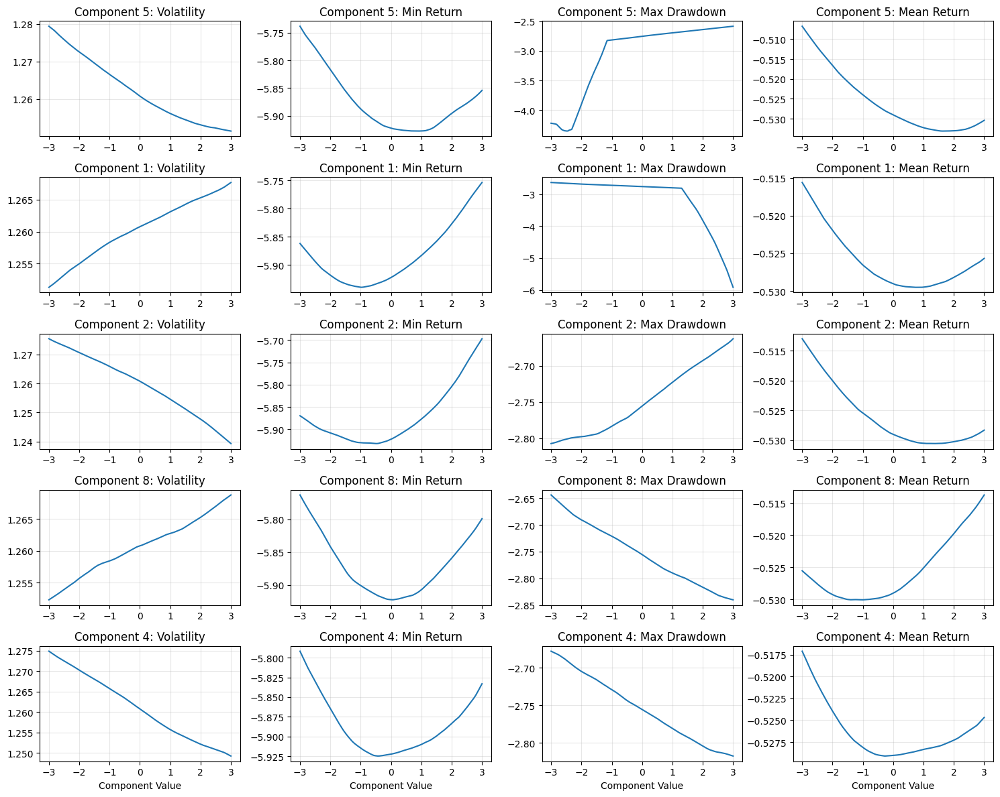

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


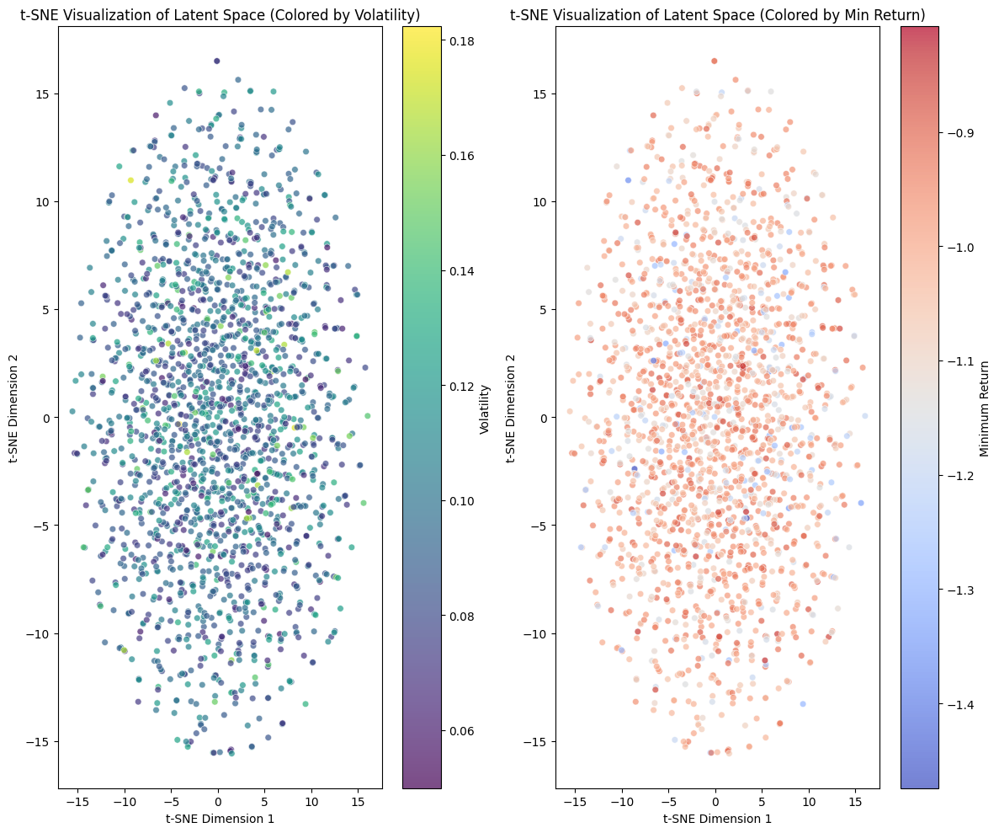

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


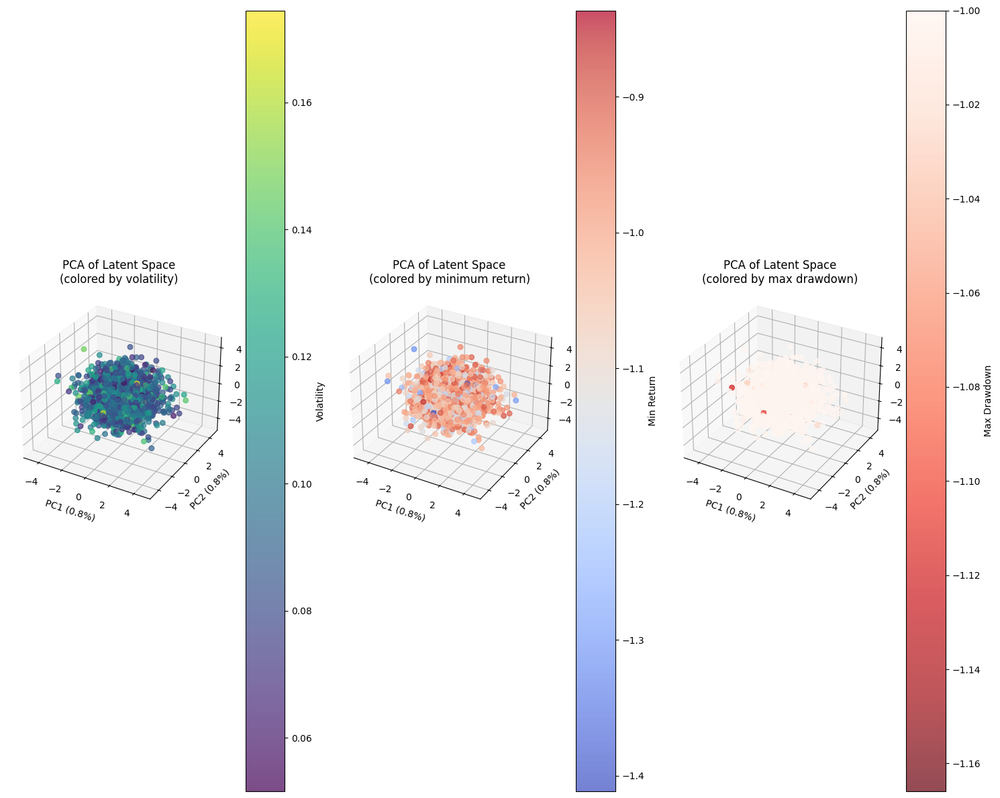

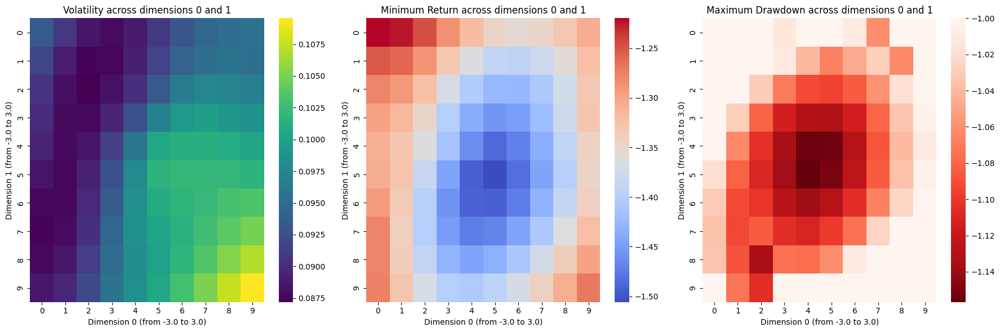

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  6.24it/s]


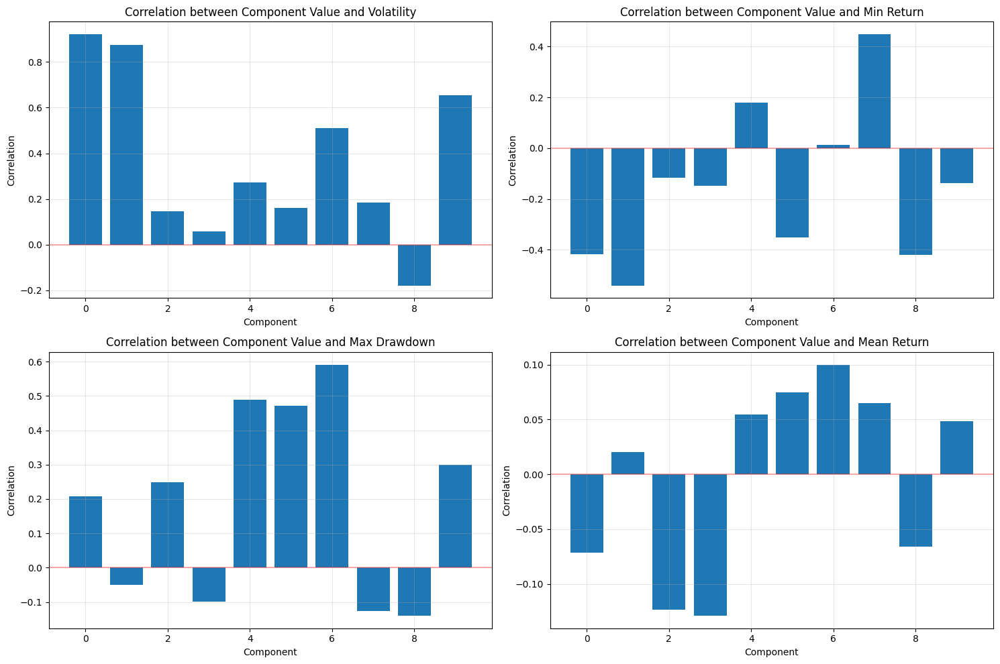

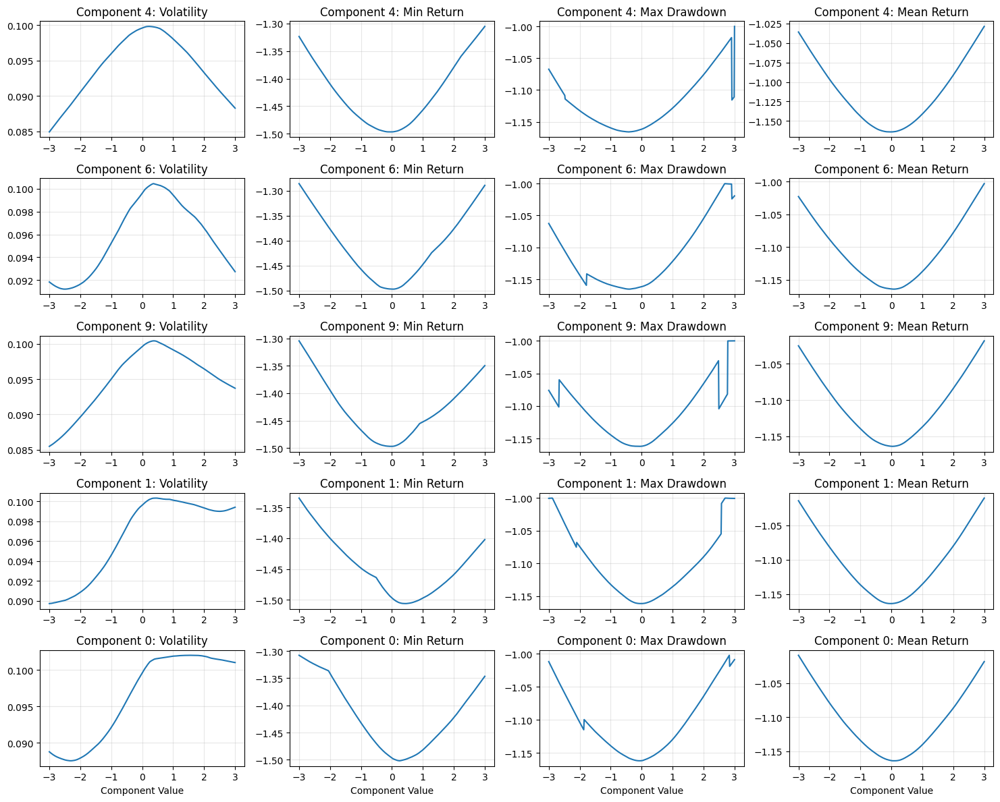

In [ ]:
from internal_models.GANs.explainability.LatentSpaceVisualizer import LatentSpaceVisualizer


for asset_name in gan_dict:
    gan = gan_dict[asset_name]
    #gen_returns = scenarios_results[asset_name]['scenarios_results']

    #explore_latent_space(gan, asset_name)
    #plot_tail_comparison(real_returns, gen_returns)
    # Create the visualizer
    visualizer = LatentSpaceVisualizer(gan, n_samples=2000)

    # Use t-SNE to visualize the latent space
    z_samples, z_tsne, gen_samples = visualizer.visualize_with_tsne(perplexity=30)

    # Use PCA to visualize the latent space in 3D
    z_samples, z_pca, gen_samples = visualizer.visualize_with_pca()

    # Analyze how traversing specific dimensions affects the output
    samples, vol, min_ret, max_dd = visualizer.latent_space_traversal(n_steps=10, dim1=0, dim2=1)

    # Analyze how individual latent dimensions affect the output
    metrics_df, correlations = visualizer.latent_component_analysis(n_components=10)
    



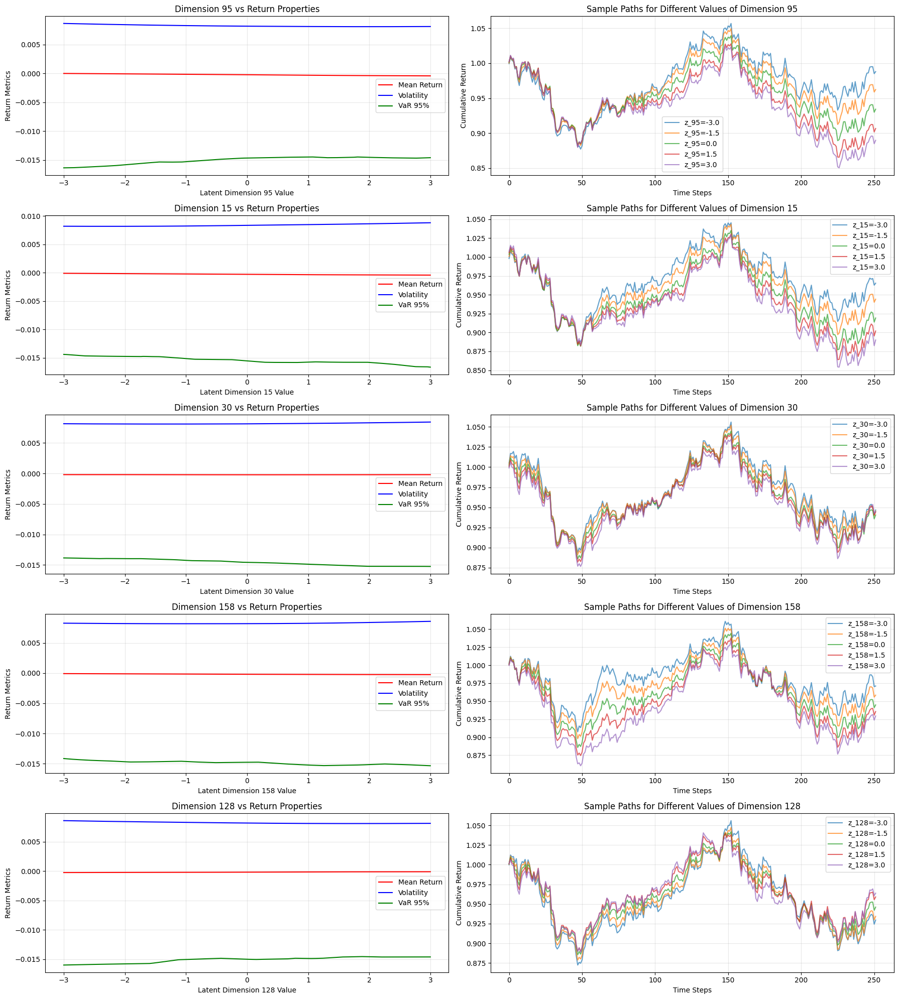

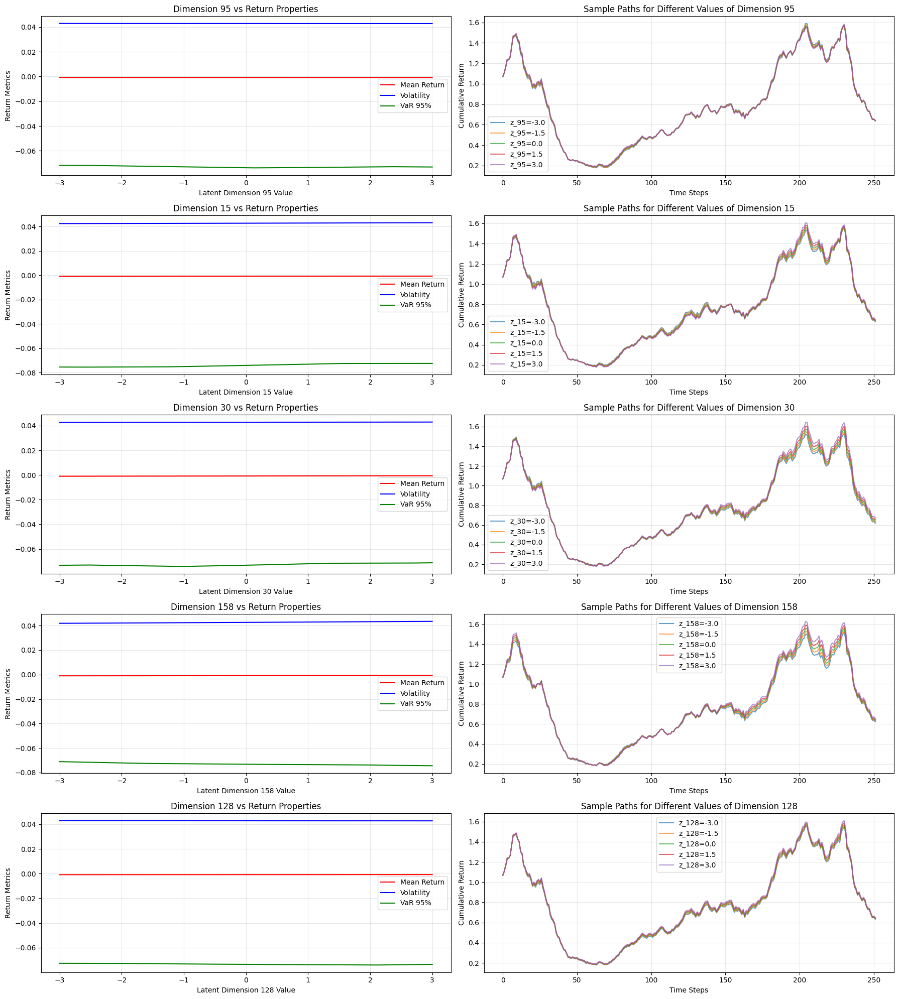

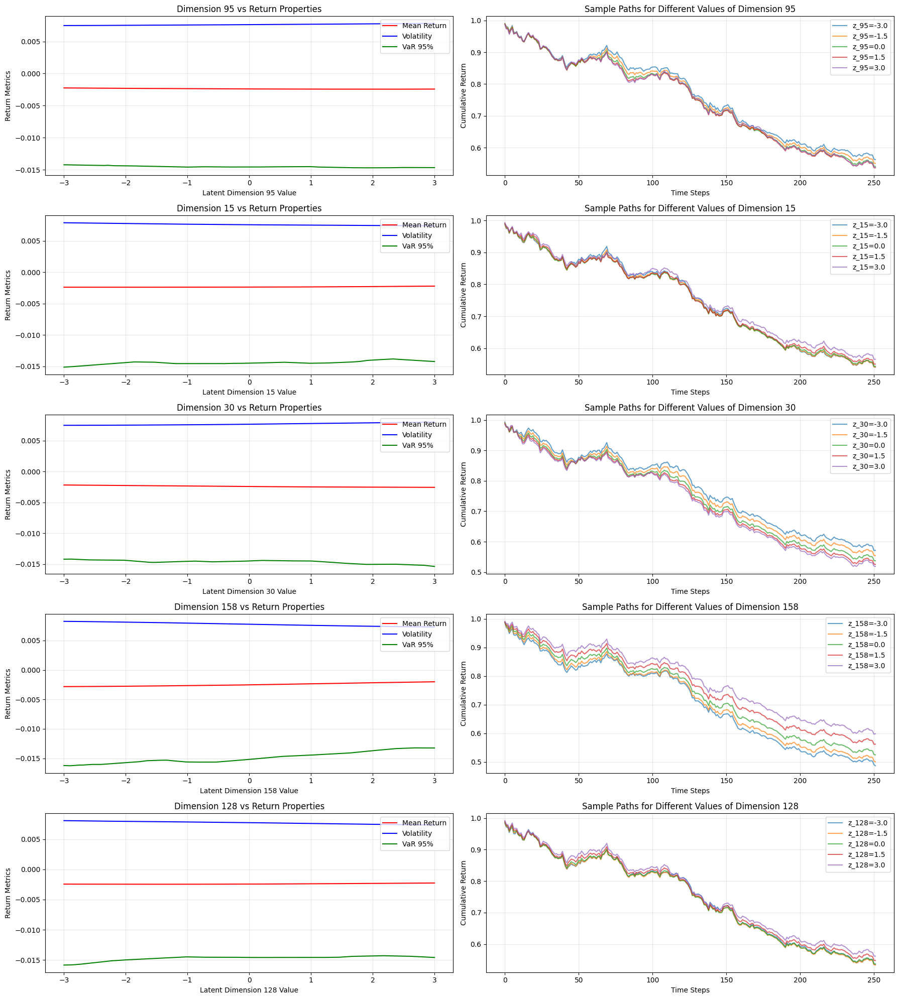

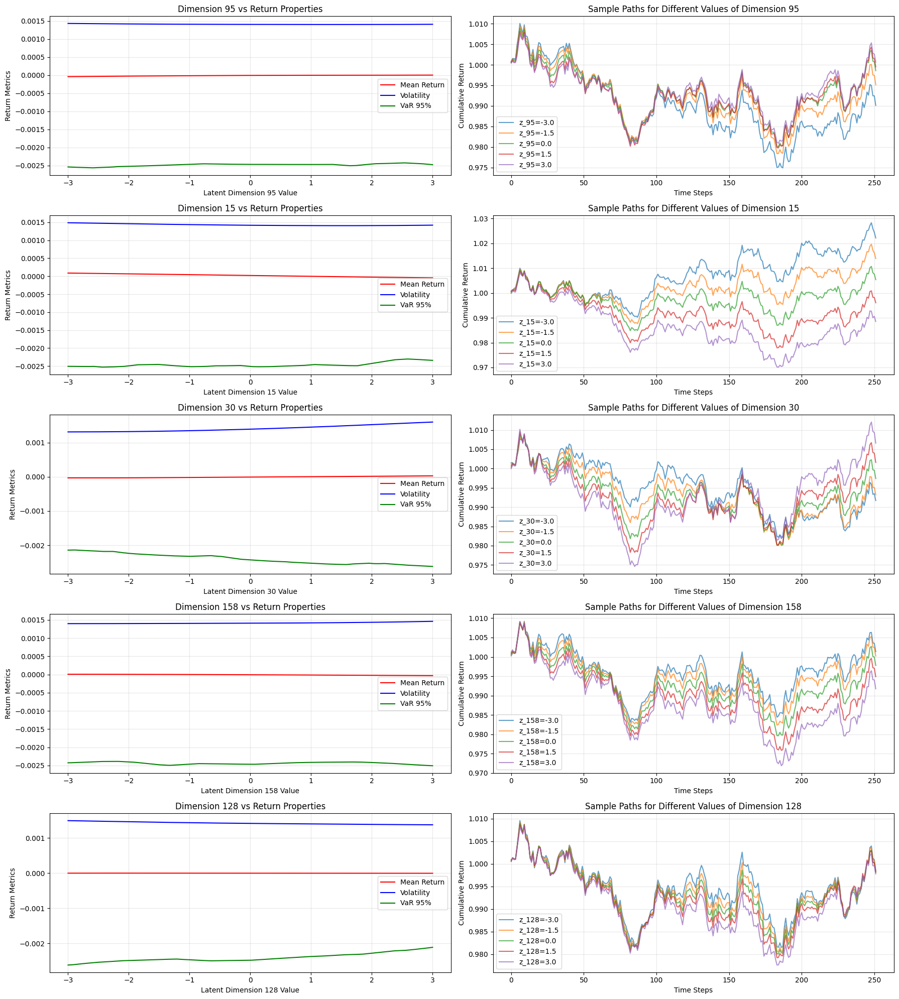

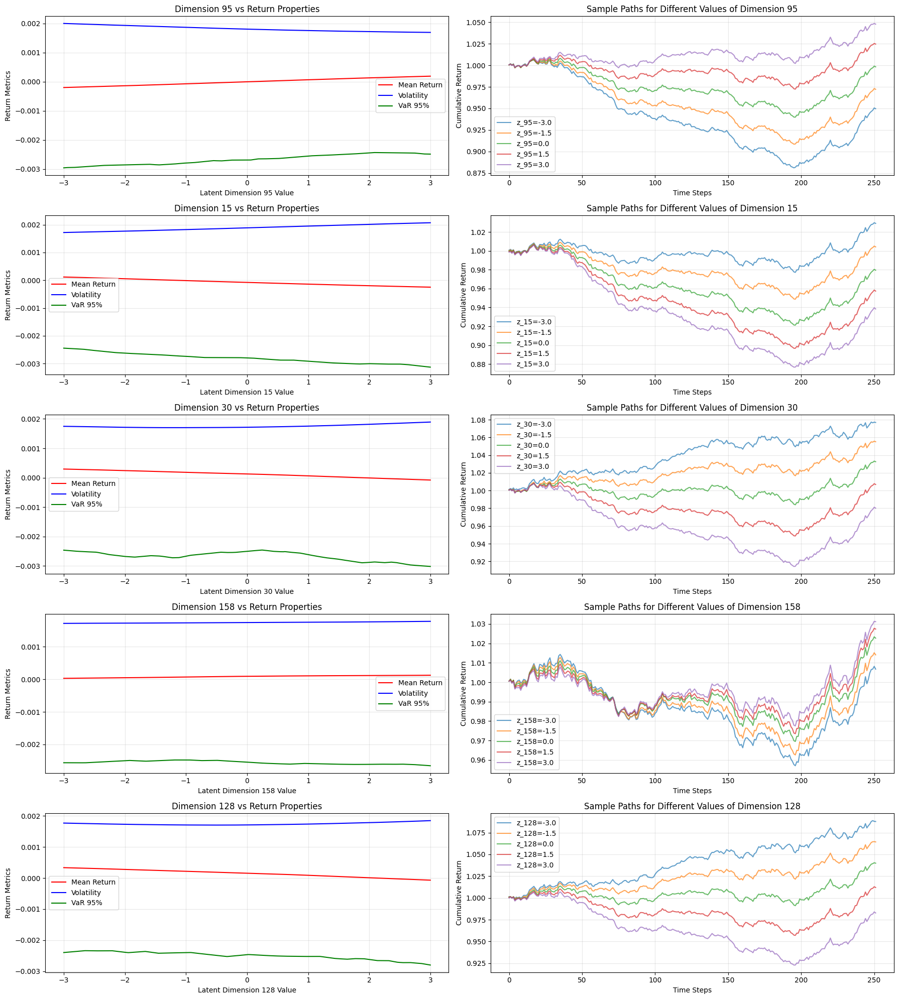

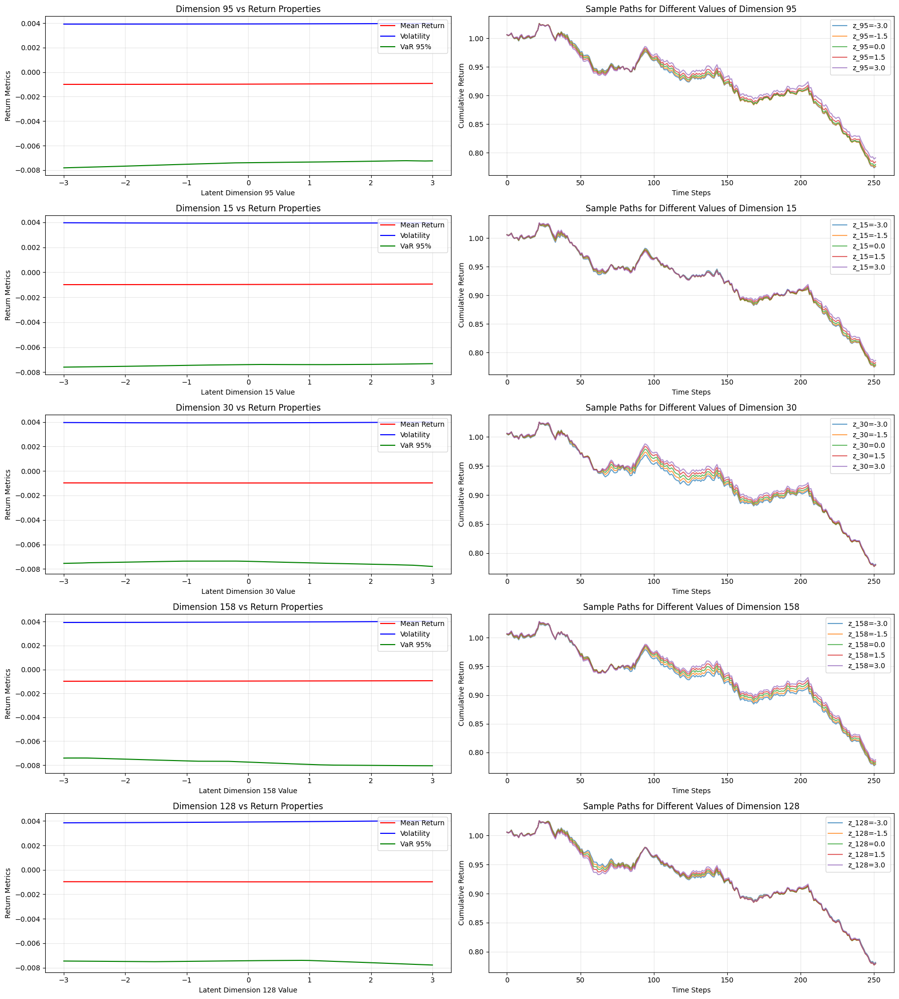

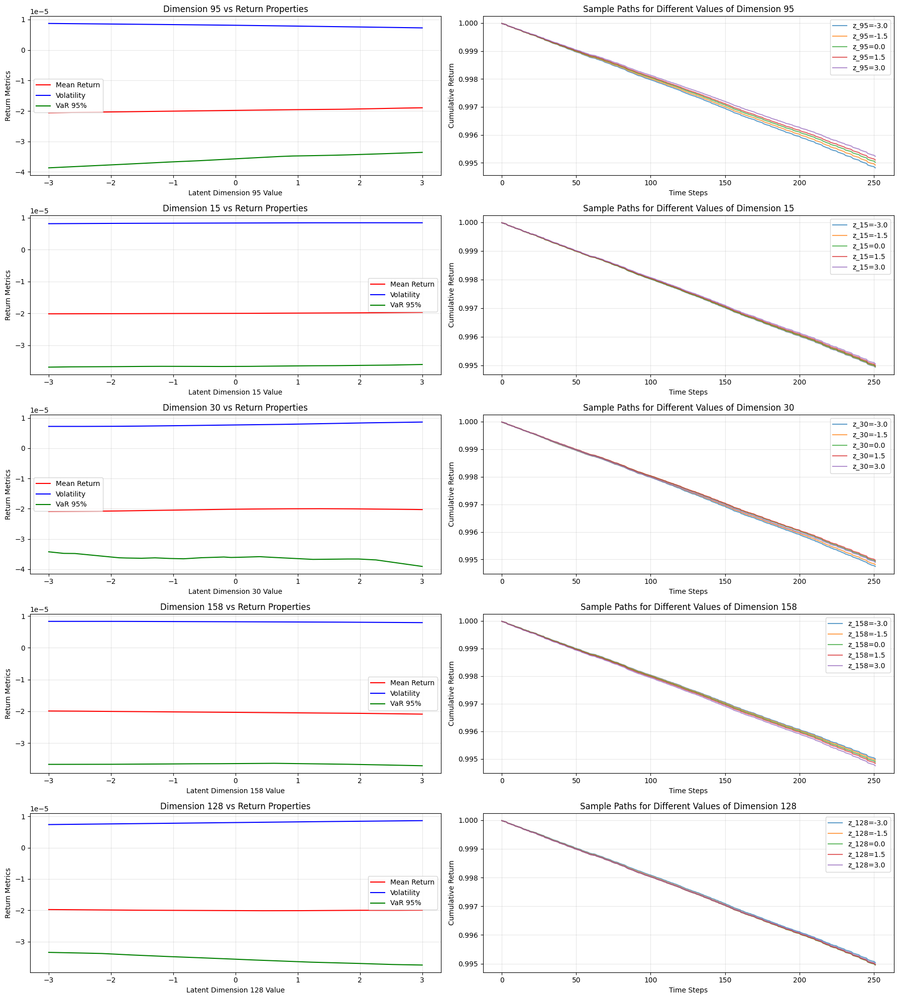

In [ ]:
for asset_name in gan_dict:
    gan_model = gan_dict[asset_name]
    explore_latent_space(gan_model, asset_name)